## Import

In [2]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor

In [3]:
from ML.utils.utils import *
from ML.utils.Data_preparator import Data_preparator
from ML.utils.Model_evaluator import Model_evaluator
from physics.Iso_data_handler import Iso_data_handler
from physics.Data_visualiser import Data_visualiser

In [4]:
pre_path = "../../../../../../../"
physical_model = "MIST"
path_to_data = pre_path + "data/MIST_v1.2_vvcrit0.0_basic_isos/"
path_to_results = pre_path + "results/model_B/default_models/"
path_to_predictions = pre_path + "predictions/model_B/default_models/"
tag = "scale_robust"
output_parameters = ['T_eff', 'log_g', 'radius']
categories_name = ["phase"]

In [5]:
override = True
use_preds = False
save = True
show = True
scaler_name = "robust"

## Data preparation

This notebook contains the results of the model which are trained using all the data from MIST and filtered on the phases

Reading MIST dataframe from MIST_reclassified_iso_full_data.csv file...


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,3.486221,3.131342,-1.0,-0.25,0.100000,0.153402
1,5.0,3.487362,3.126808,-1.0,-0.25,0.102645,0.160326
2,5.0,3.489243,3.119367,-1.0,-0.25,0.107039,0.171785
3,5.0,3.491102,3.112165,-1.0,-0.25,0.111419,0.183099
4,5.0,3.492937,3.105143,-1.0,-0.25,0.115789,0.194305
...,...,...,...,...,...,...,...
1467117,10.3,4.402490,7.777159,6.0,0.50,0.532726,-1.806255
1467118,10.3,4.387132,7.783242,6.0,0.50,0.532730,-1.809295
1467119,10.3,4.371789,7.789130,6.0,0.50,0.532735,-1.812237
1467120,10.3,4.356480,7.794844,6.0,0.50,0.532741,-1.815091


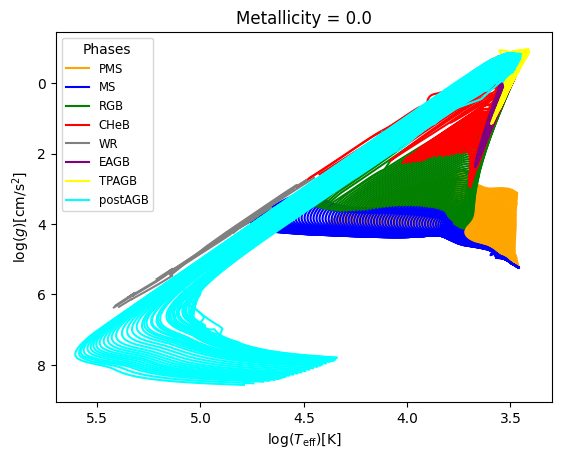

In [6]:
iso_handler = Iso_data_handler(path_to_data, 
                              ['log10_isochrone_age_yr', 'log_Teff', 'log_g', 'phase', 'metallicity', 'star_mass', 'log_R'], 
                              physical_model, reclassify=True)

iso_df = iso_handler.get_isochrone_dataframe()
display(iso_df)
data_visualiser = Data_visualiser(iso_df, physical_model)
data_visualiser.plot_Kiel([], [0.0])

,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,4.494412,4.346972,0.0,-0.25,13.584360,0.610679
1,5.0,4.497517,4.345776,0.0,-0.25,13.765512,0.614753
2,5.0,4.500556,4.344580,0.0,-0.25,13.942887,0.618755
3,5.0,4.504040,4.343050,0.0,-0.25,14.591712,0.624670
4,5.0,4.507576,4.341483,0.0,-0.25,15.426062,0.631187
...,...,...,...,...,...,...,...
630600,10.3,3.602322,1.827453,3.0,0.50,0.866616,1.274247
630601,10.3,3.600999,1.809405,3.0,0.50,0.866614,1.283270
630602,10.3,3.599710,1.791489,3.0,0.50,0.866612,1.292228
630603,10.3,3.598418,1.773621,3.0,0.50,0.866610,1.301161


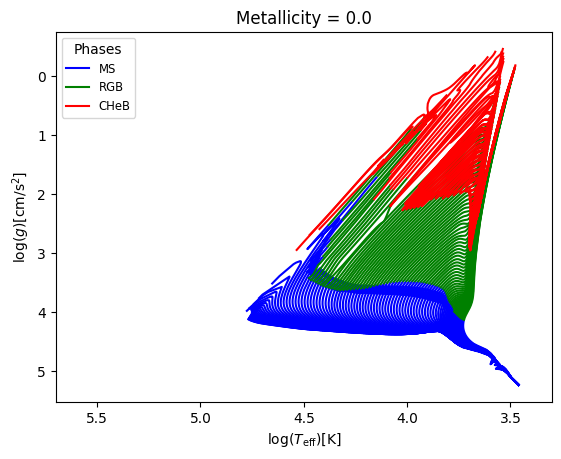

In [7]:
phase_filtered_iso_df = Data_preparator.filter_data(iso_df, {'phase':[0, 2, 3]})
display(phase_filtered_iso_df)
data_visualiser_phase_filtered = Data_visualiser(phase_filtered_iso_df, physical_model)
data_visualiser_phase_filtered.plot_Kiel([], [0.0])

In [8]:
print_all_uniques(phase_filtered_iso_df)

log10_isochrone_age_yr  : Range : 5.0 - 10.3, Mean : 8.1154, Median : 8.15

log_Teff  : Range : 3.34 - 5.3788, Mean : 4.0283, Median : 3.9761

log_g  : Range : -1.08 - 6.2594, Mean : 3.5075, Median : 3.8521

Values in phase column : 0.0, 2.0, 3.0 

Values in metallicity column : -0.25, -0.5, -0.75, -1.0, -1.25, -1.5, -1.75, -2.0, -2.5, -3.0, -3.5, -4.0, 0.0, 0.25, 0.5 

star_mass  : Range : 0.1 - 298.5448, Mean : 11.4145, Median : 2.8996

log_R  : Range : -1.0 - 3.1298, Mean : 0.735, Median : 0.7005



In [9]:
X_train, X_ivs, y_train, y_ivs, categories_train, categories_ivs = \
    Data_preparator.split_data(phase_filtered_iso_df, x_cols=['log10_isochrone_age_yr', 'metallicity', 'star_mass'], 
                               y_cols=['log_Teff', 'log_g', 'log_R'], categories_cols=['phase'], random_state=12, print_stats=True)

print(X_train.shape, X_ivs.shape)
print(y_train.shape, y_ivs.shape)

Training set statistics:
Range in train data for the log_Teff parameter : 3.344668191350628 - 5.378801600728572
Median value in train data for the log_Teff parameter: 3.976722754899366
Mean value in train data for the log_Teff parameter: 4.028639708216513

Range in train data for the log_g parameter : -1.0828963170617296 - 6.259434356871683
Median value in train data for the log_g parameter: 3.852761890388139
Mean value in train data for the log_g parameter: 3.508503471076473

Range in train data for the log_R parameter : -0.9974628481553472 - 3.129269620812593
Median value in train data for the log_R parameter: 0.7005259212303901
Mean value in train data for the log_R parameter: 0.7346615625058007

Testing set statistics:
Range in test data for the log_Teff parameter : 3.3447003632081813 - 5.3787504733463445
Median value in test data for the log_Teff parameter: 3.9741415586935043
Mean value in test data for the log_Teff parameter: 4.027301245585765

Range in test data for the log_g pa

## Model training

### Linear regression

In [10]:
lr_evaluator = Model_evaluator("linear_regression", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_robust train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.7503697754371128
  RMSE :  0.1786701782163251
  MAE :  0.1527697218176364
  MedAE :  0.15385964037282296
  CORR :  0.866261429421515
  MAX_ER :  0.7158267661817019
  Percentiles : 
    75th percentile :  0.2103642794403594
    90th percentile :  0.2568431329242743
    95th percentile :  0.30189056290733346
    99th percentile :  0.4376512367586676

T_eff results for the phase category with a value of 2.0
  value range :  3.42785685311742 - 4.711472733477716
  RVE :  0.7805873116770906
  RMSE :  0.14836747143553583
  MAE :  0.11890601794054687
  MedAE :  0.10570876409451646
  CORR :  0.8837977866743549
  MAX_ER :  0.6313385072630973
  Percentiles : 
    75th percentile :  0.16586873689798742
    90th percentile :  0.22216422334495506
    95th perc

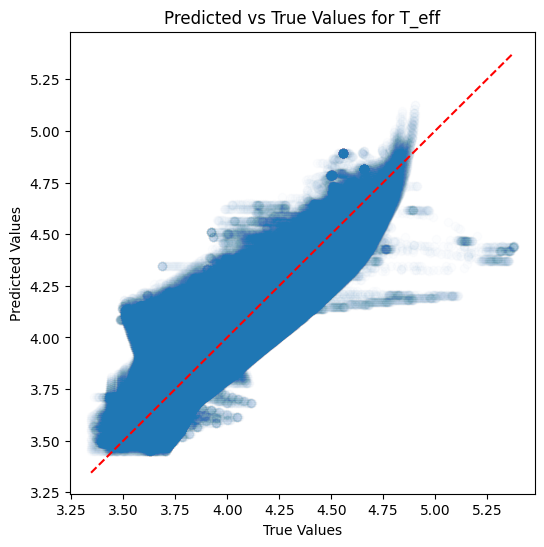

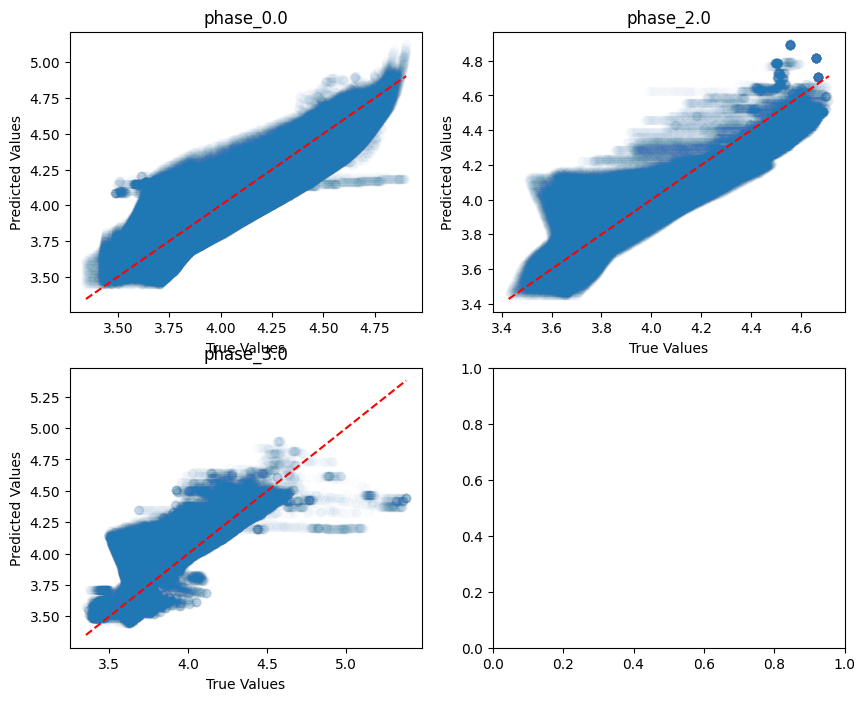

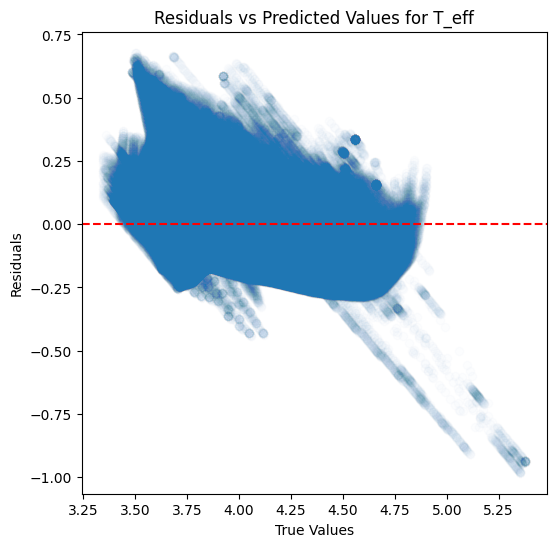

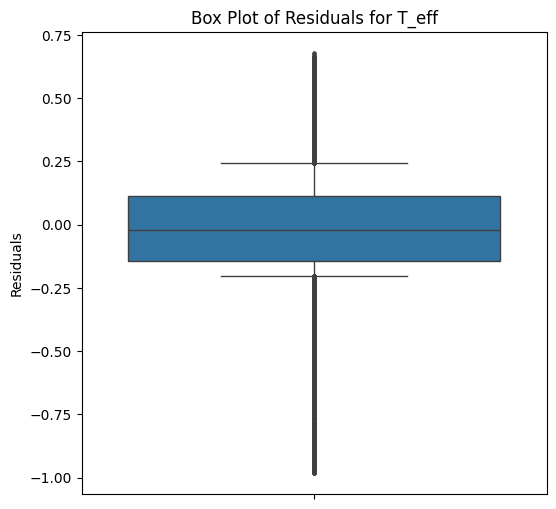

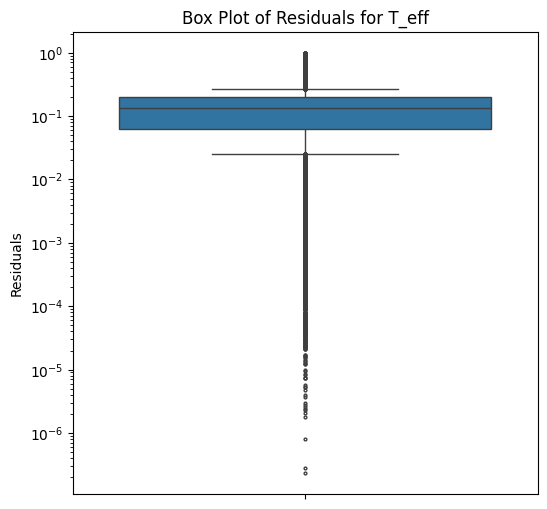

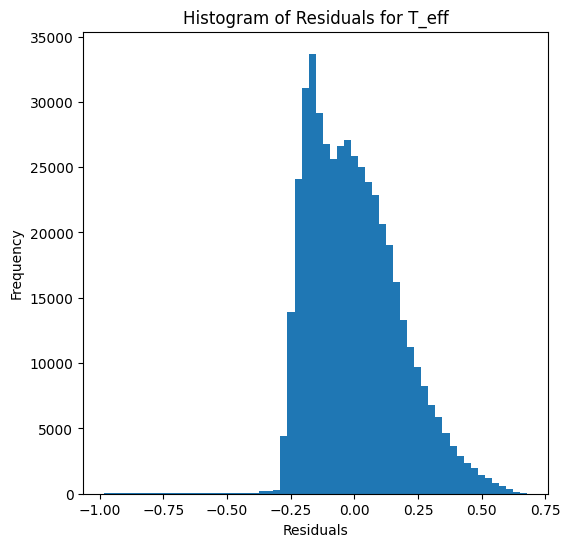

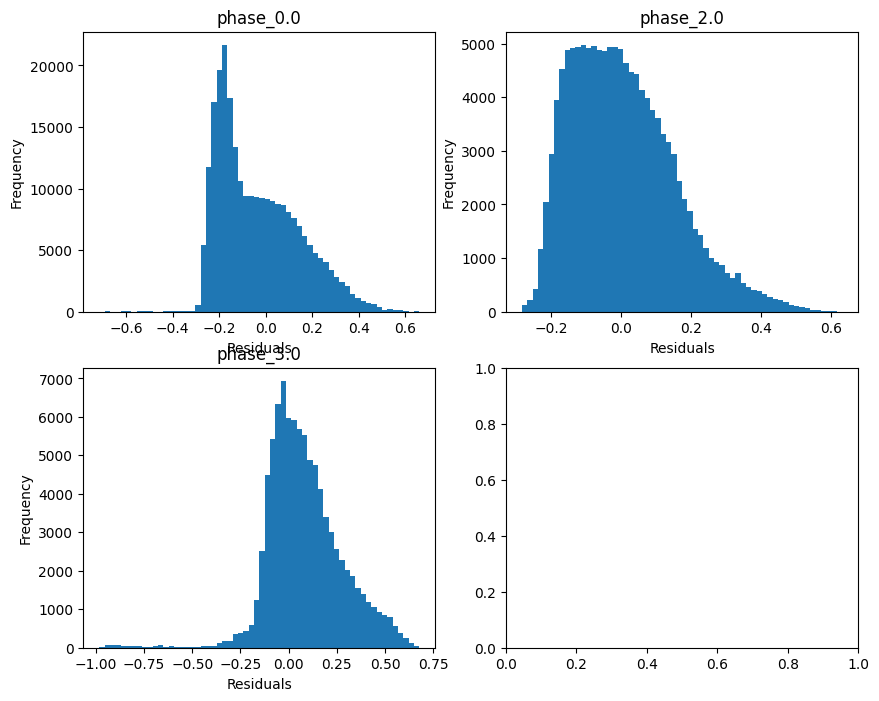

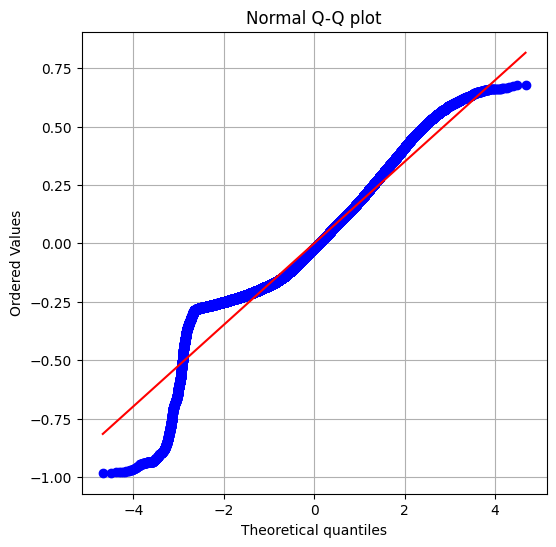

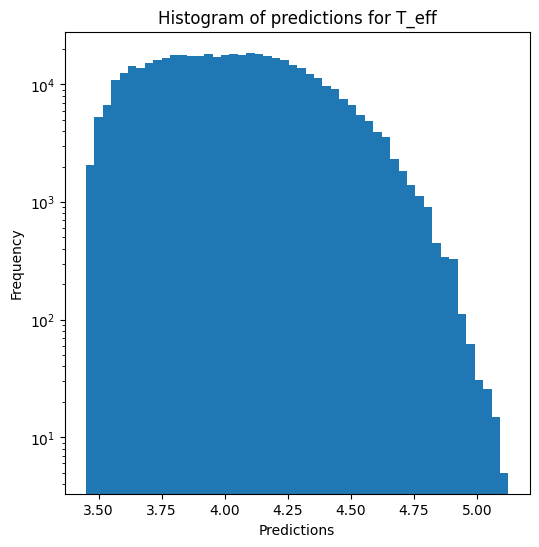

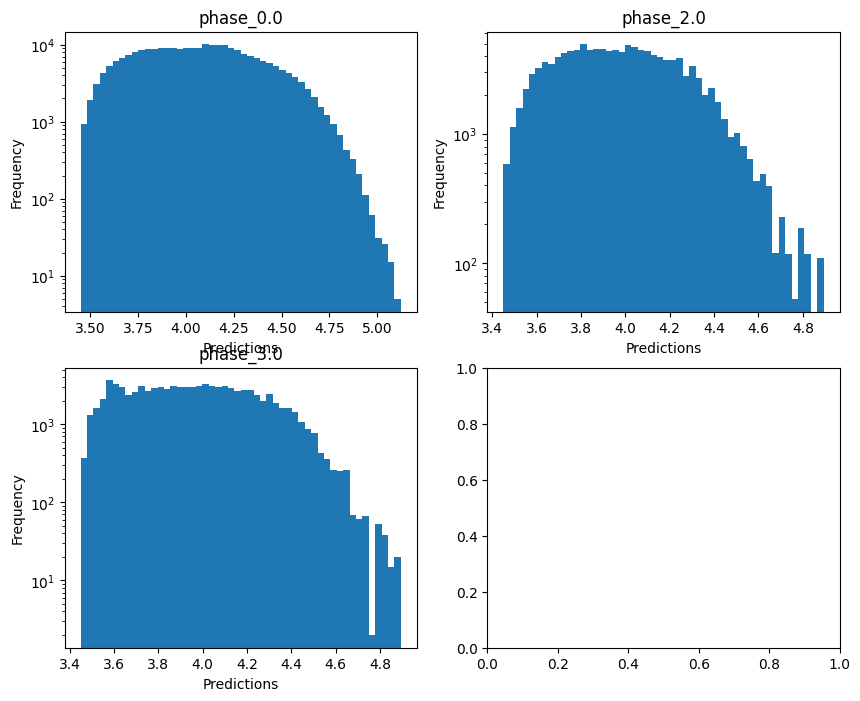

no negative values

log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  -0.06113406410938116
  RMSE :  1.015938155256436
  MAE :  0.8734582859394991
  MedAE :  0.79965663142865
  CORR :  0.2981334175880259
  MAX_ER :  3.8094941348845826
  Percentiles : 
    75th percentile :  1.124029385338165
    90th percentile :  1.6136113077475016
    95th percentile :  1.8676325276492172
    99th percentile :  2.2653352350534894

log_g results for the phase category with a value of 2.0
  value range :  -0.2959230723262505 - 4.408311770676233
  RVE :  0.22451634099645423
  RMSE :  1.049120401372809
  MAE :  0.7942512817172136
  MedAE :  0.5756164969183293
  CORR :  0.4743260904396259
  MAX_ER :  3.3836152444402257
  Percentiles : 
    75th percentile :  1.1814406431783295
    90th percentile :  1.8728378175514793
    95th percentile :  2.2398698067762606
    99th percentile :  2.688135645196883

log_g results for the phase categ

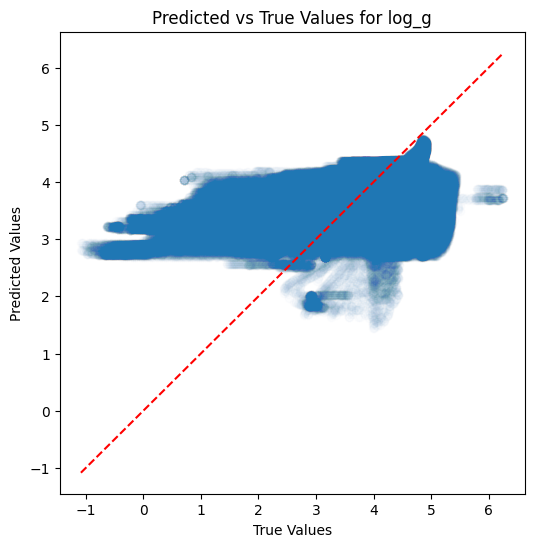

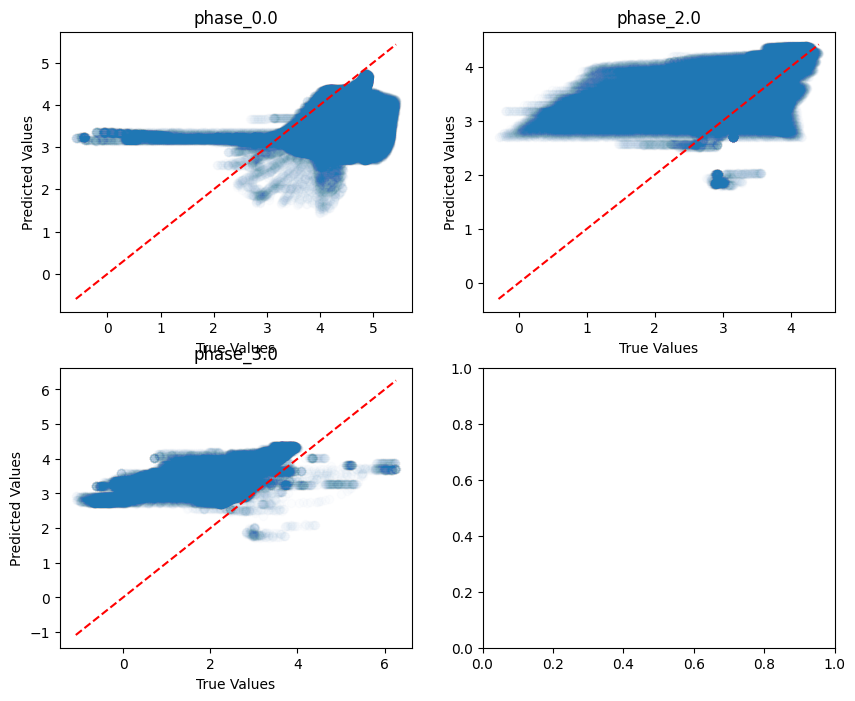

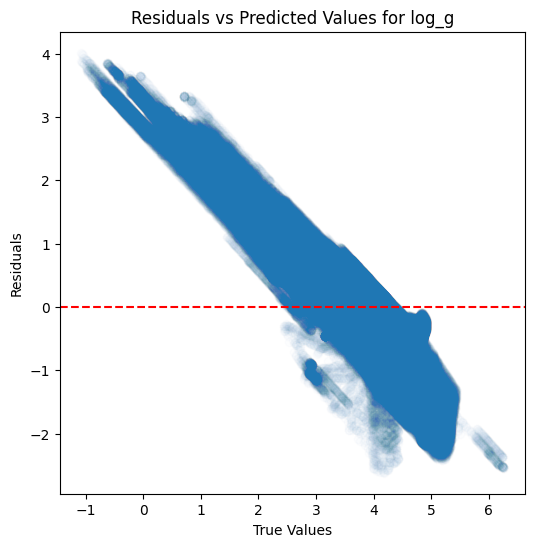

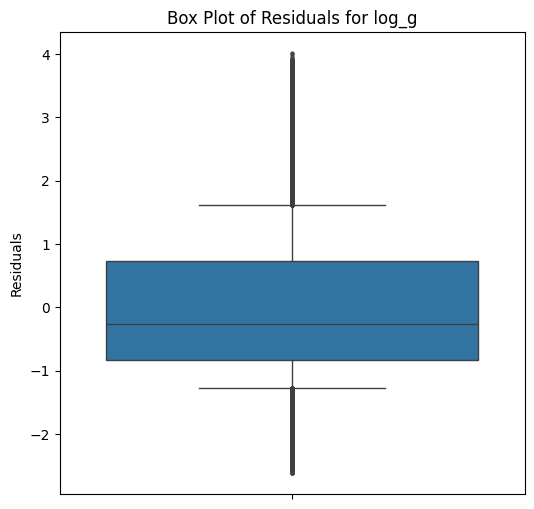

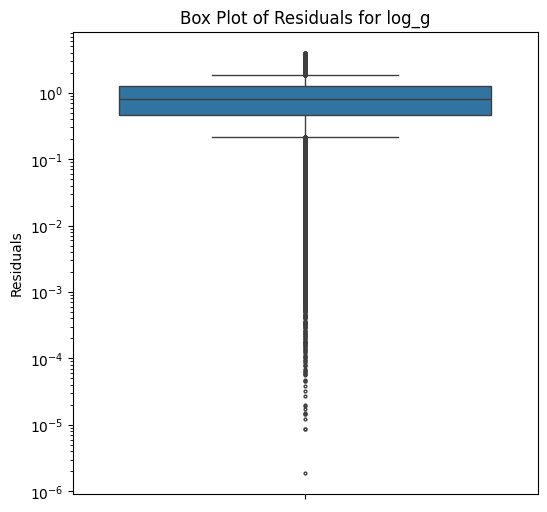

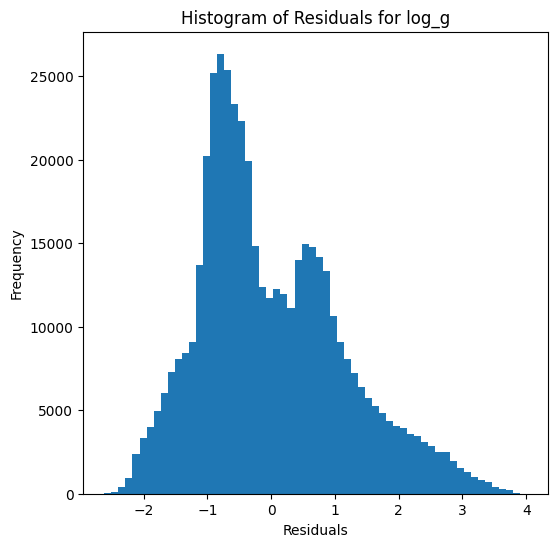

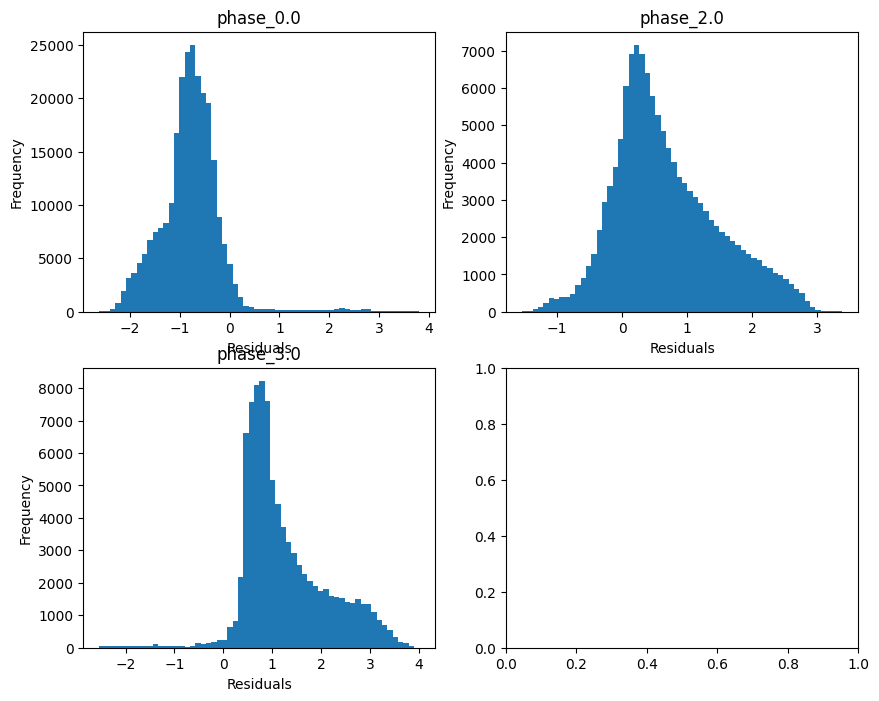

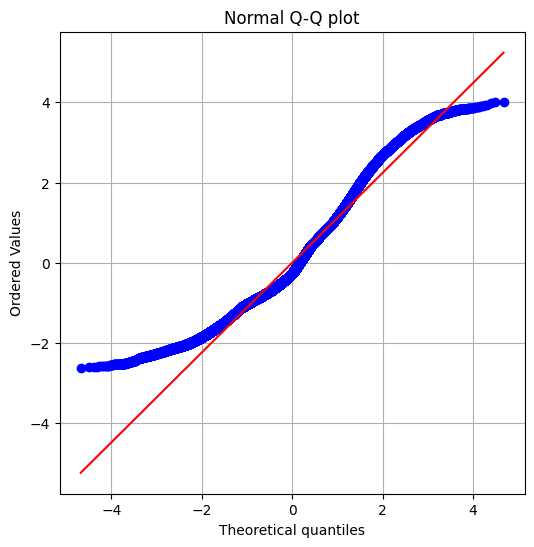

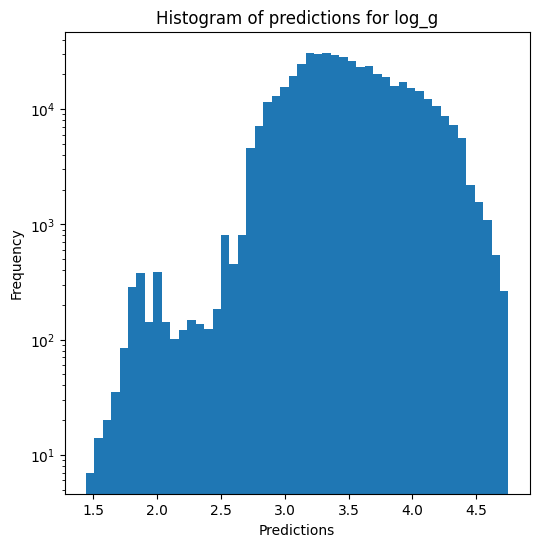

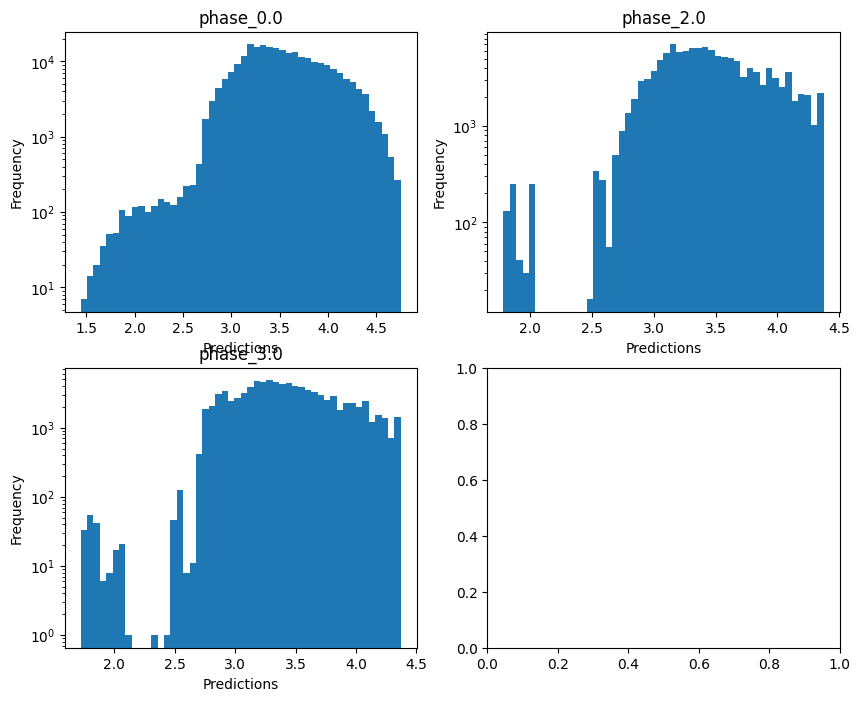

no negative values

radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.44477130186068814
  RMSE :  0.6258804209974942
  MAE :  0.5235237475925603
  MedAE :  0.47616038527158977
  CORR :  0.6719624779362837
  MAX_ER :  2.0435635843545437
  Percentiles : 
    75th percentile :  0.7045079703192287
    90th percentile :  1.0100653716430026
    95th percentile :  1.209914639597431
    99th percentile :  1.4881984830797113

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.891706235288321
  RVE :  0.304632547786984
  RMSE :  0.5829583734189544
  MAE :  0.4633948685494141
  MedAE :  0.36497341476208334
  CORR :  0.5669445250663597
  MAX_ER :  1.7887148220100717
  Percentiles : 
    75th percentile :  0.6678287842168635
    90th percentile :  1.012225780241767
    95th percentile :  1.1936339671259661
    99th percentile :  1.4145188810844926

radius results for the phase

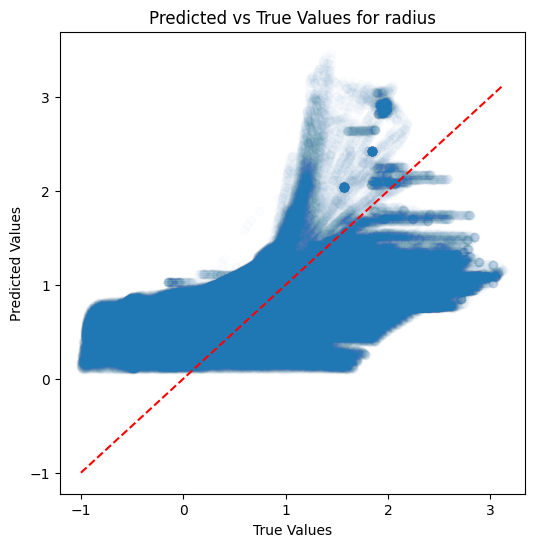

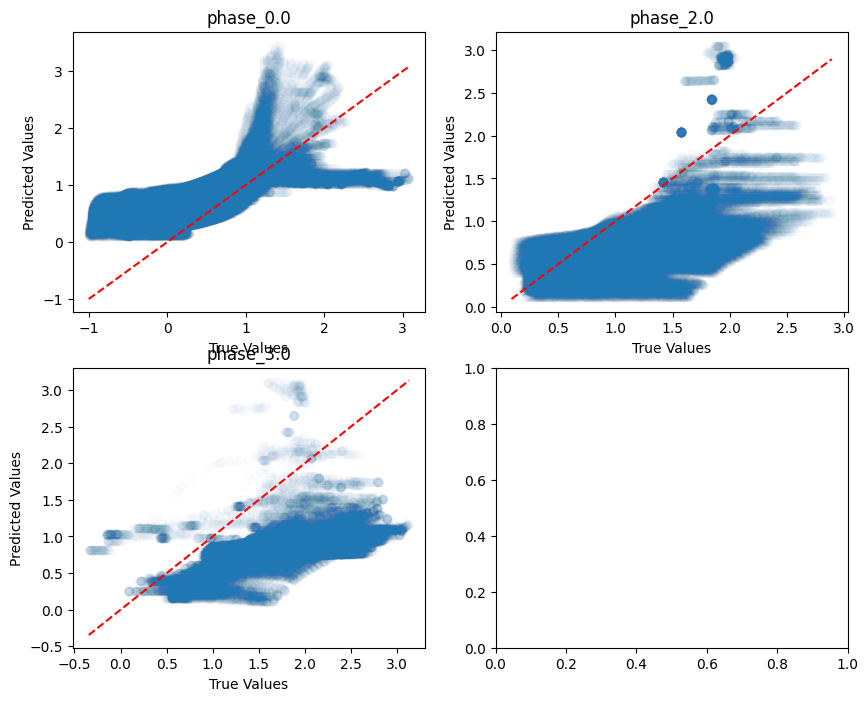

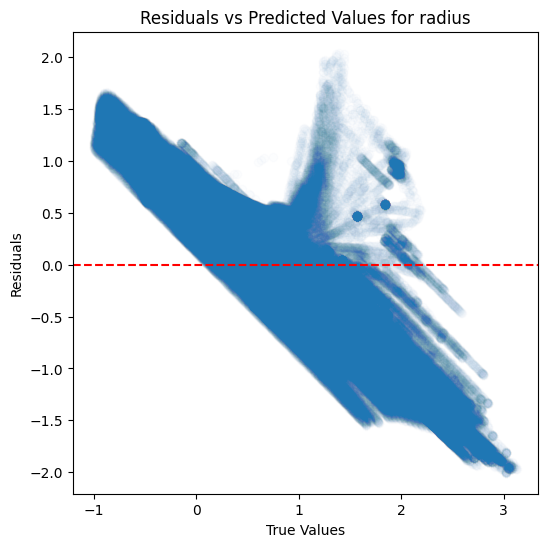

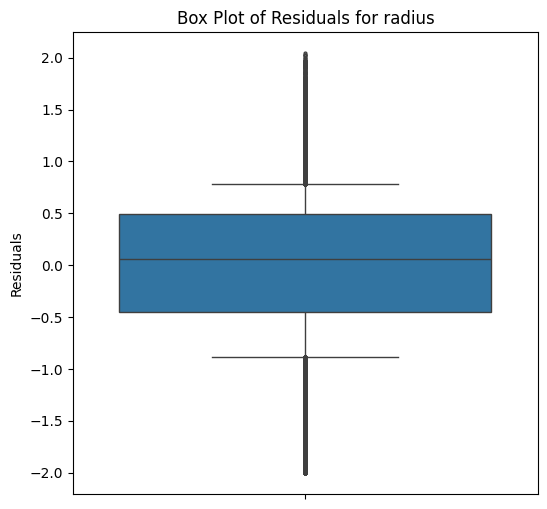

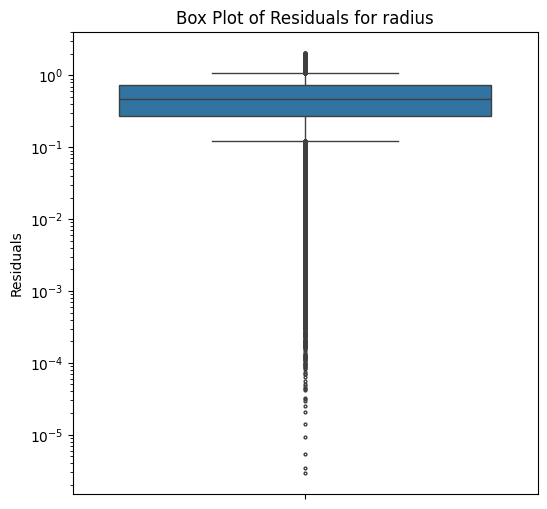

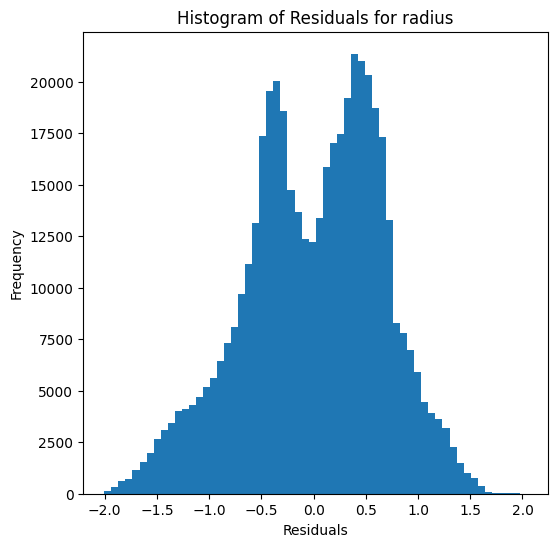

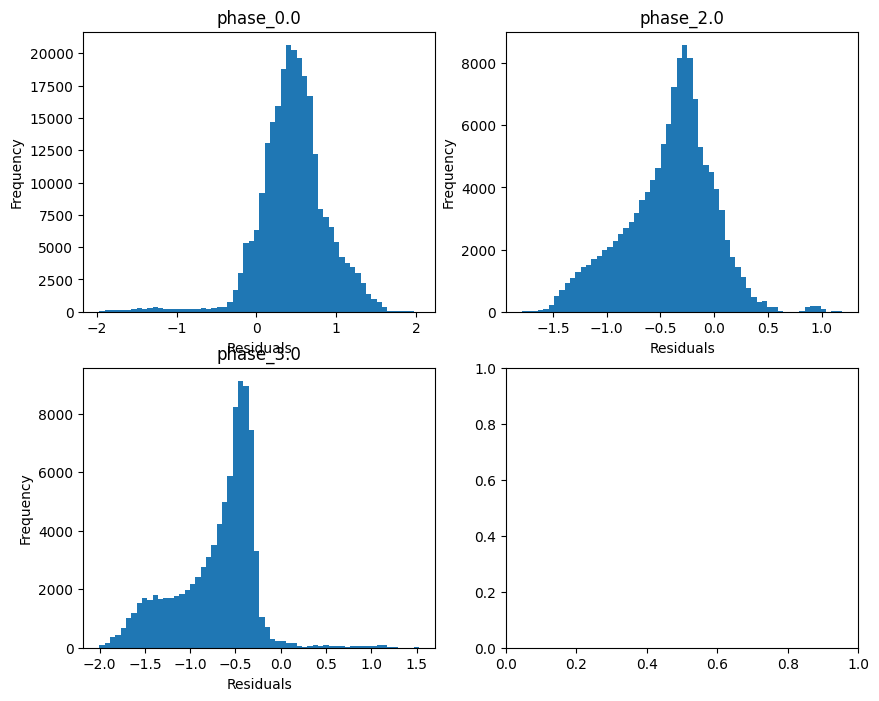

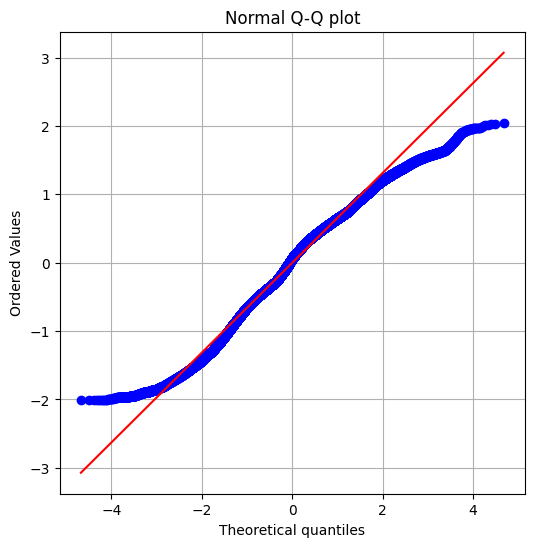

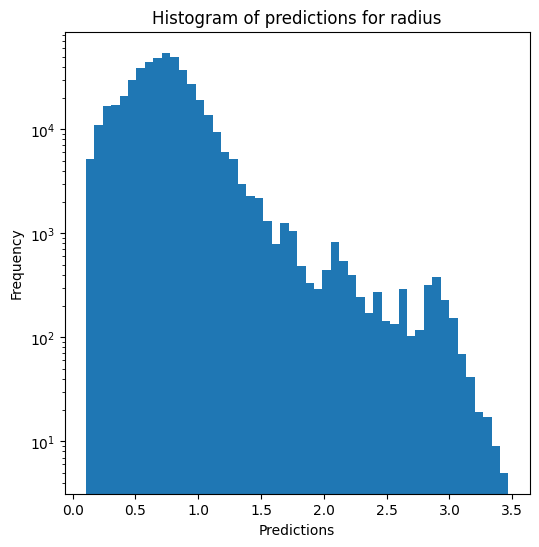

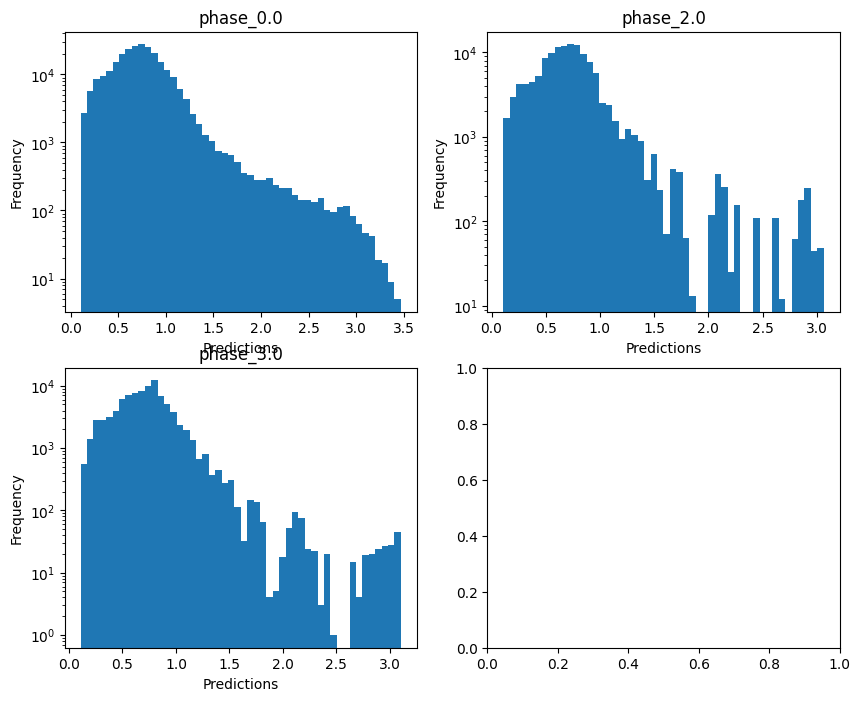

Saving predictions and results...


In [11]:
lr_evaluator.evaluate_Kfold_results(LinearRegression, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name) #, override=False, use_preds=True

### Decision tree

In [12]:
dt_evaluator = Model_evaluator("decision_tree", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_robust train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.959976466104702
  RMSE :  0.07054147550996837
  MAE :  0.011707689039826028
  MedAE :  0.001149865413626383
  CORR :  0.9802015626550209
  MAX_ER :  0.9507131678891638
  Percentiles : 
    75th percentile :  0.002564375252301687
    90th percentile :  0.004736366066672474
    95th percentile :  0.011875044214377883
    99th percentile :  0.4084184200978587

T_eff results for the phase category with a value of 2.0
  value range :  3.42785685311742 - 4.711472733477716
  RVE :  0.9589530393867527
  RMSE :  0.0641141825882045
  MAE :  0.023920145879249528
  MedAE :  0.0032327488488475
  CORR :  0.979422173806773
  MAX_ER :  0.8470942576263263
  Percentiles : 
    75th percentile :  0.00793228542409552
    90th percentile :  0.08255524590948093
    95

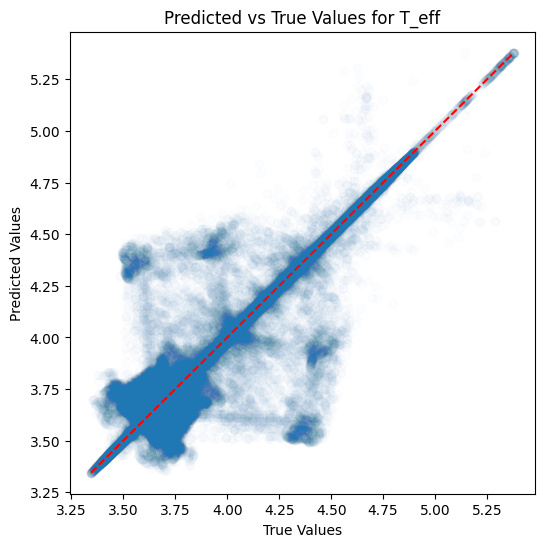

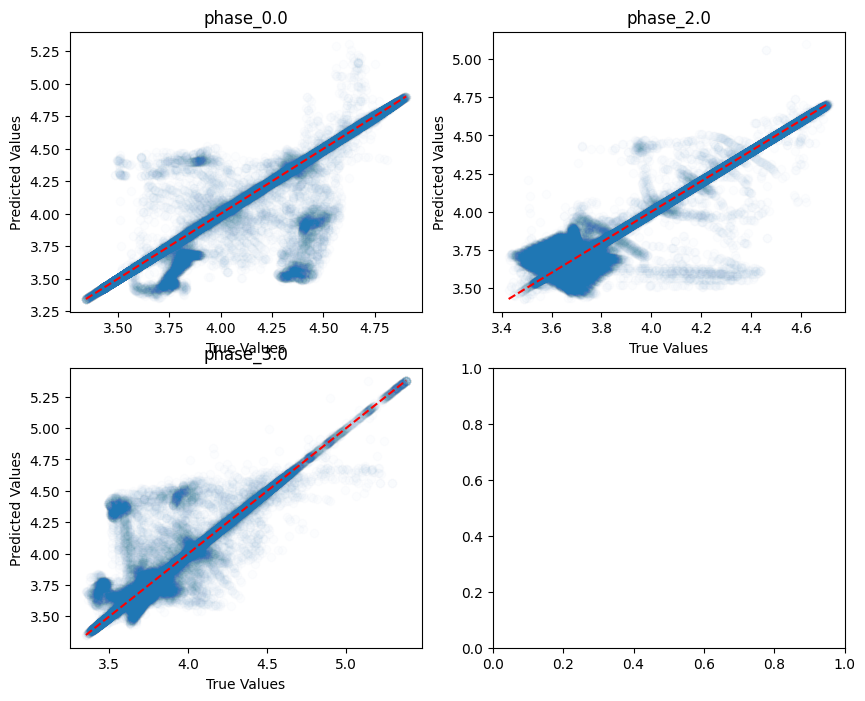

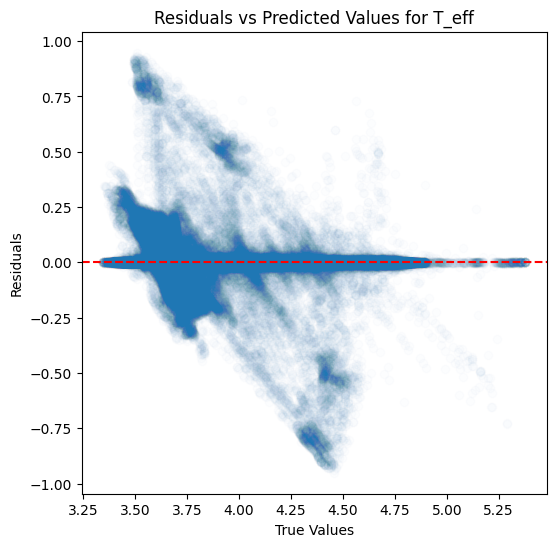

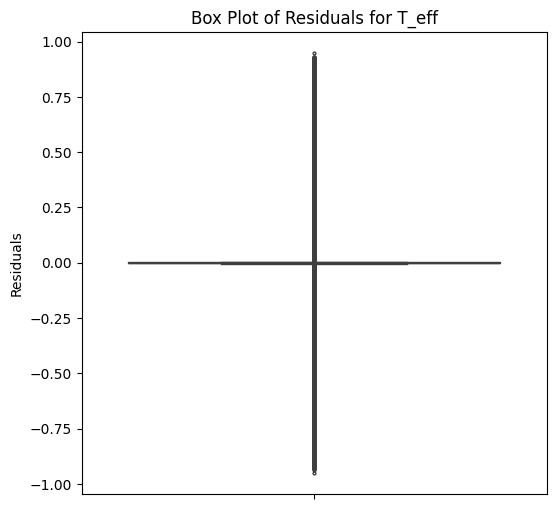

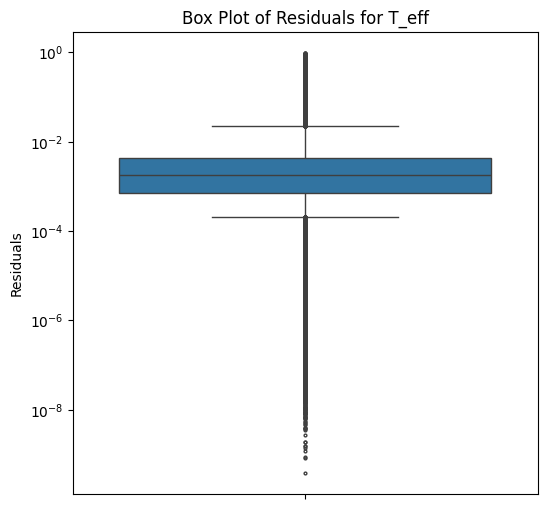

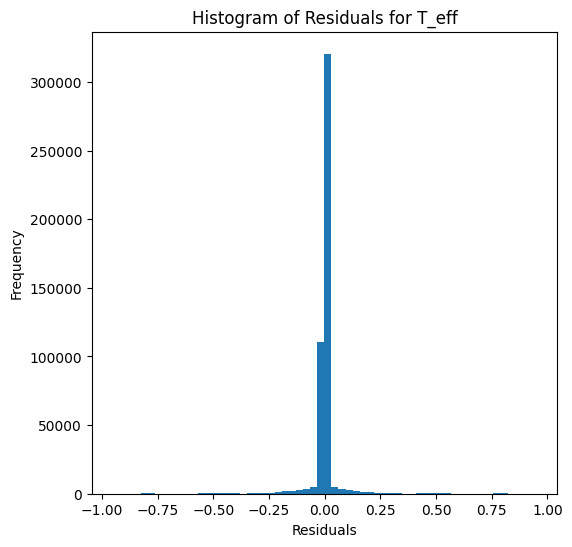

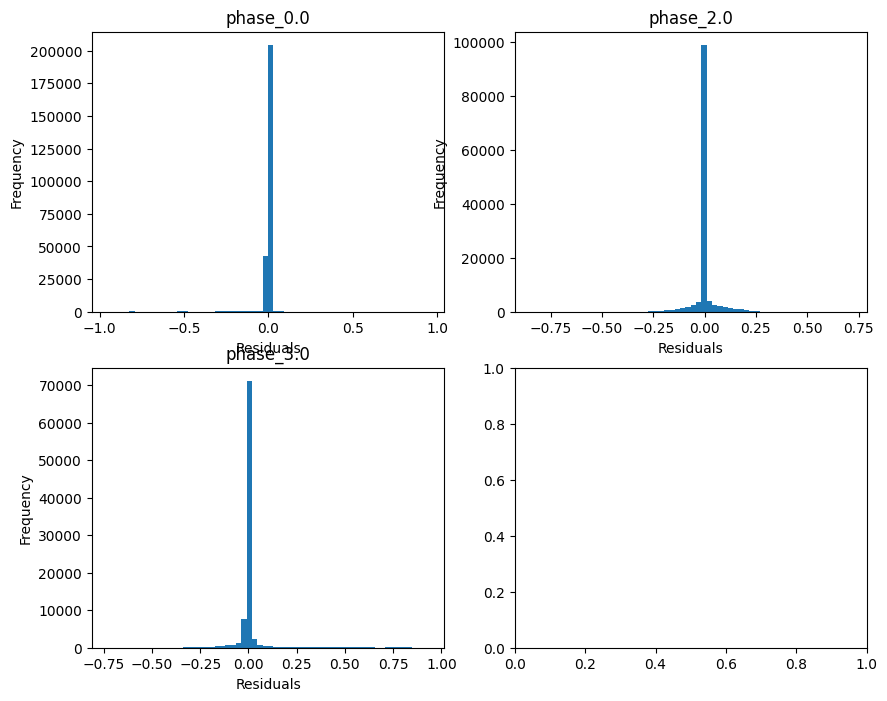

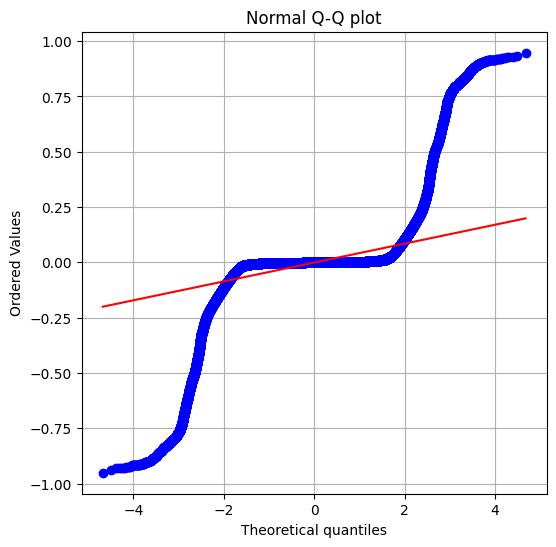

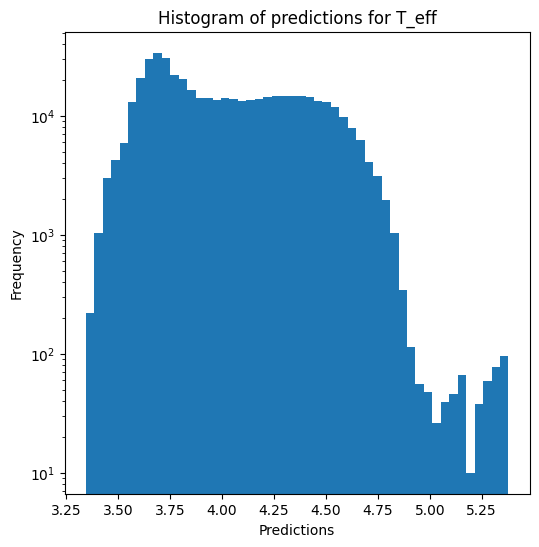

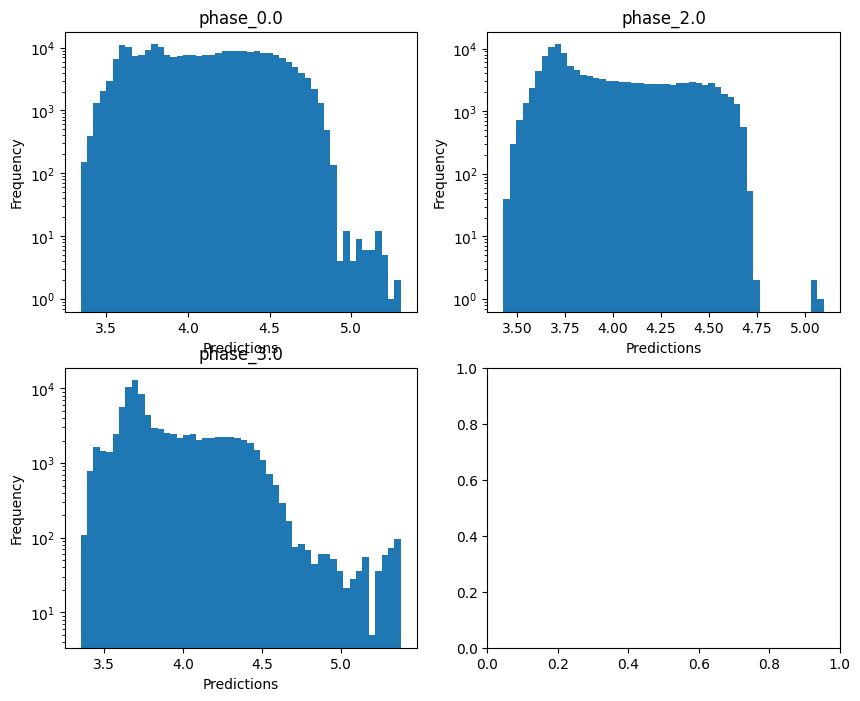


log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  0.45651979642145146
  RMSE :  0.46456776486912243
  MAE :  0.07456465702893232
  MedAE :  0.0041258378771407145
  CORR :  0.8060527588349902
  MAX_ER :  5.667623028034456
  Percentiles : 
    75th percentile :  0.008242639266919483
    90th percentile :  0.017140939062567653
    95th percentile :  0.036709759916705643
    99th percentile :  3.1017060833147903

log_g results for the phase category with a value of 2.0
  value range :  -0.2959230723262505 - 4.408311770676233
  RVE :  0.10829530980978075
  RMSE :  0.859660760736529
  MAE :  0.3517587014870084
  MedAE :  0.0159086325201796
  CORR :  0.5517990029869932
  MAX_ER :  4.585015970670848
  Percentiles : 
    75th percentile :  0.04525760618922292
    90th percentile :  1.5052795840338882
    95th percentile :  2.3347778462238264
    99th percentile :  3.462336083457193

log_g results for the phase category wi

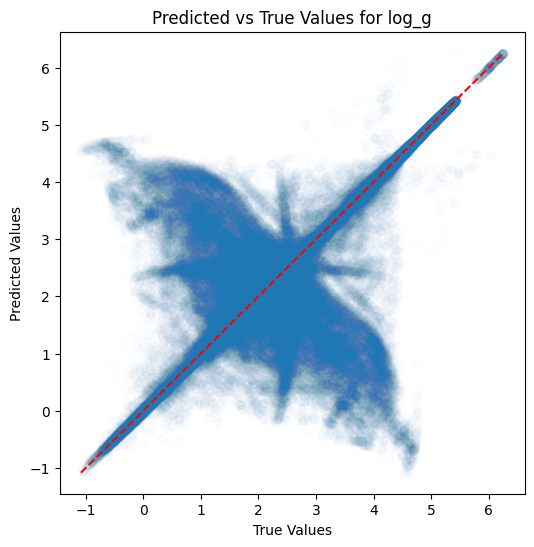

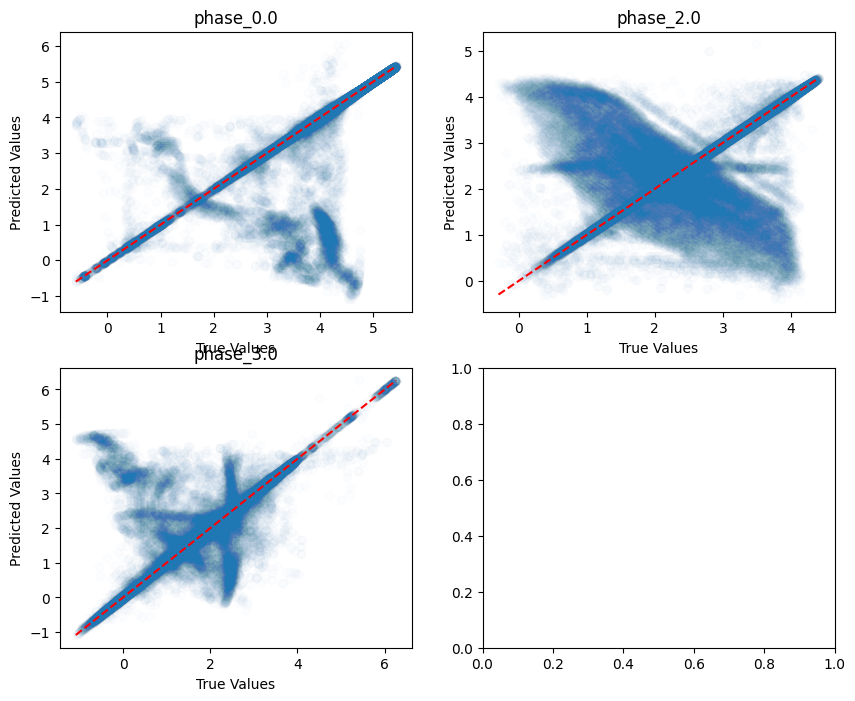

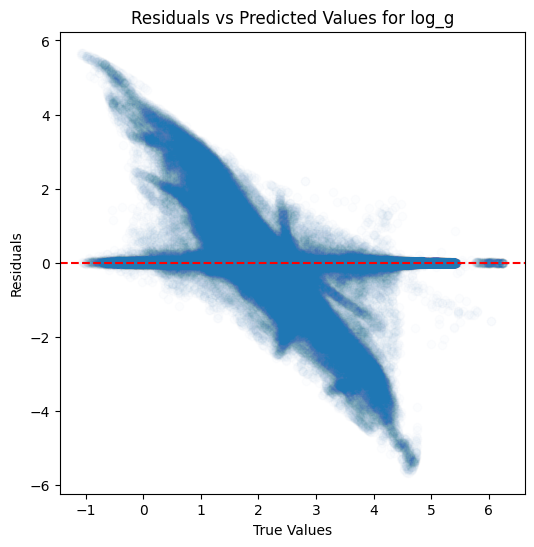

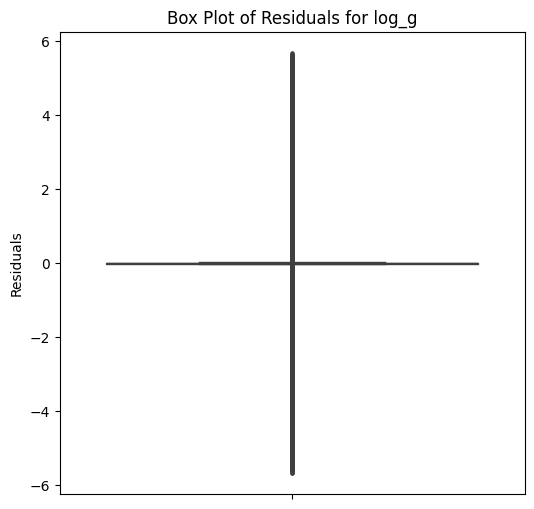

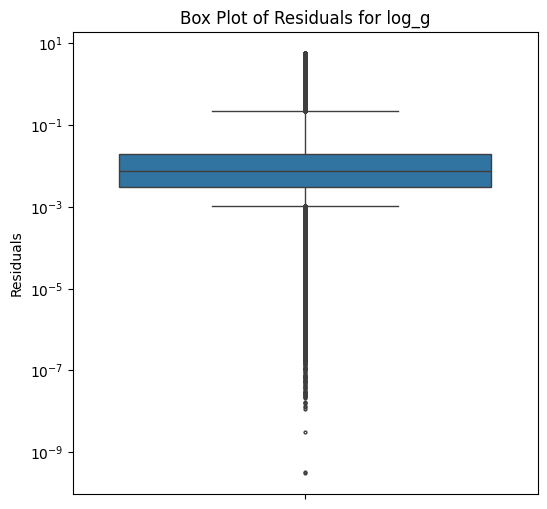

...

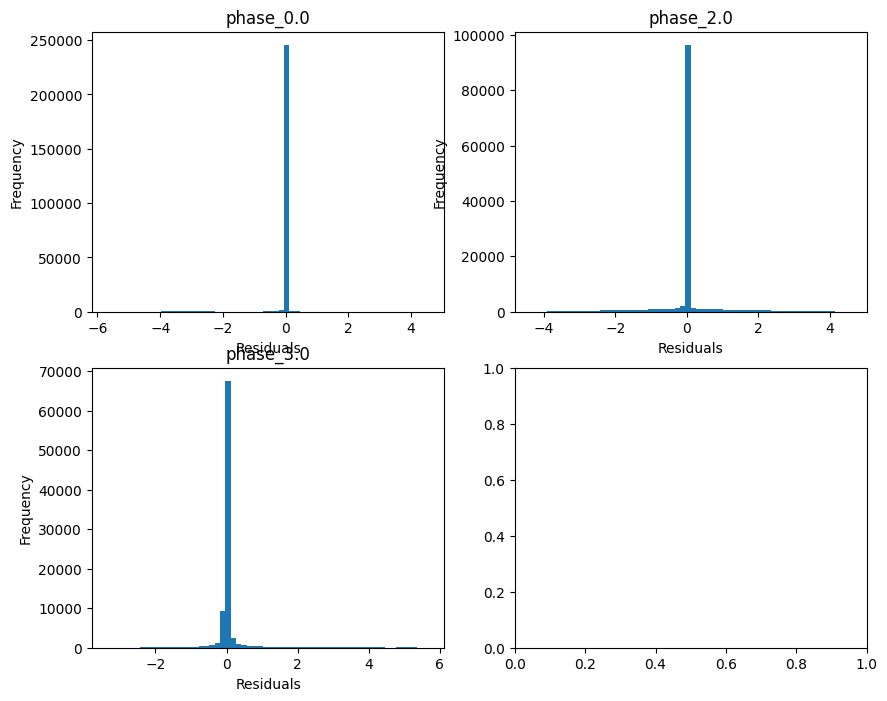

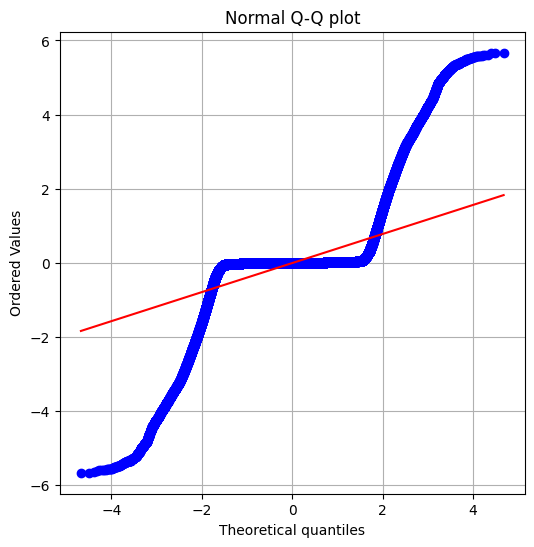

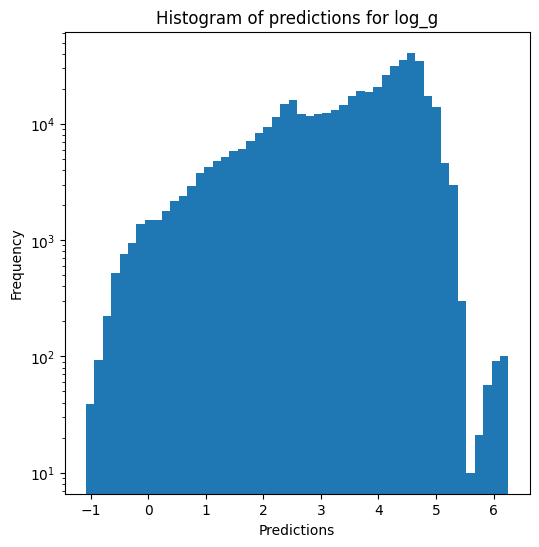

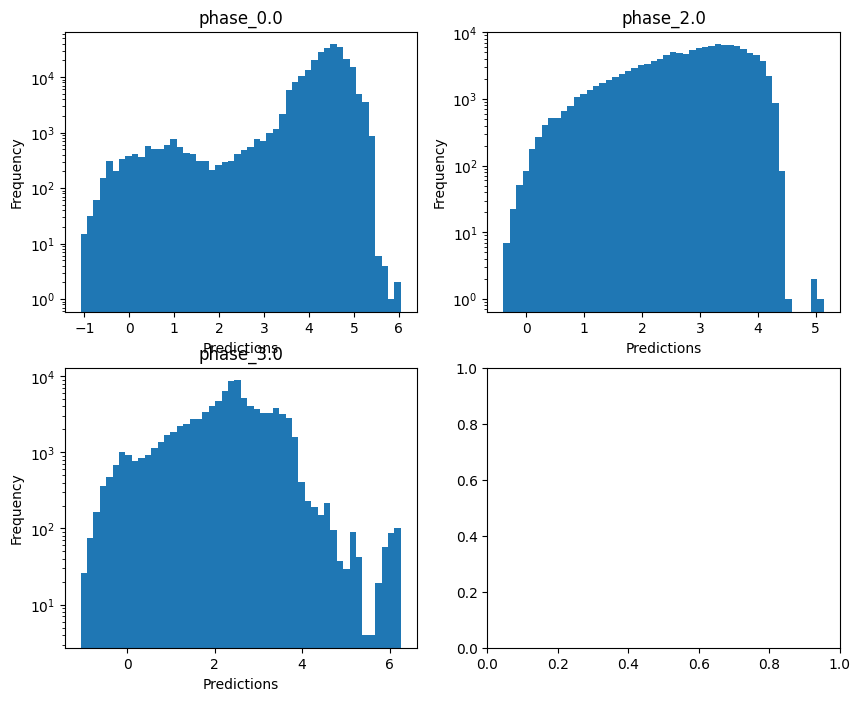

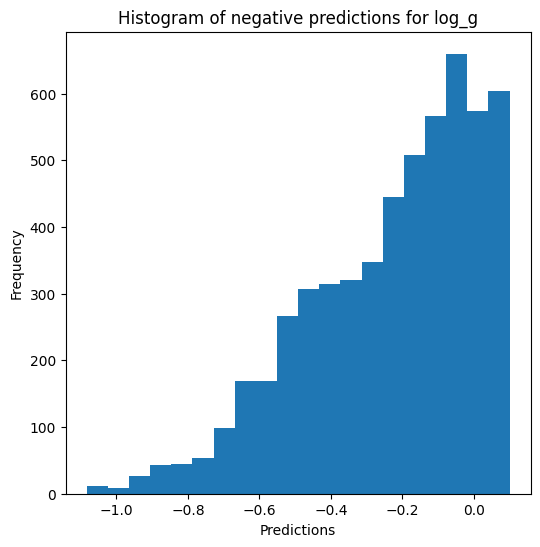


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.8357431647857865
  RMSE :  0.2325552640960457
  MAE :  0.03825366141971845
  MedAE :  0.002858069615281303
  CORR :  0.9264549667525878
  MAX_ER :  2.833800568169004
  Percentiles : 
    75th percentile :  0.0054135904721812
    90th percentile :  0.010995771075630614
    95th percentile :  0.021289513577186493
    99th percentile :  1.5518559023571143

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.891706235288321
  RVE :  0.23299017968828972
  RMSE :  0.4298240044503594
  MAE :  0.17588909882298995
  MedAE :  0.007970687313724856
  CORR :  0.6240439410766132
  MAX_ER :  2.2923746376311427
  Percentiles : 
    75th percentile :  0.02269667915037965
    90th percentile :  0.7526427119035811
    95th percentile :  1.1672435198982487
    99th percentile :  1.7314294442312972

radius results for the phase categor

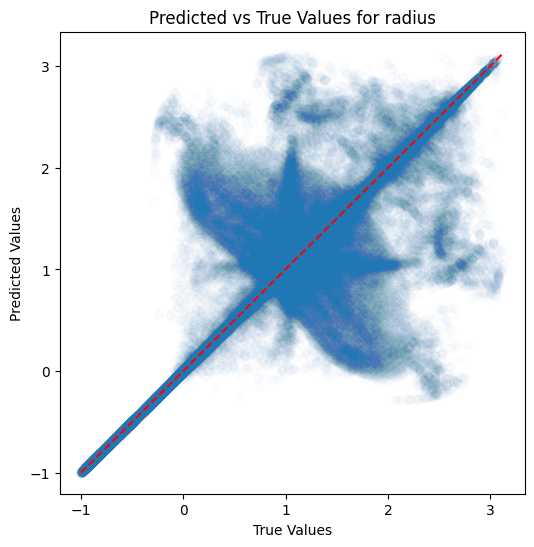

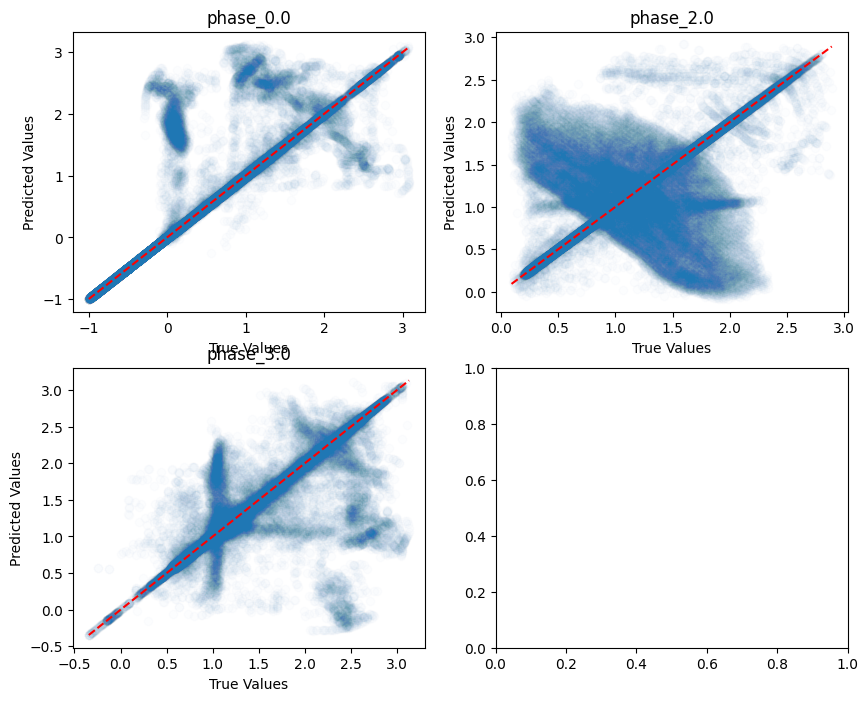

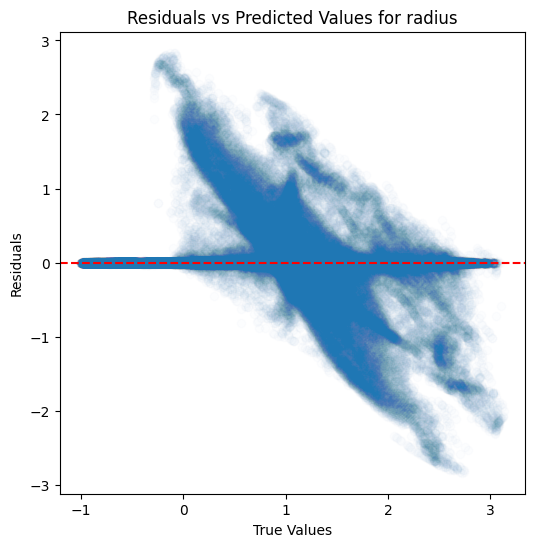

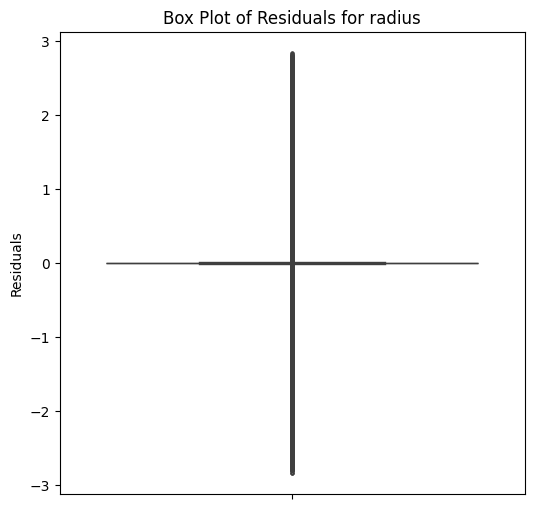

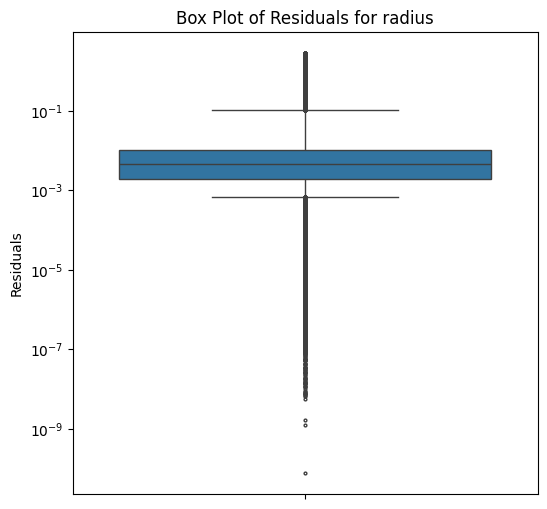

...

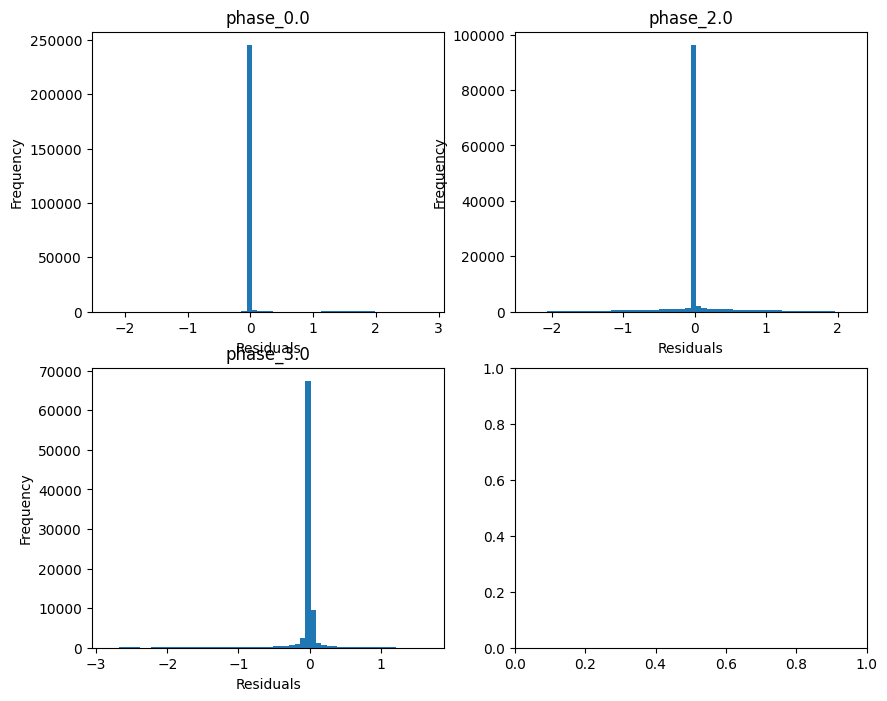

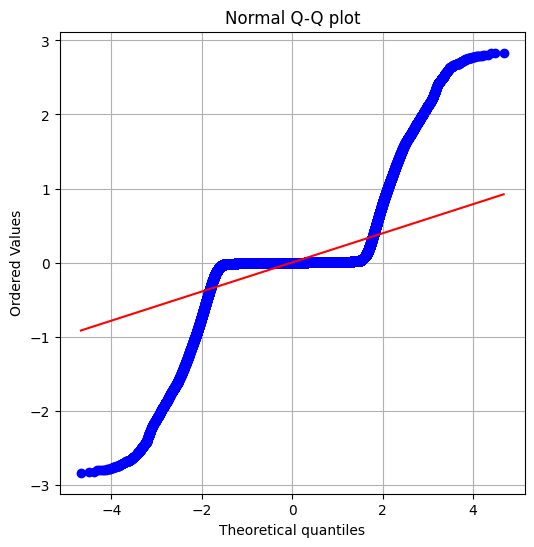

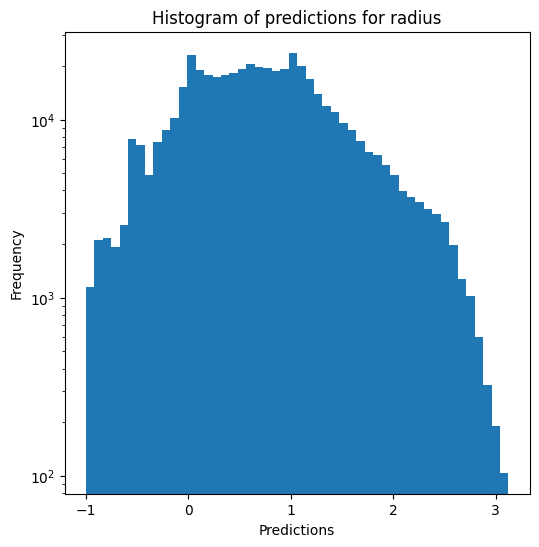

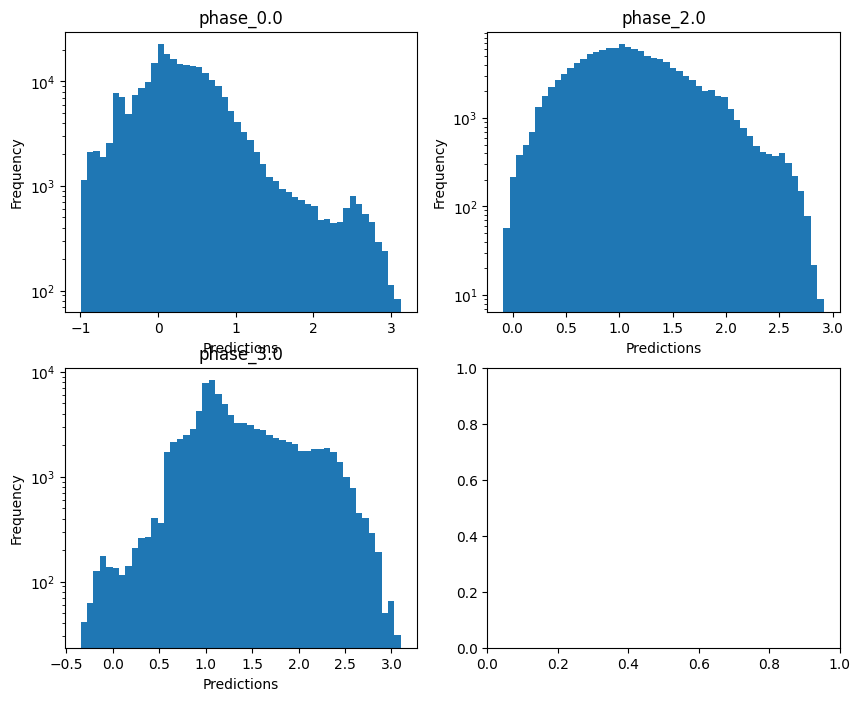

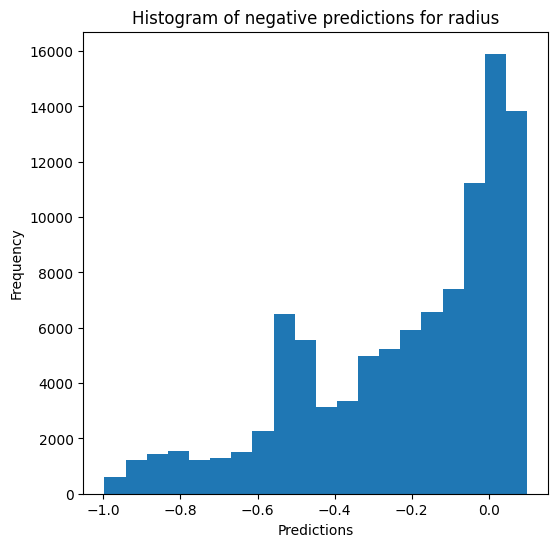

Saving predictions and results...


In [13]:
dt_evaluator.evaluate_Kfold_results(DecisionTreeRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name)

### K-nearest neighbours

In [14]:
knn_evaluator = Model_evaluator("KNN", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_robust train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.9758093827265293
  RMSE :  0.05506559126795672
  MAE :  0.012330369003558349
  MedAE :  0.0012729175215429045
  CORR :  0.9878436525681992
  MAX_ER :  0.9124775040552091
  Percentiles : 
    75th percentile :  0.0030437776461795796
    90th percentile :  0.009057027233181806
    95th percentile :  0.05937111957610039
    99th percentile :  0.2918949358632898

T_eff results for the phase category with a value of 2.0
  value range :  3.42785685311742 - 4.711472733477716
  RVE :  0.9837144113445745
  RMSE :  0.040389150219217844
  MAE :  0.016751035723469823
  MedAE :  0.0021514534246005468
  CORR :  0.9918295166875765
  MAX_ER :  0.7125480731818836
  Percentiles : 
    75th percentile :  0.010701636768100542
    90th percentile :  0.056946054300474

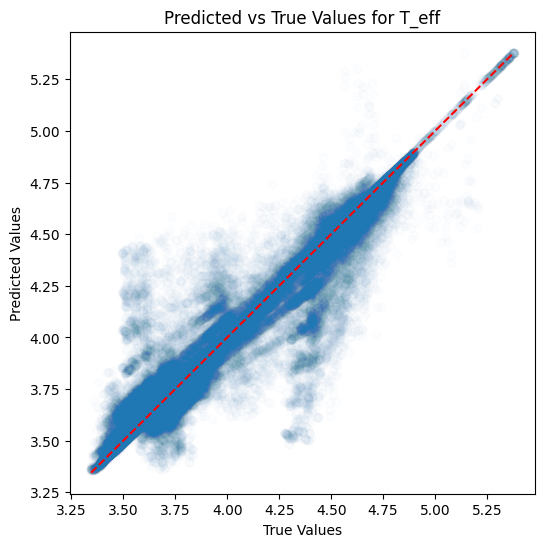

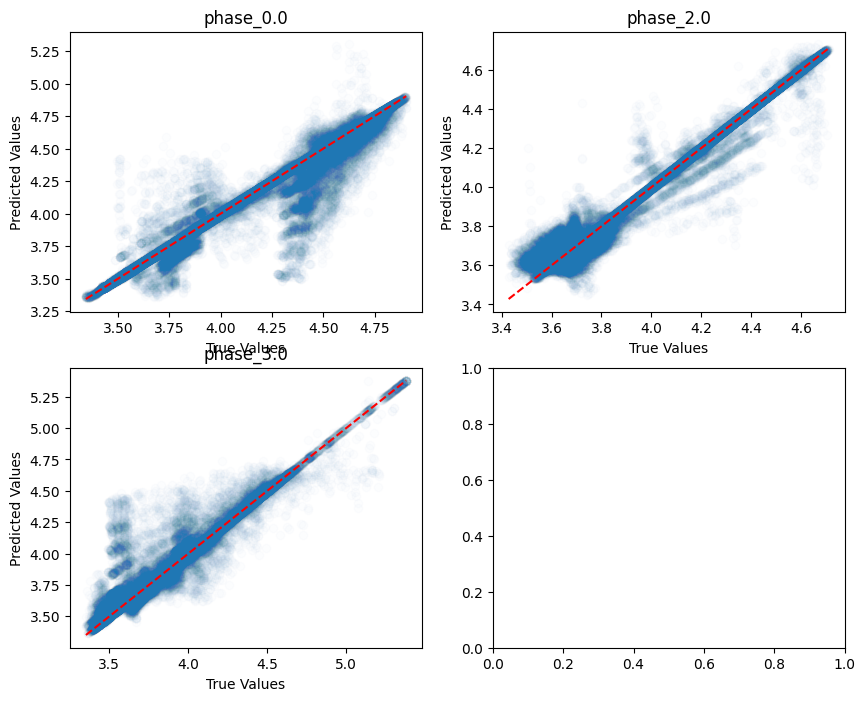

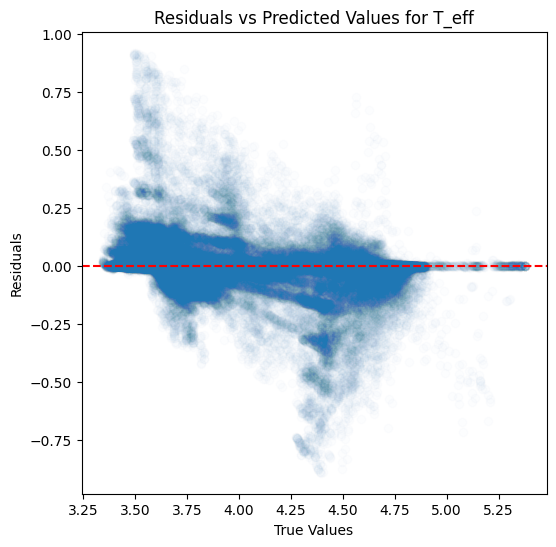

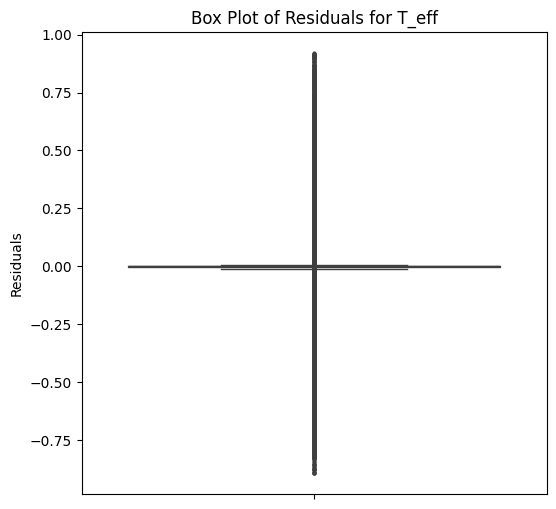

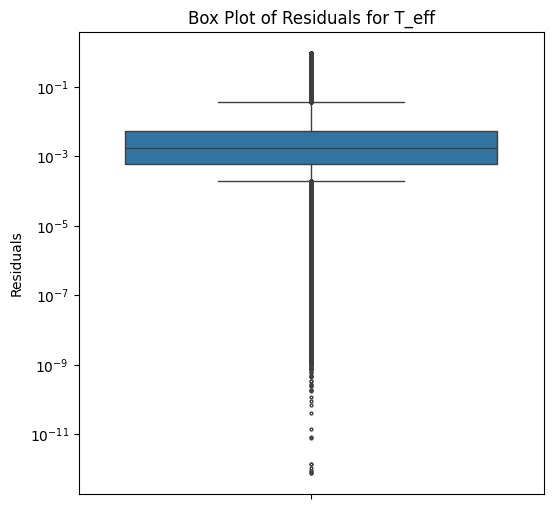

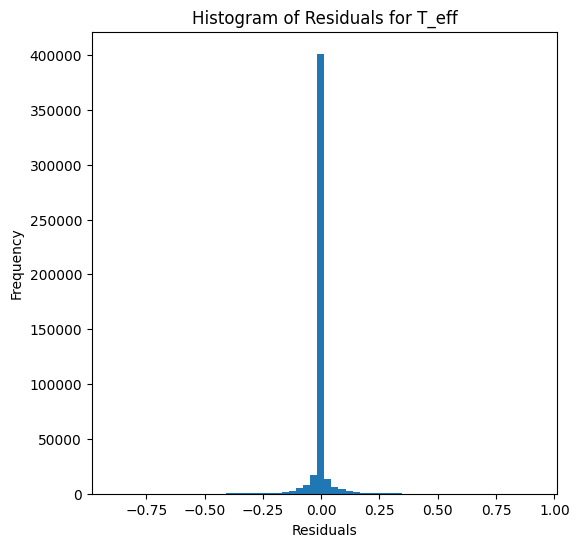

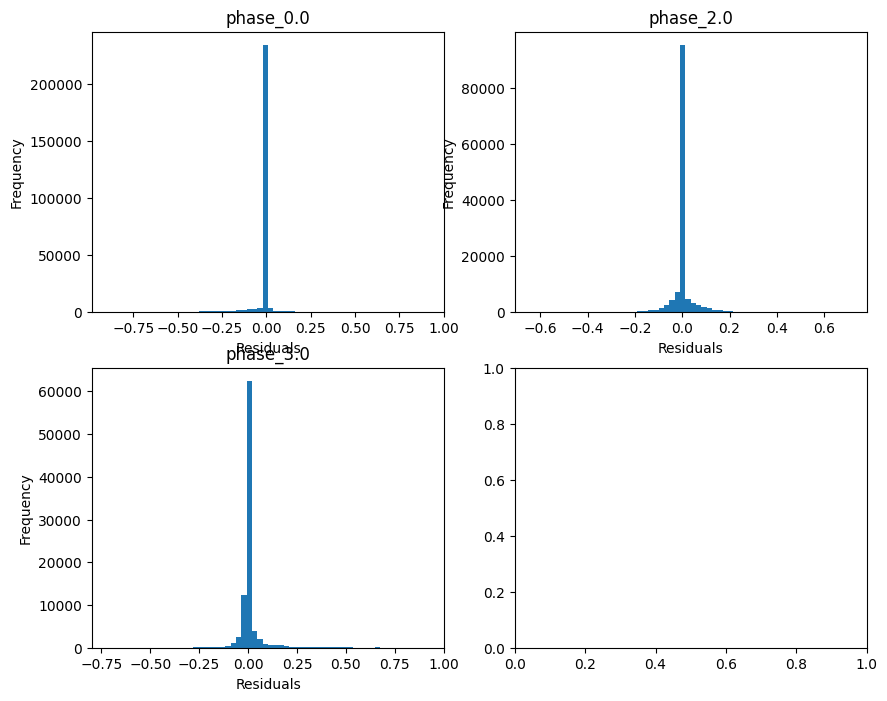

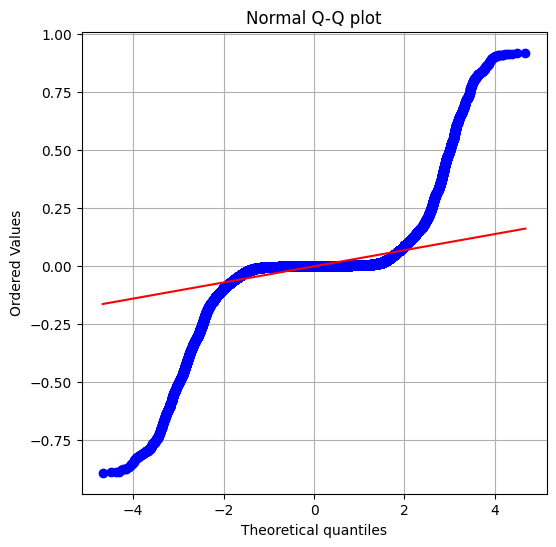

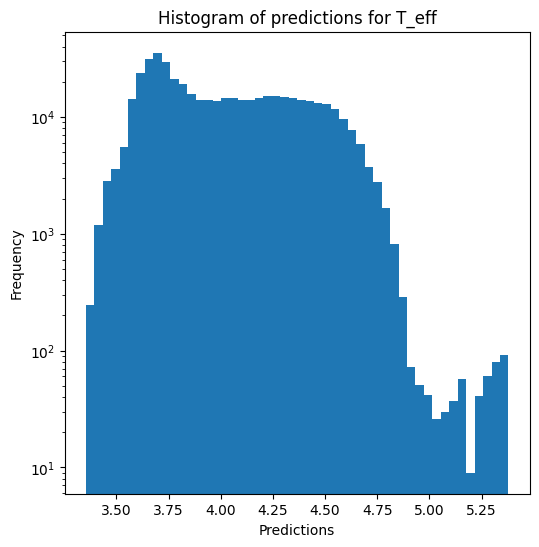

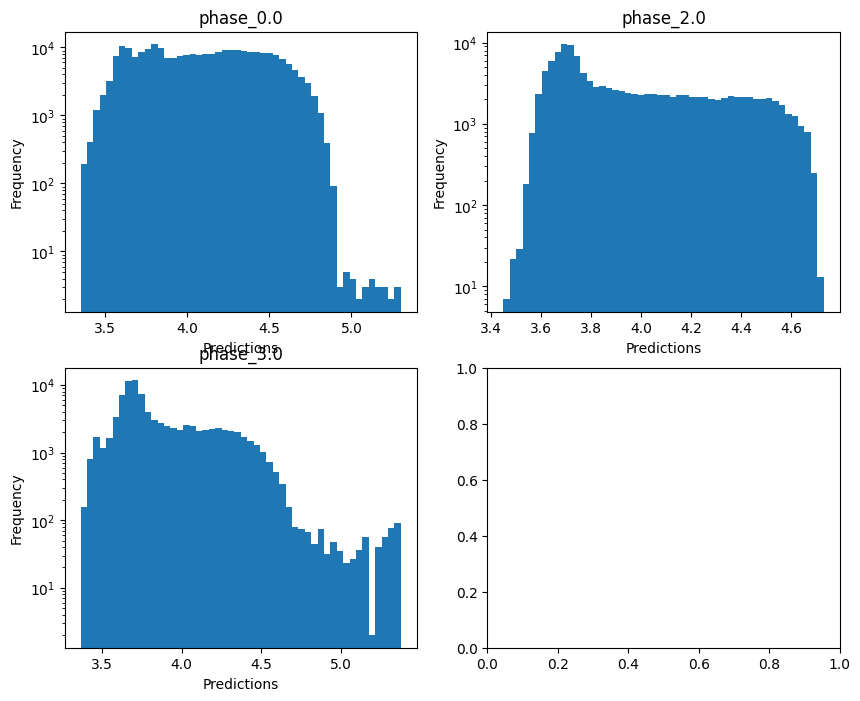


log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  0.6994491226506004
  RMSE :  0.34735136485129026
  MAE :  0.07218742971694482
  MedAE :  0.0029371716530199876
  CORR :  0.8796946959060437
  MAX_ER :  5.572704498947318
  Percentiles : 
    75th percentile :  0.007755191483031609
    90th percentile :  0.03050672151544975
    95th percentile :  0.3146225365105133
    99th percentile :  1.8436108697470817

log_g results for the phase category with a value of 2.0
  value range :  -0.2959230723262505 - 4.408311770676233
  RVE :  0.5944509281907415
  RMSE :  0.5799895446949292
  MAE :  0.24817098803945853
  MedAE :  0.010323765506317972
  CORR :  0.7751750302973626
  MAX_ER :  4.587359712892218
  Percentiles : 
    75th percentile :  0.14907922285724595
    90th percentile :  0.9776789058761911
    95th percentile :  1.473807601771529
    99th percentile :  2.321973132031741

log_g results for the phase category with

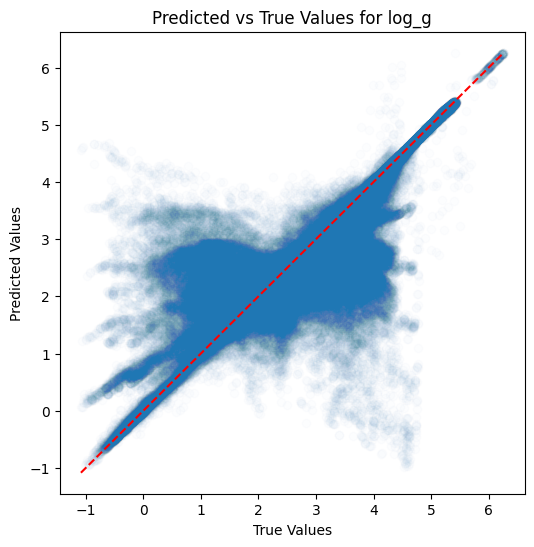

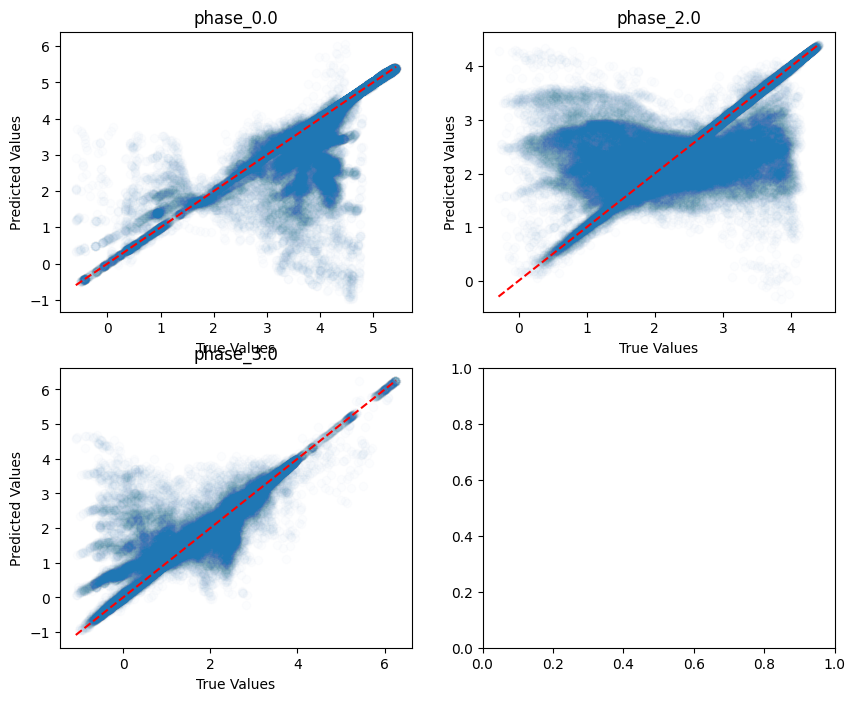

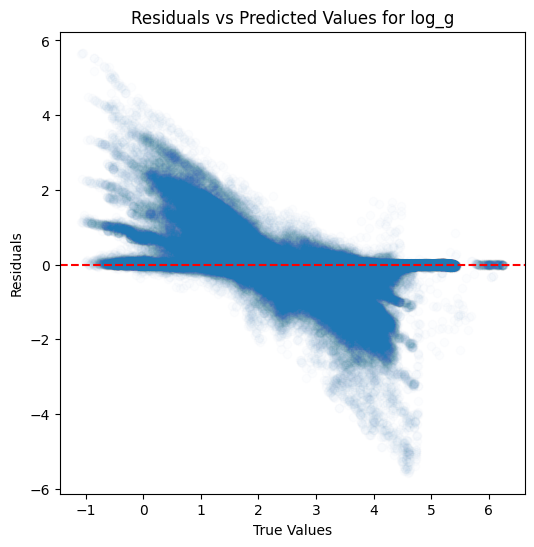

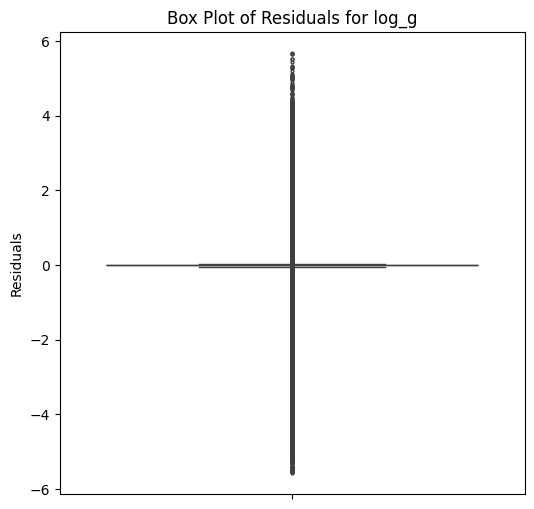

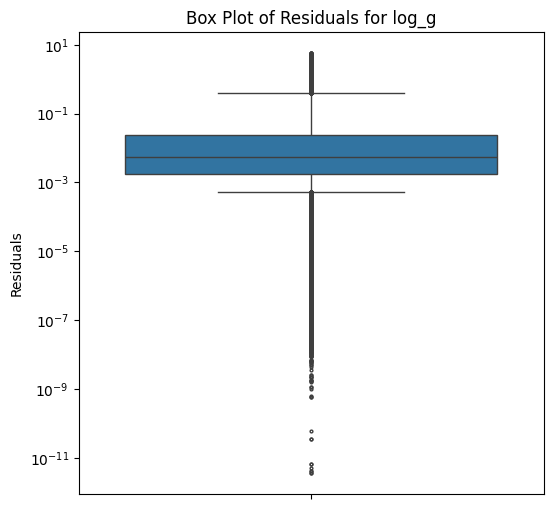

...

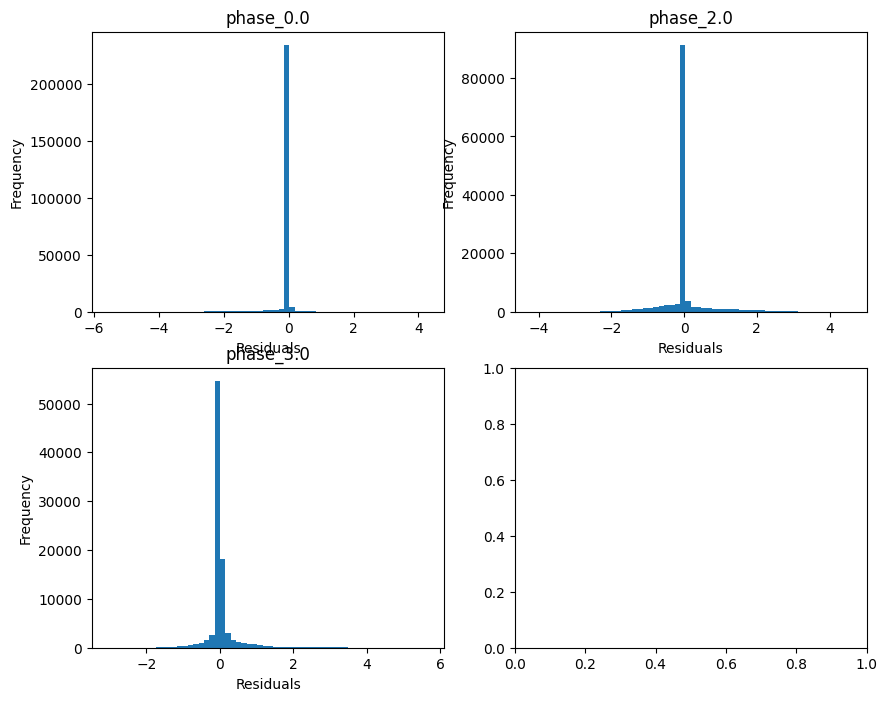

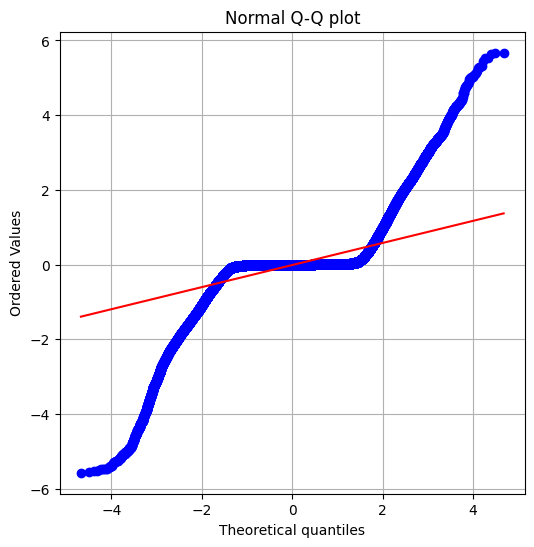

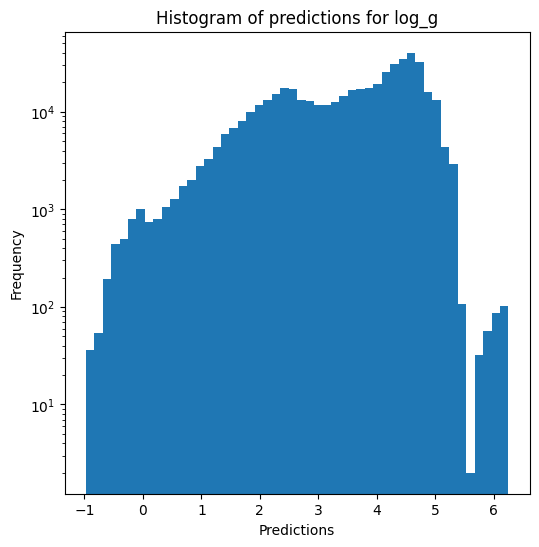

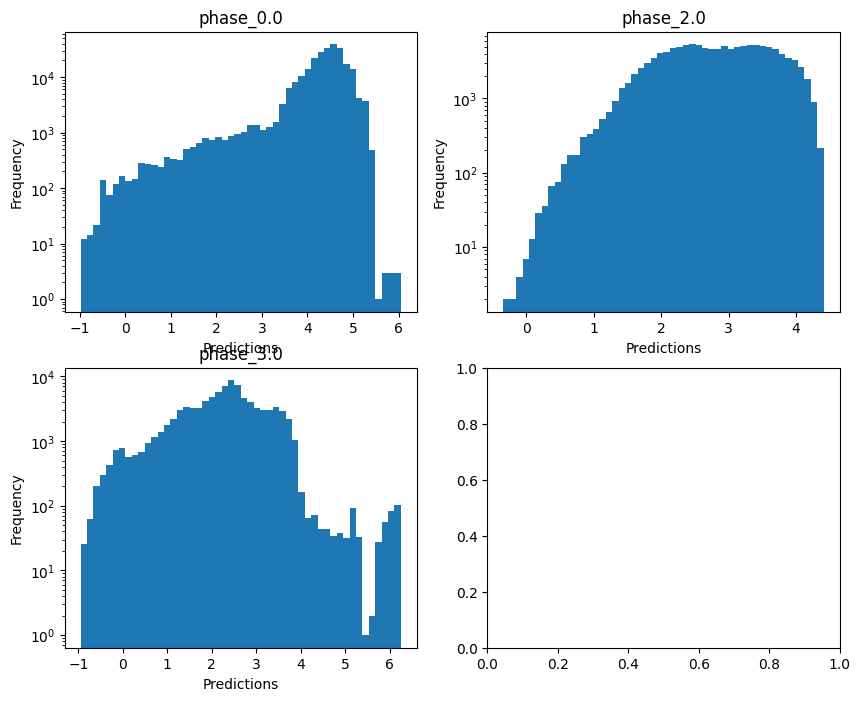

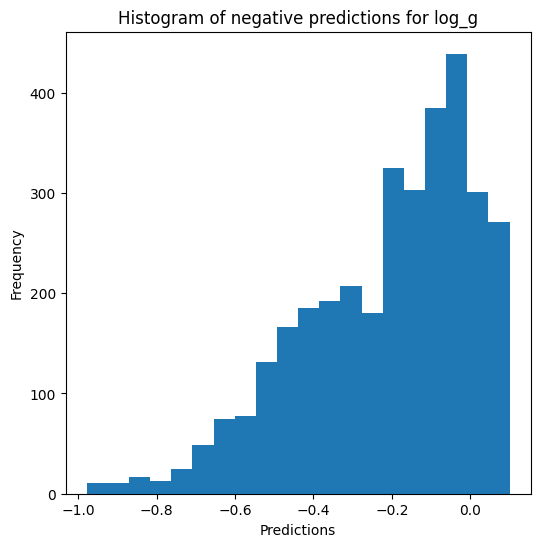


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.9090903105399593
  RMSE :  0.1739464270010627
  MAE :  0.03738038530469753
  MedAE :  0.002427789837526534
  CORR :  0.9583895305216908
  MAX_ER :  2.788066779003325
  Percentiles : 
    75th percentile :  0.005731487764790592
    90th percentile :  0.021417962005317284
    95th percentile :  0.15811929495409285
    99th percentile :  0.9241636973947664

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.891706235288321
  RVE :  0.6511652612679291
  RMSE :  0.2899891969361439
  MAE :  0.12408972981825062
  MedAE :  0.00517059542672893
  CORR :  0.8119990339473955
  MAX_ER :  2.2937092246449966
  Percentiles : 
    75th percentile :  0.07449481855806256
    90th percentile :  0.48884028438148625
    95th percentile :  0.7369863580009998
    99th percentile :  1.1611632187265513

radius results for the phase categor

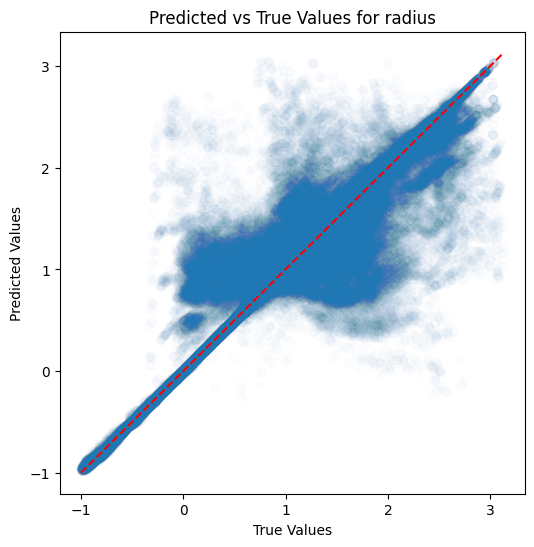

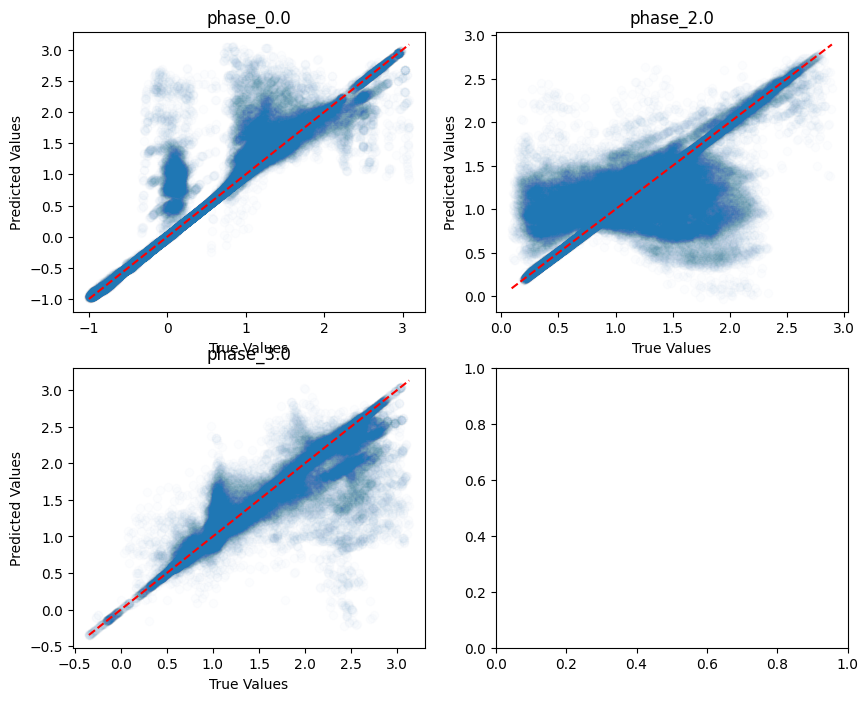

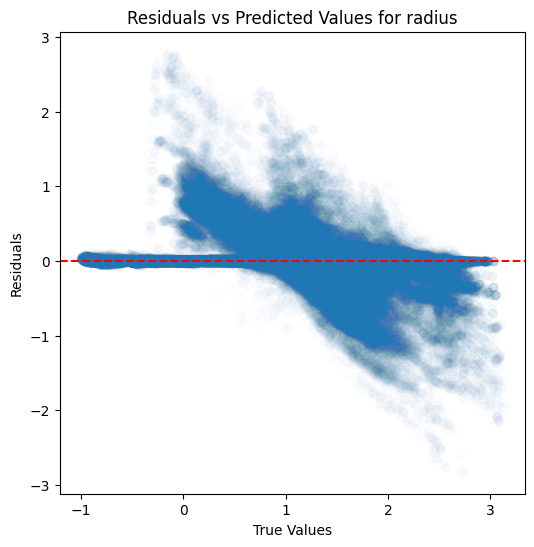

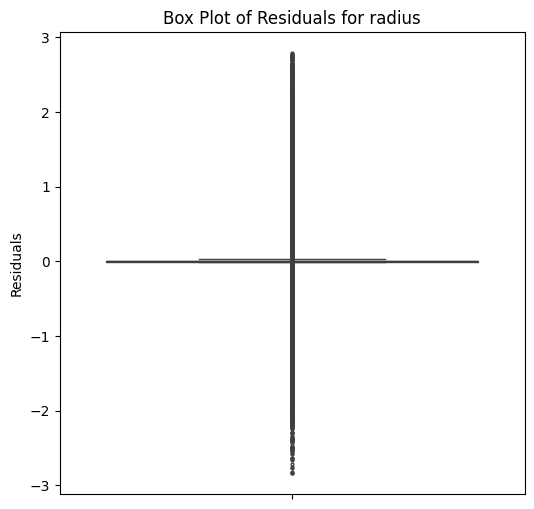

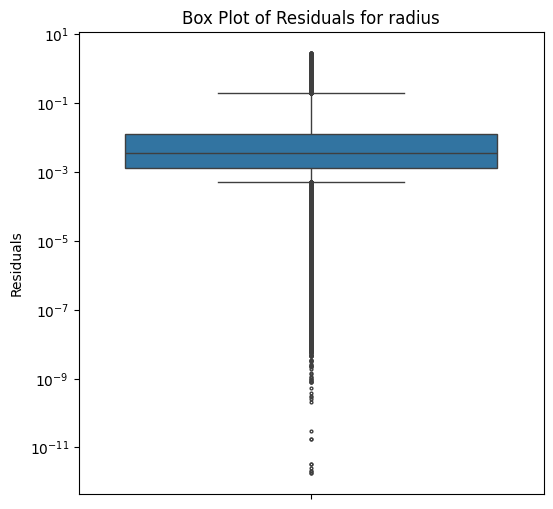

...

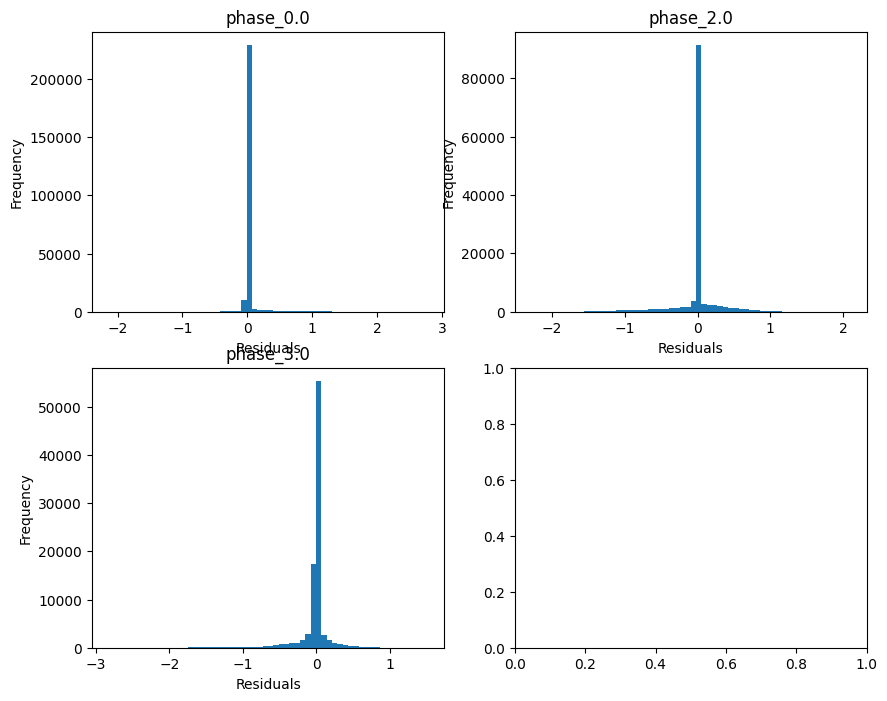

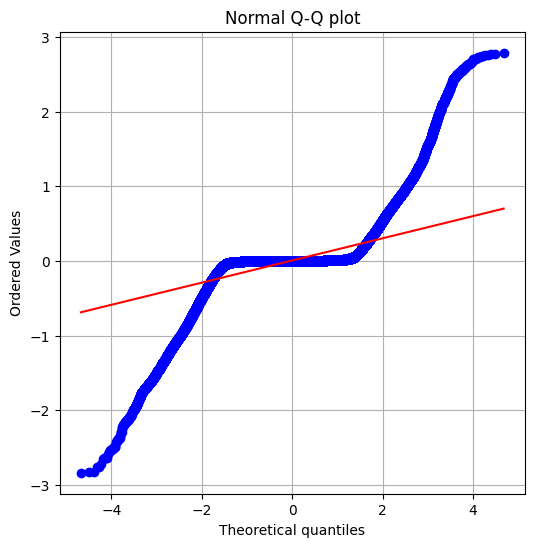

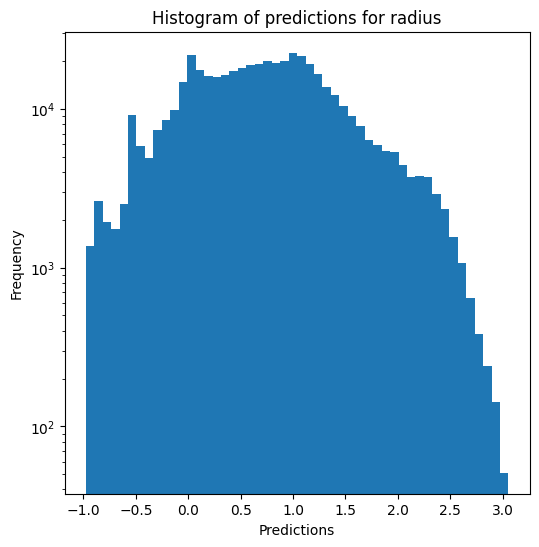

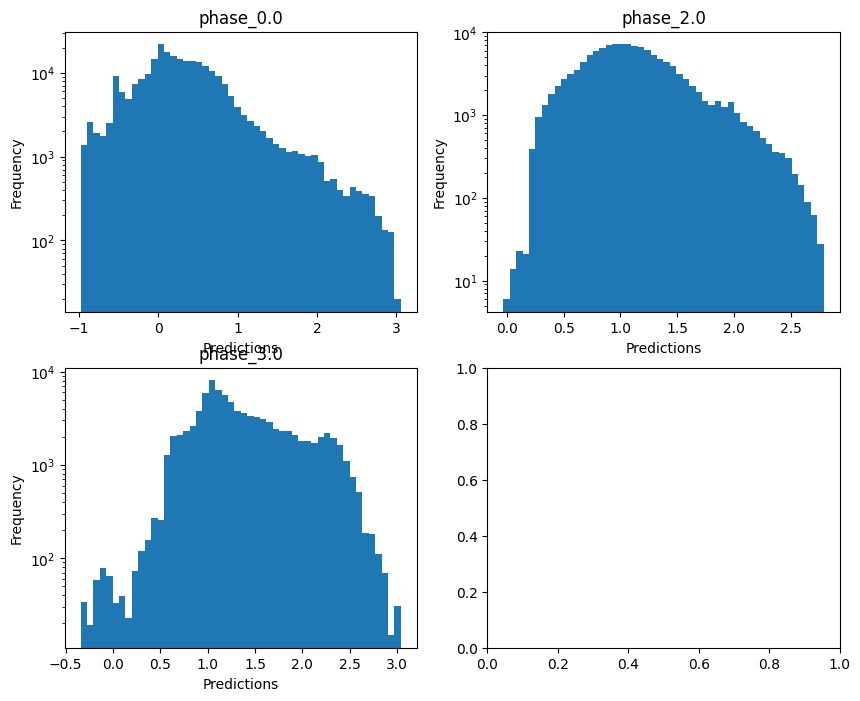

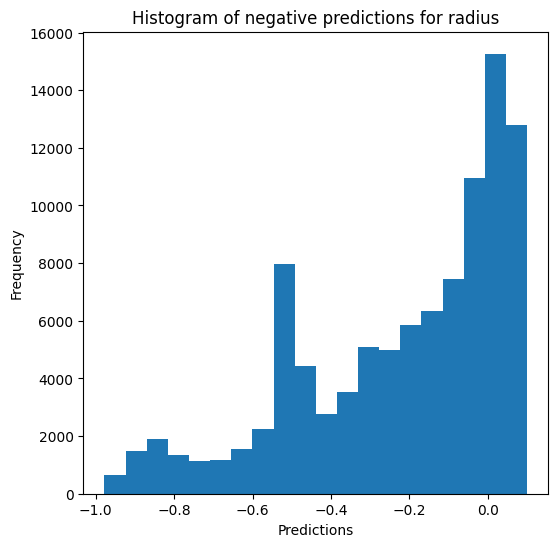

Saving predictions and results...


In [15]:
knn_evaluator.evaluate_Kfold_results(KNeighborsRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name)

### Random forests

In [16]:
rf_evaluator = Model_evaluator("random_forest", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_robust train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.9741910192801136
  RMSE :  0.05672910100791003
  MAE :  0.010245770502093752
  MedAE :  0.0005766171381520468
  CORR :  0.9871313567754358
  MAX_ER :  0.8968451390947951
  Percentiles : 
    75th percentile :  0.001485983956791559
    90th percentile :  0.005026090720443978
    95th percentile :  0.022590554203403574
    99th percentile :  0.3081074947132433

T_eff results for the phase category with a value of 2.0
  value range :  3.42785685311742 - 4.711472733477716
  RVE :  0.9747708835322587
  RMSE :  0.050269476436530715
  MAE :  0.01991990070600046
  MedAE :  0.0021008190883997635
  CORR :  0.9873089061746222
  MAX_ER :  0.745035920091881
  Percentiles : 
    75th percentile :  0.0112220320685128
    90th percentile :  0.06894564141185208
 

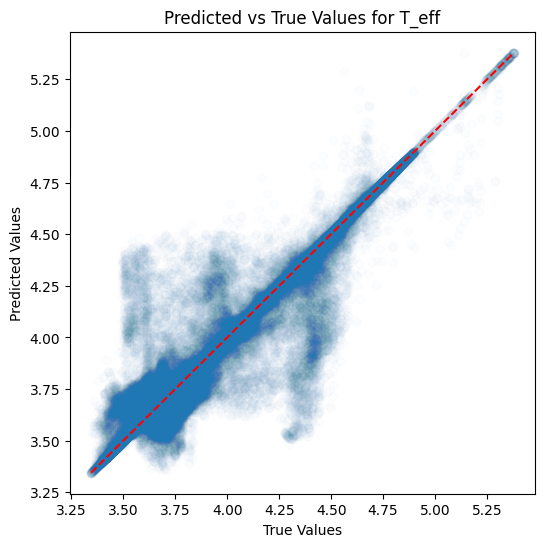

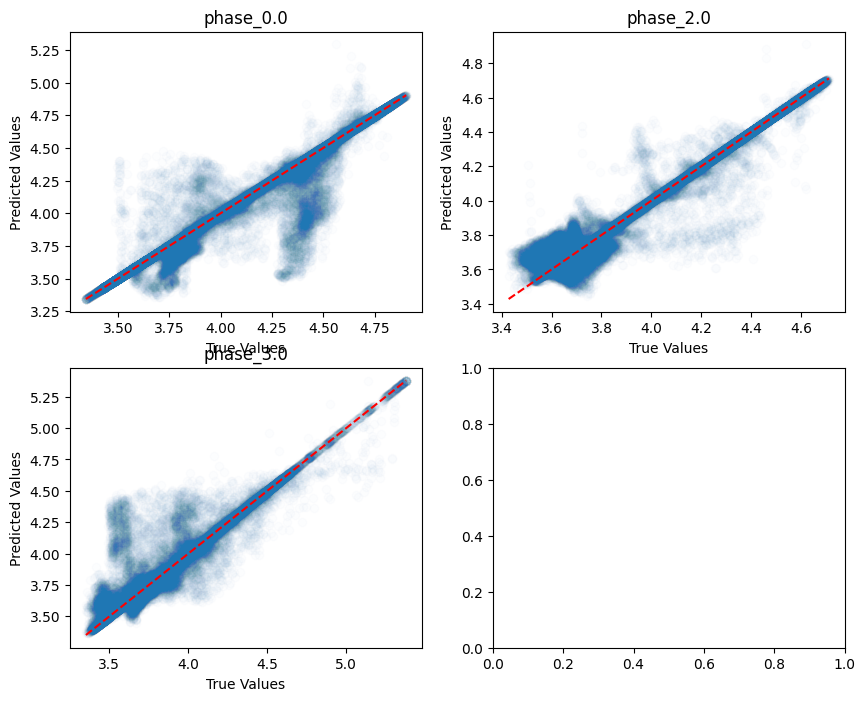

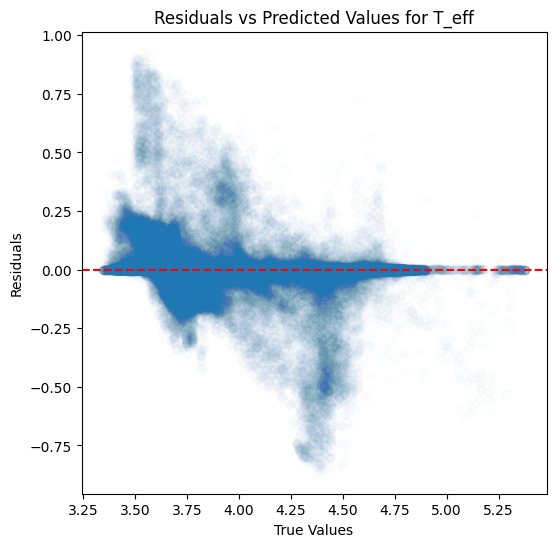

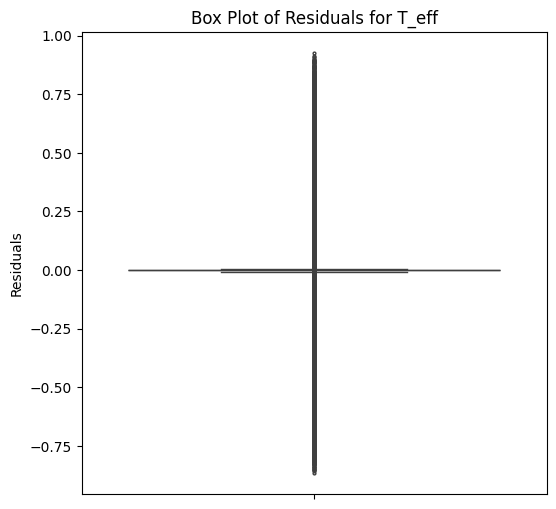

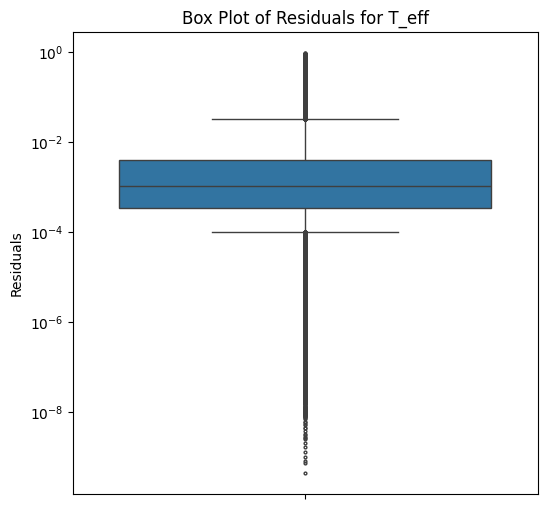

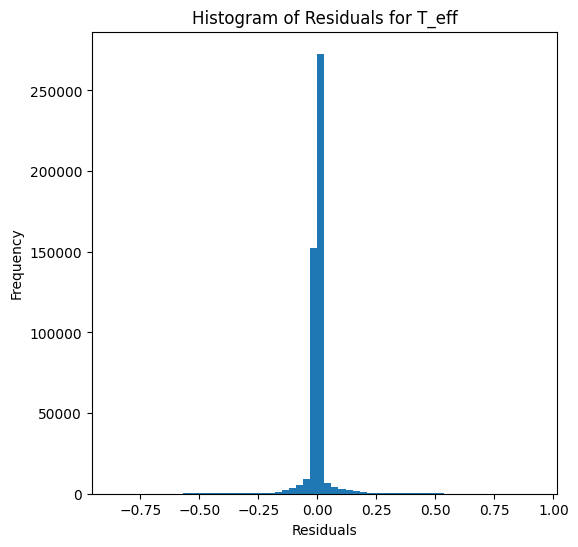

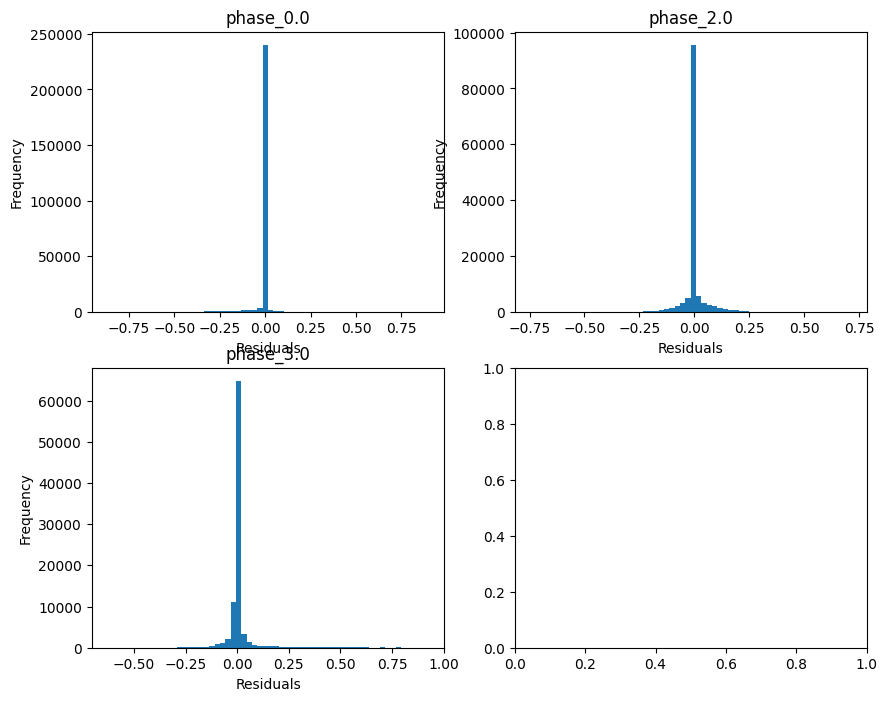

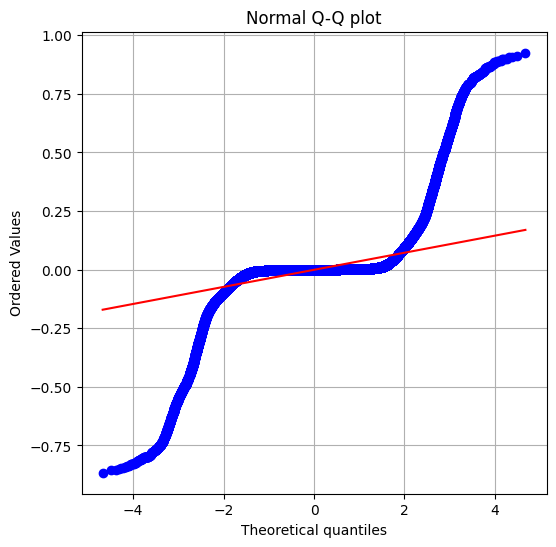

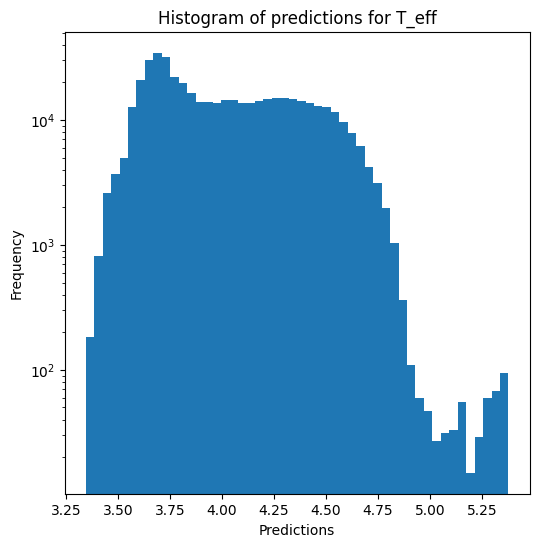

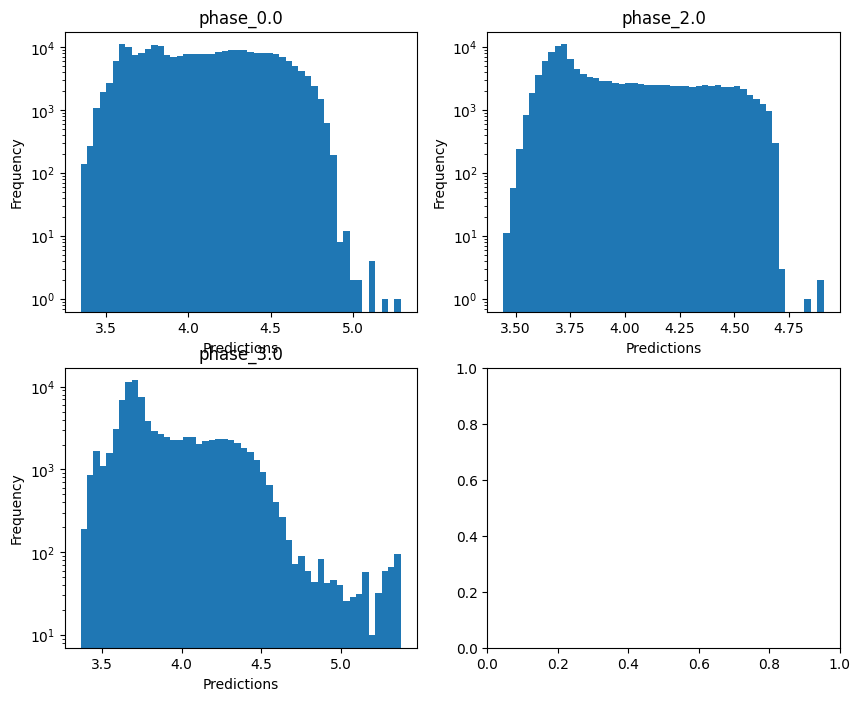


log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  0.6553960865834342
  RMSE :  0.3710704098378018
  MAE :  0.06823483934323404
  MedAE :  0.0017580333695117467
  CORR :  0.8637320950847849
  MAX_ER :  5.581984159368141
  Percentiles : 
    75th percentile :  0.005257530556852297
    90th percentile :  0.019324623679611352
    95th percentile :  0.14172368162470264
    99th percentile :  2.189828115337793

log_g results for the phase category with a value of 2.0
  value range :  -0.2959230723262505 - 4.408311770676233
  RVE :  0.38727717423648633
  RMSE :  0.7128387577944456
  MAE :  0.3014535871546346
  MedAE :  0.010260141618481988
  CORR :  0.6637357344271062
  MAX_ER :  4.556963915407047
  Percentiles : 
    75th percentile :  0.13890215577669285
    90th percentile :  1.232686129214048
    95th percentile :  1.863057340000006
    99th percentile :  2.865942187433351

log_g results for the phase category with 

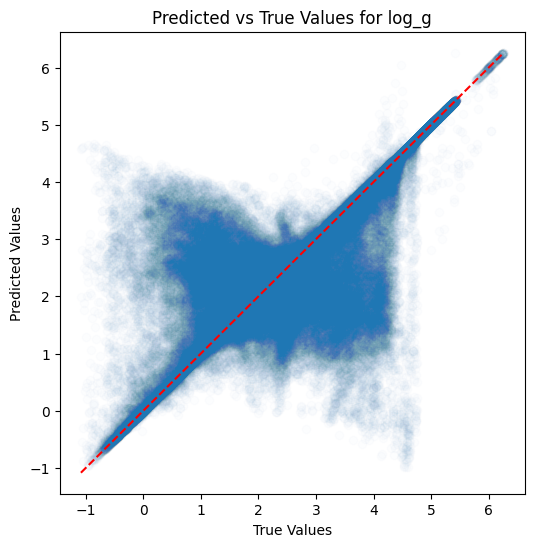

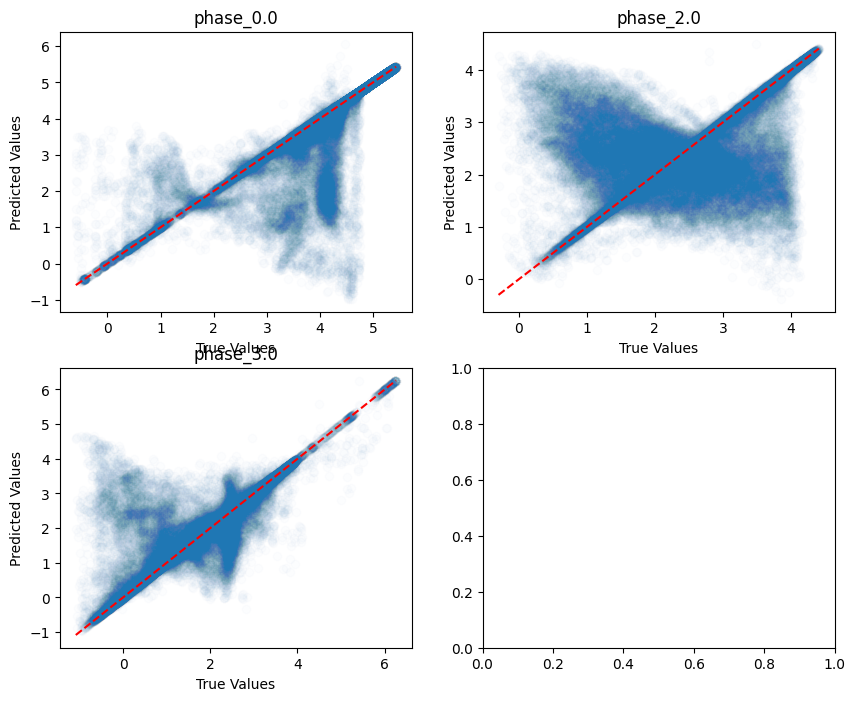

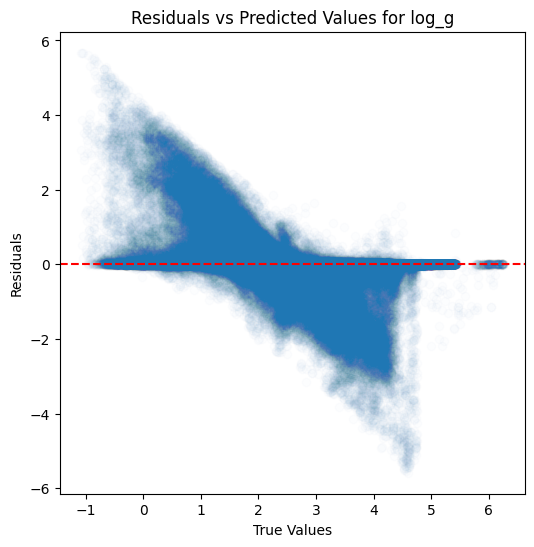

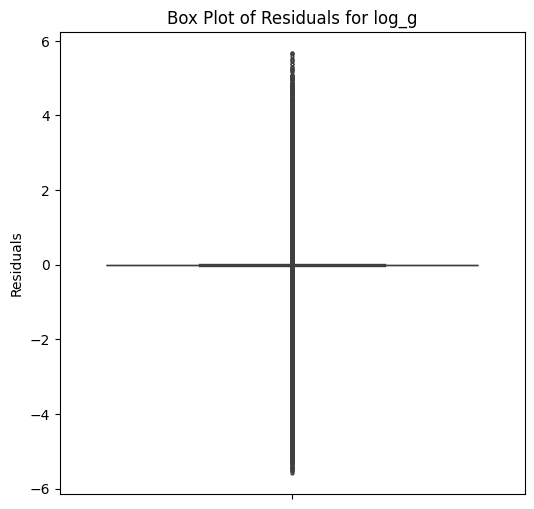

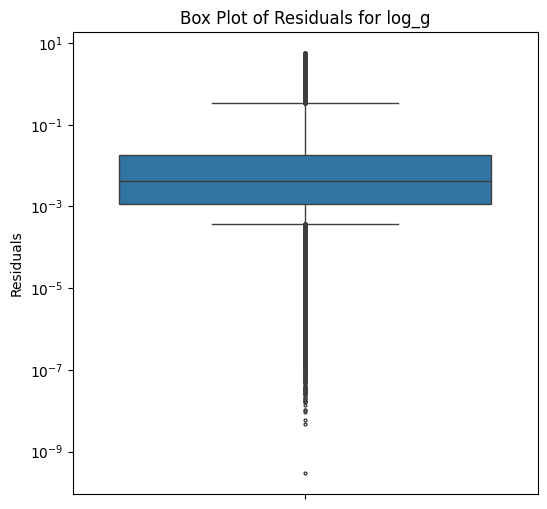

...

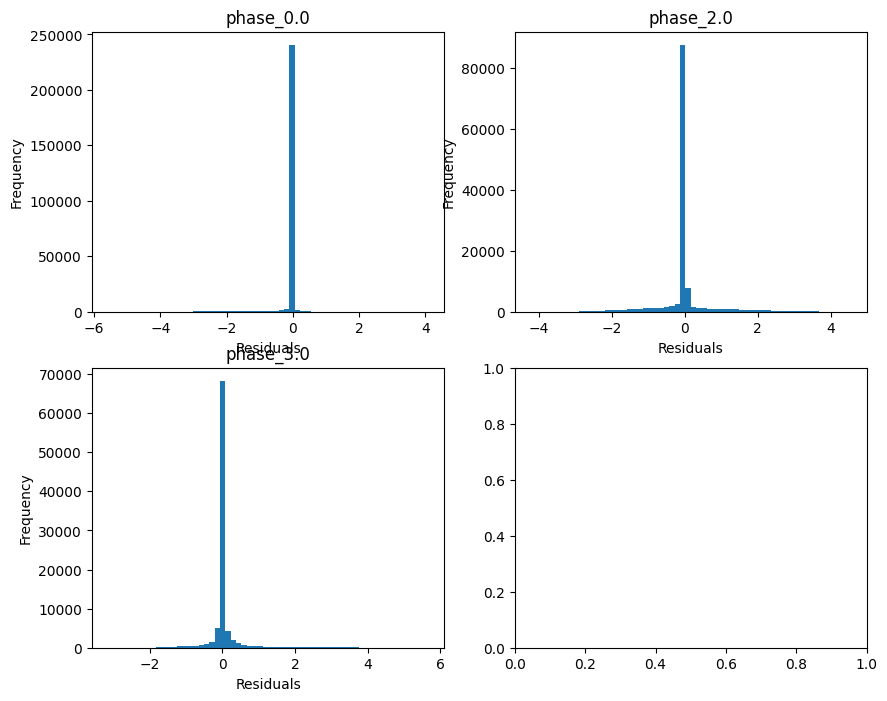

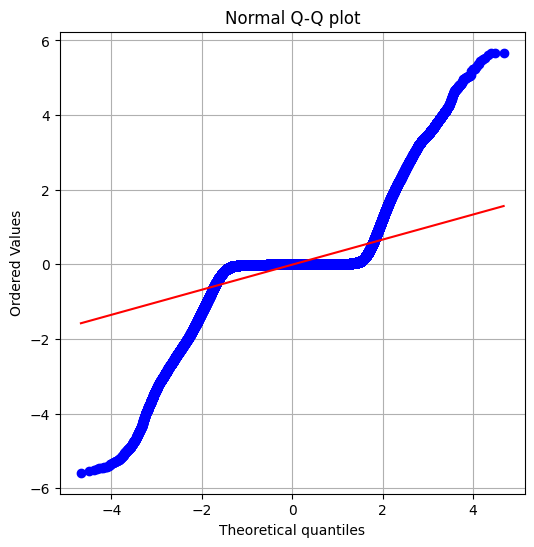

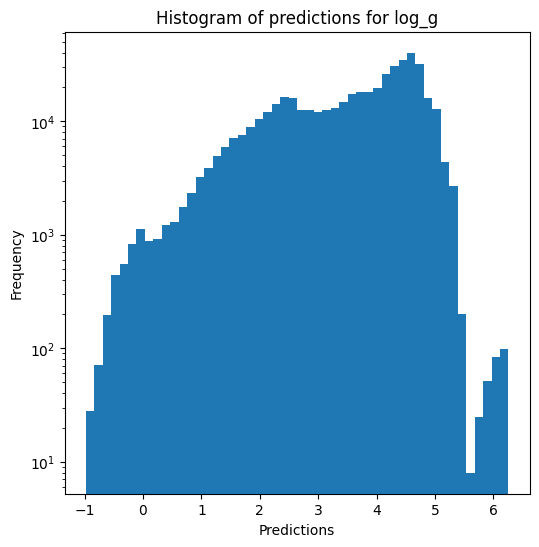

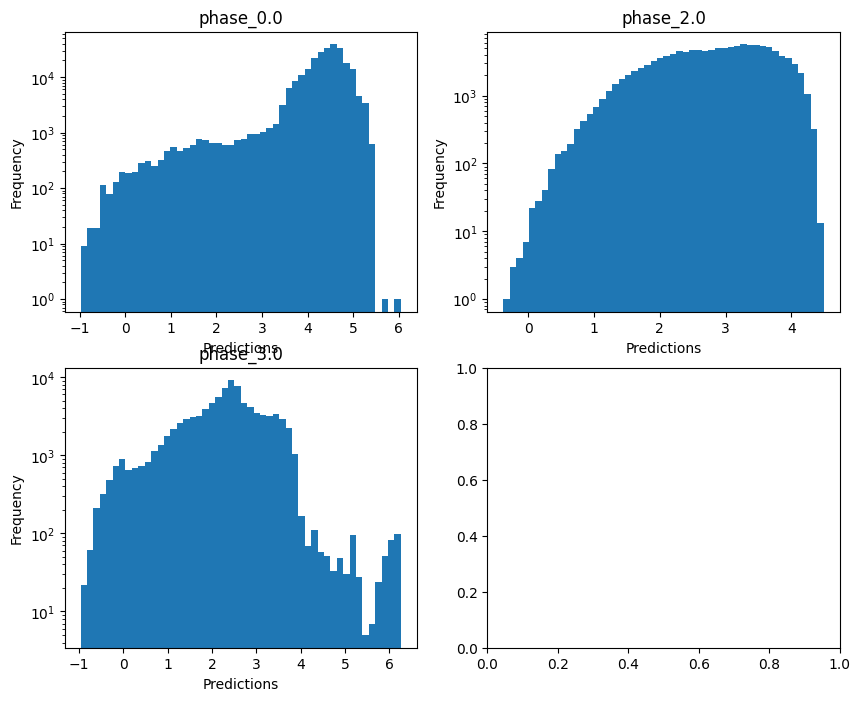

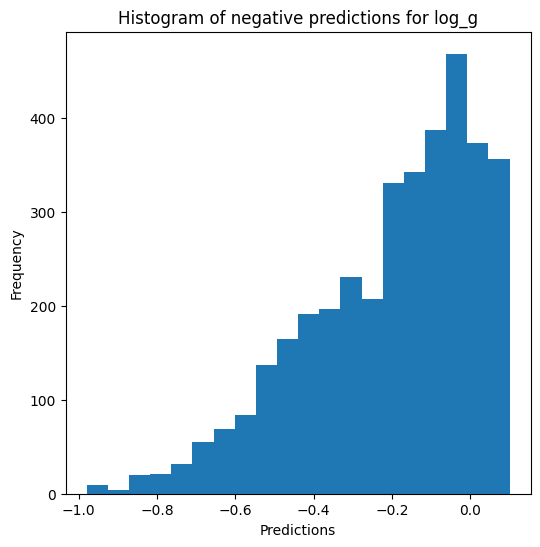


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.8958674569669184
  RMSE :  0.185737635314265
  MAE :  0.03447725871971226
  MedAE :  0.0011485543159998612
  CORR :  0.9515257535051763
  MAX_ER :  2.79278293030454
  Percentiles : 
    75th percentile :  0.003178927794391606
    90th percentile :  0.010673609703073196
    95th percentile :  0.07140896488342975
    99th percentile :  1.095937872650539

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.891706235288321
  RVE :  0.47296548417447126
  RMSE :  0.3564121489870366
  MAE :  0.15072933244332168
  MedAE :  0.005136722081719336
  CORR :  0.7210980009187019
  MAX_ER :  2.2785321183072482
  Percentiles : 
    75th percentile :  0.06949437671897774
    90th percentile :  0.6163309489014374
    95th percentile :  0.9315002909424583
    99th percentile :  1.432934067945202

radius results for the phase category 

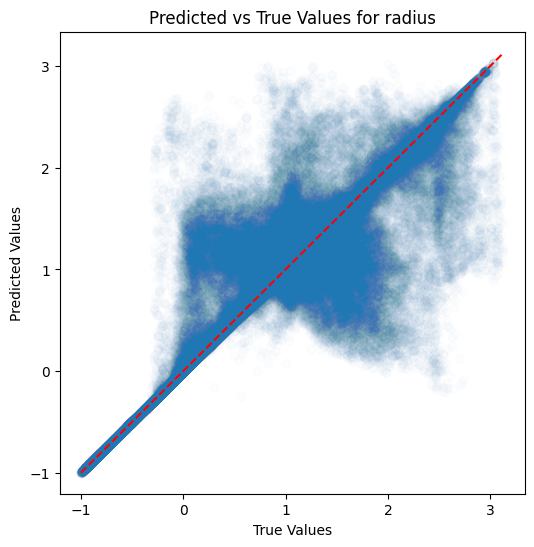

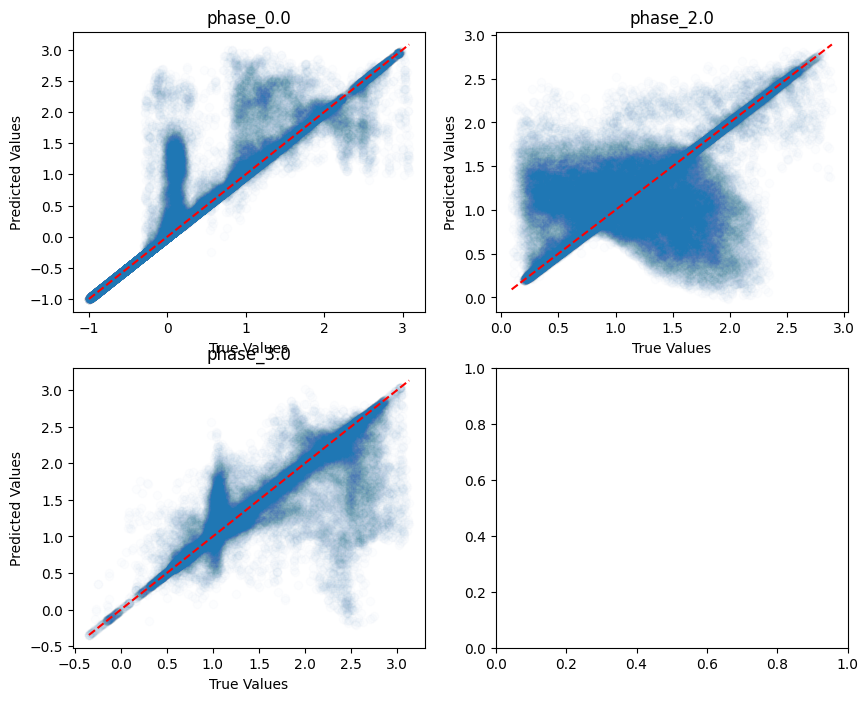

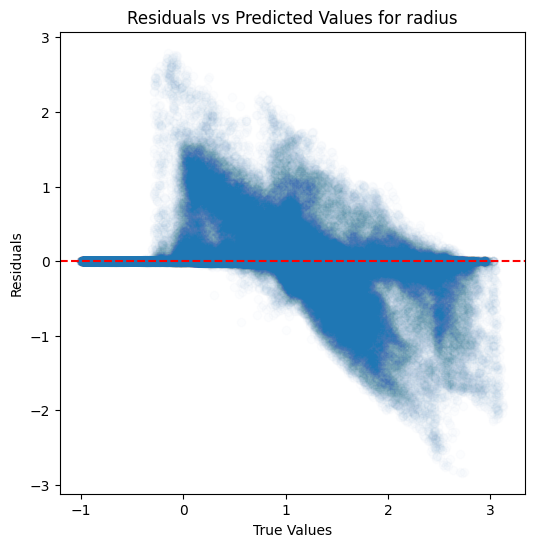

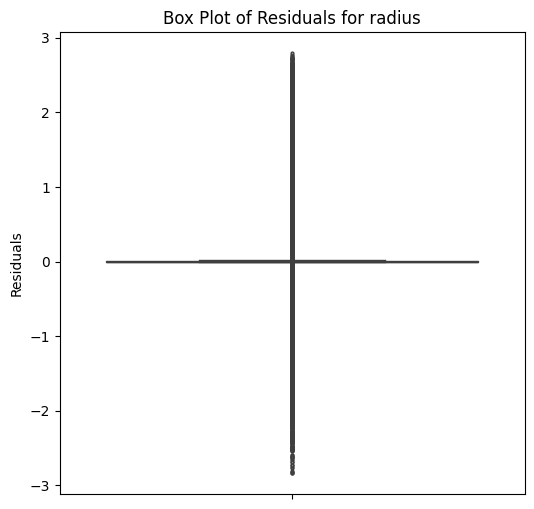

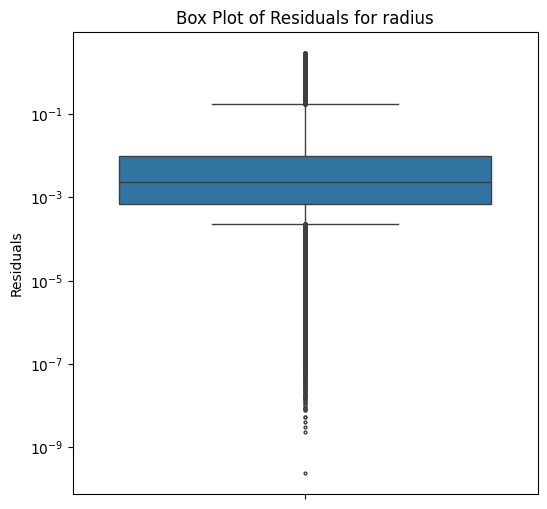

...

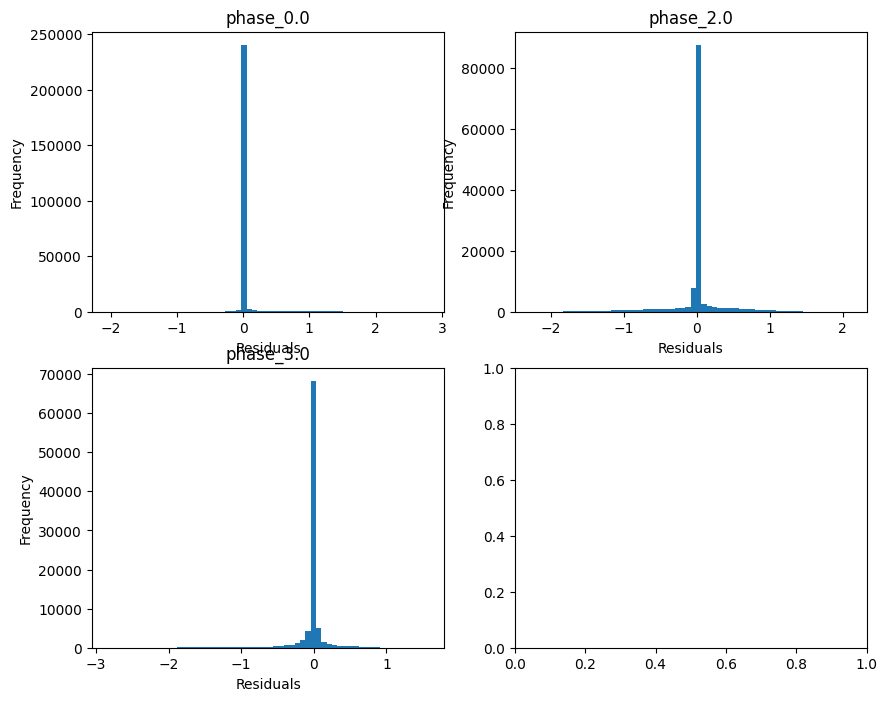

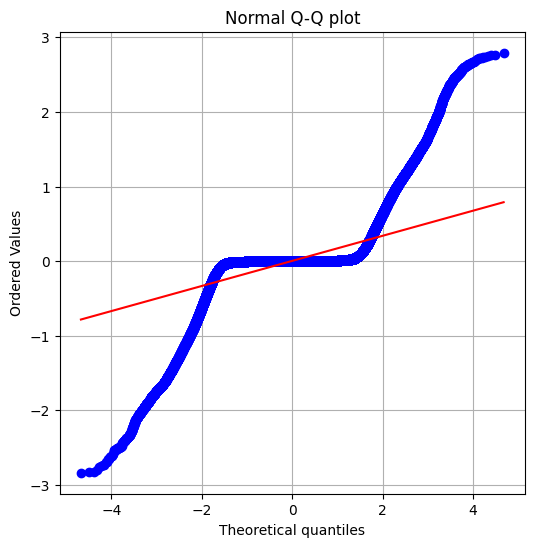

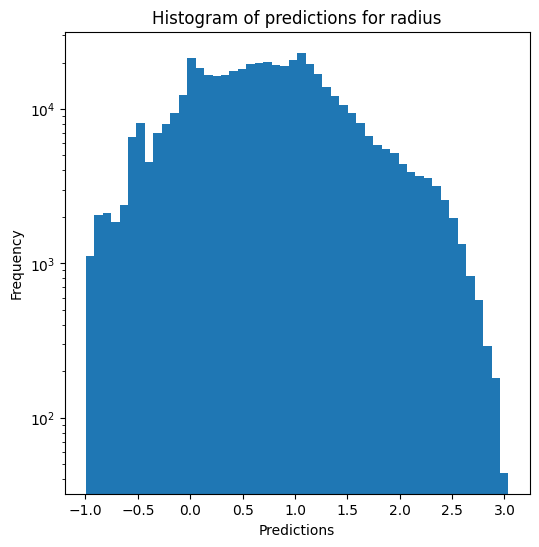

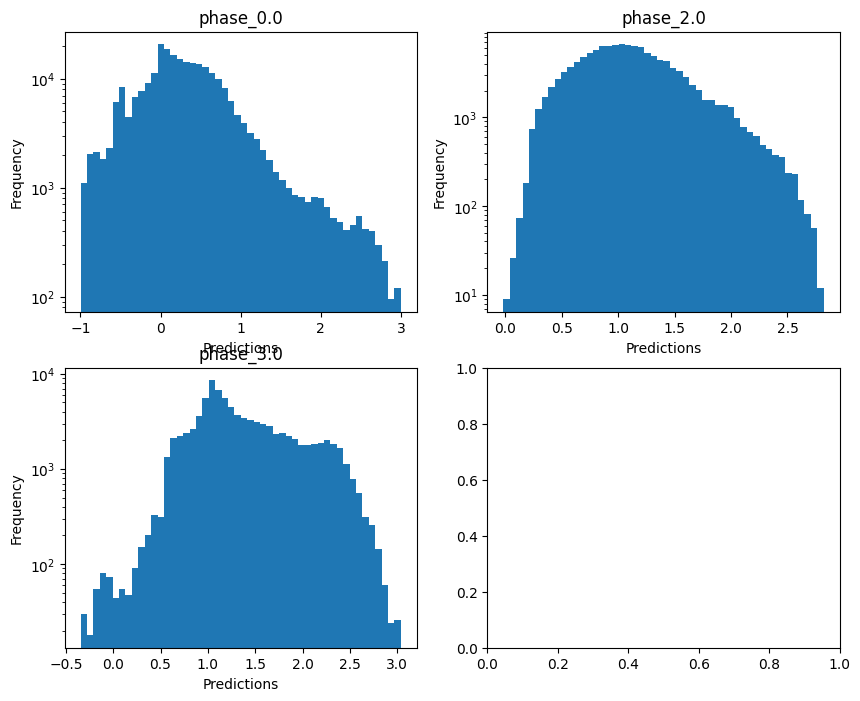

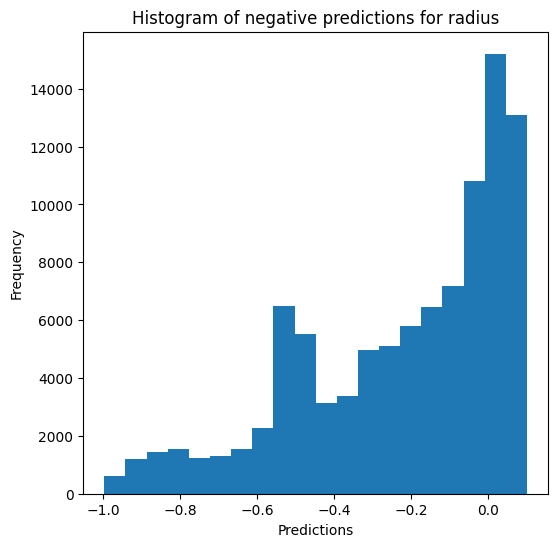

Saving predictions and results...


In [17]:
rf_evaluator.evaluate_Kfold_results(RandomForestRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name, n_jobs=5)
# average depth de 44-46

### XGBoost

In [18]:
xgb_evaluator = Model_evaluator("xgboost", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_robust train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.9412845284241762
  RMSE :  0.09189722588200055
  MAE :  0.05062235761703789
  MedAE :  0.0158869112925899
  CORR :  0.9704570973123287
  MAX_ER :  0.7977893164931849
  Percentiles : 
    75th percentile :  0.061654141346065505
    90th percentile :  0.15603029575622424
    95th percentile :  0.2222086972713166
    99th percentile :  0.34555300085014057

T_eff results for the phase category with a value of 2.0
  value range :  3.42785685311742 - 4.711472733477716
  RVE :  0.8742383305147967
  RMSE :  0.11426291742042242
  MAE :  0.0852585829931802
  MedAE :  0.06470018020936452
  CORR :  0.9356980450899091
  MAX_ER :  0.5008276385481665
  Percentiles : 
    75th percentile :  0.1186249642836783
    90th percentile :  0.18843018011671886
    95th p

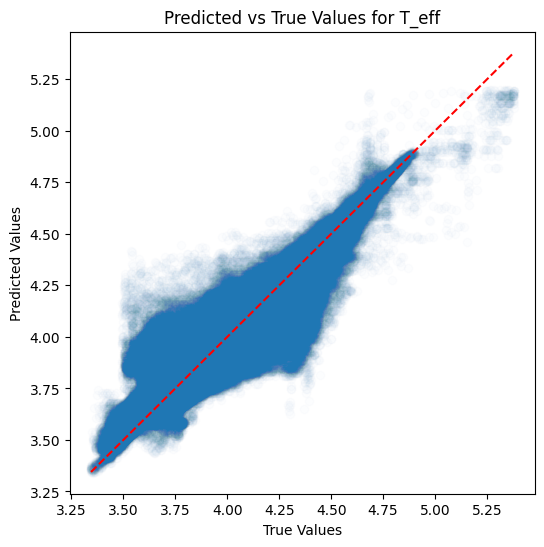

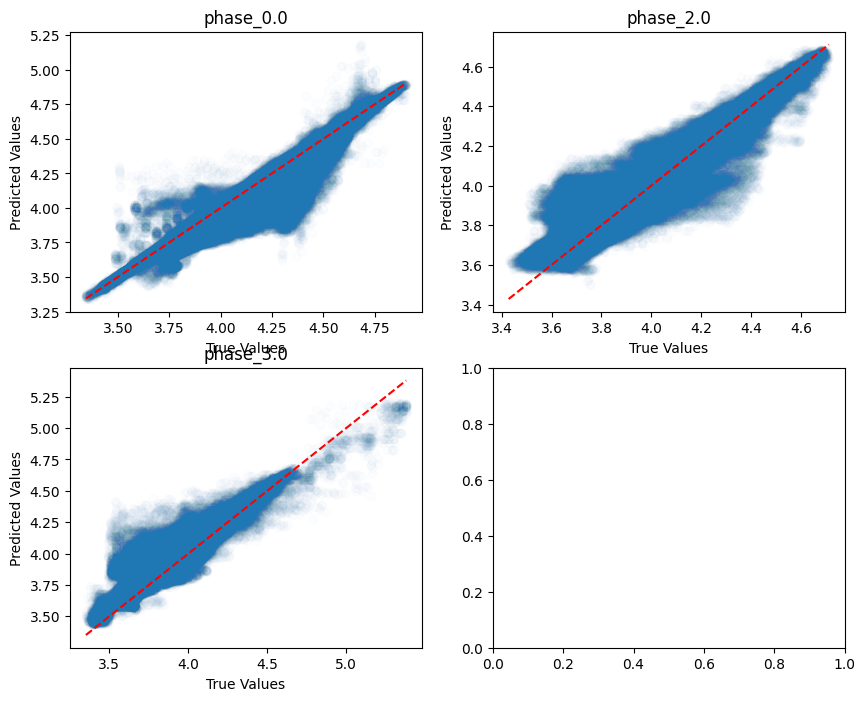

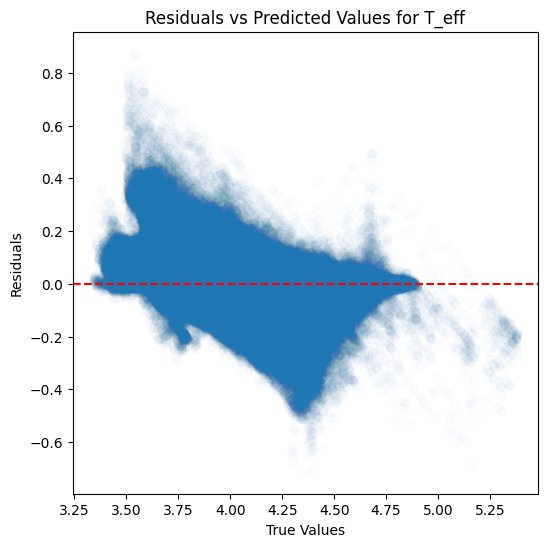

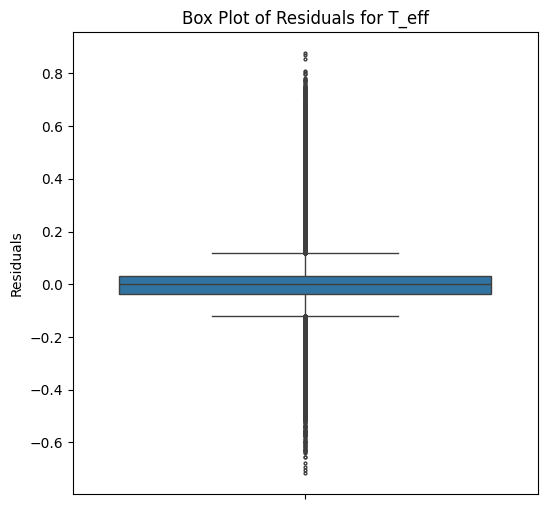

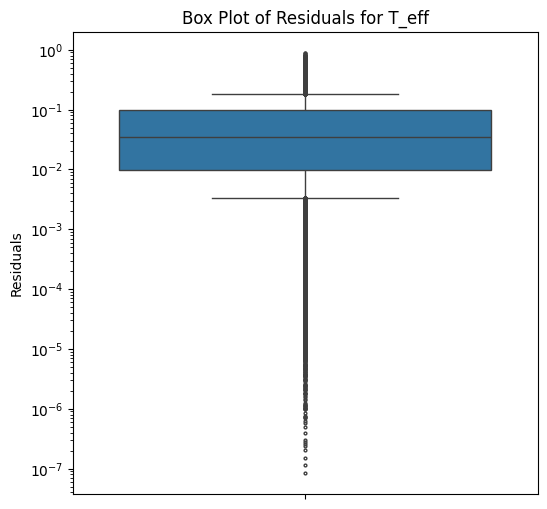

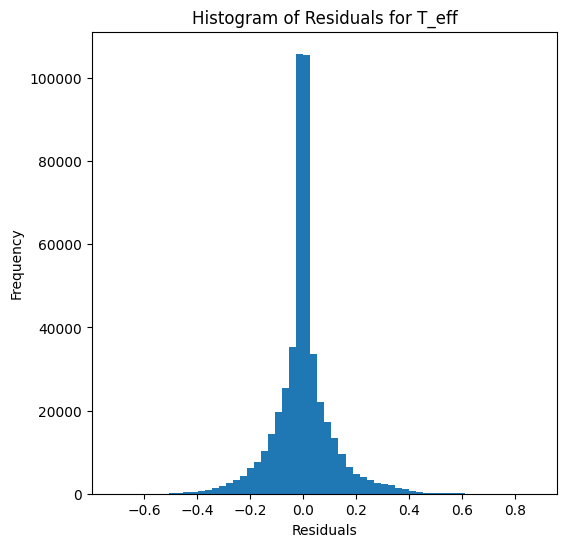

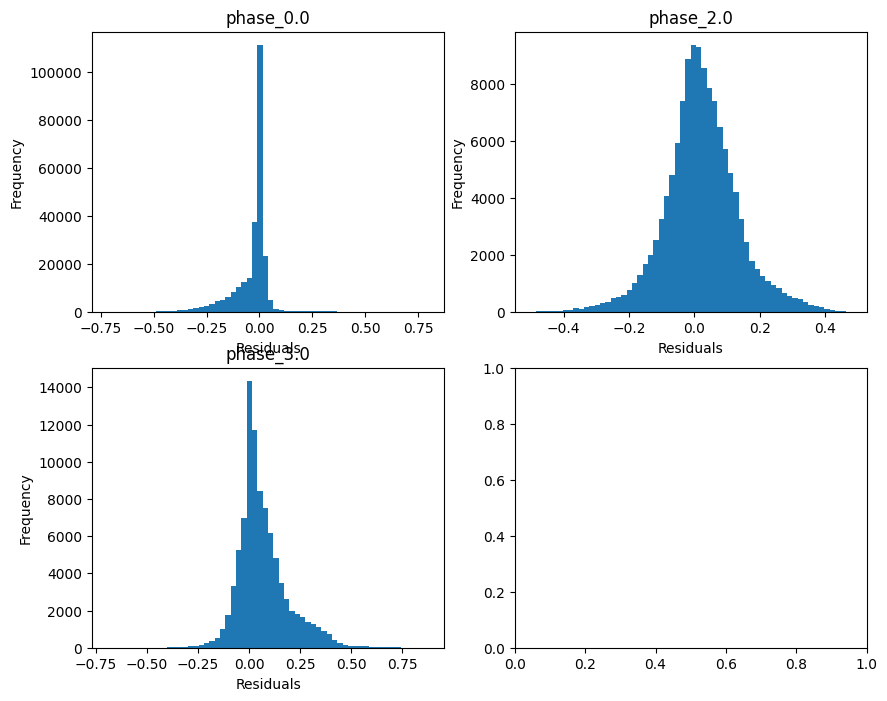

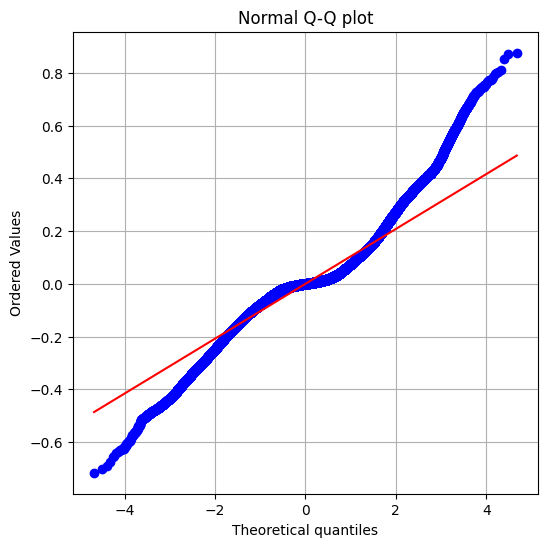

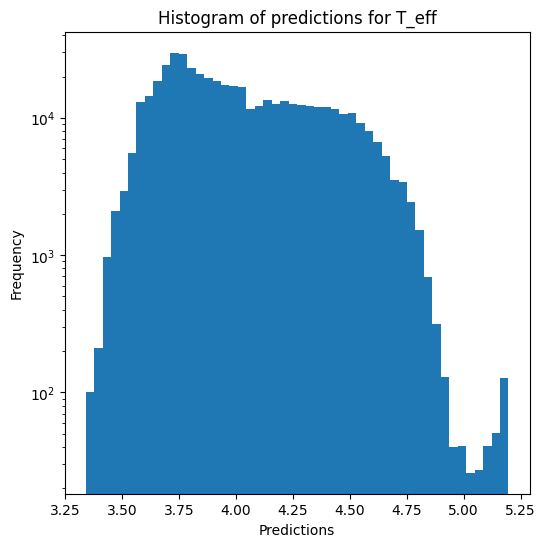

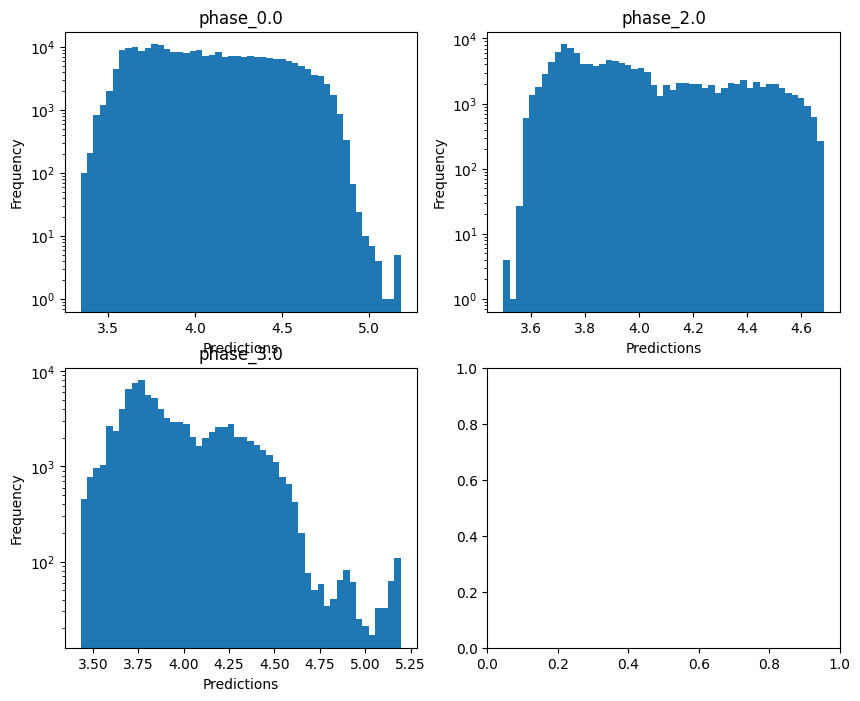


log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  0.44370923416826025
  RMSE :  0.5102070033643598
  MAE :  0.28516541569438353
  MedAE :  0.08393583407224536
  CORR :  0.834795780639791
  MAX_ER :  4.7215158379655975
  Percentiles : 
    75th percentile :  0.37748703788202653
    90th percentile :  0.8947469402345579
    95th percentile :  1.1916474729599196
    99th percentile :  1.717053691678871

log_g results for the phase category with a value of 2.0
  value range :  -0.2959230723262505 - 4.408311770676233
  RVE :  0.4147772819149461
  RMSE :  0.7032549884899036
  MAE :  0.528623317976349
  MedAE :  0.3972967693862426
  CORR :  0.6442449739008681
  MAX_ER :  3.6599712572358483
  Percentiles : 
    75th percentile :  0.7729284916801146
    90th percentile :  1.17903847351811
    95th percentile :  1.4495096935528677
    99th percentile :  2.0298811531355856

log_g results for the phase category with a value 

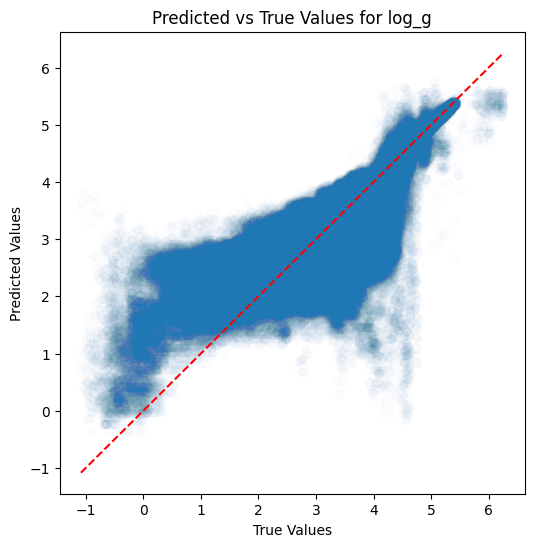

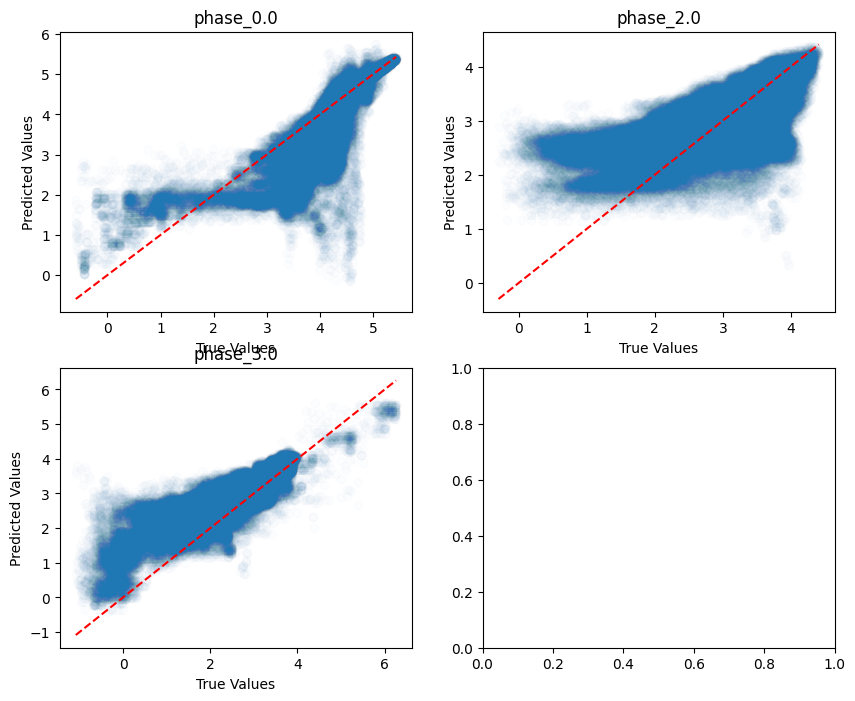

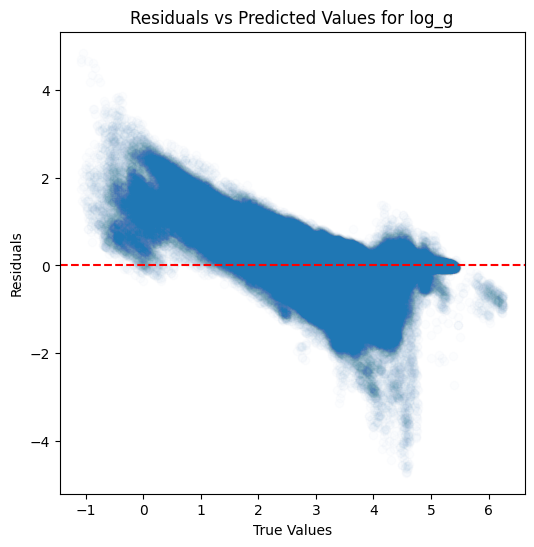

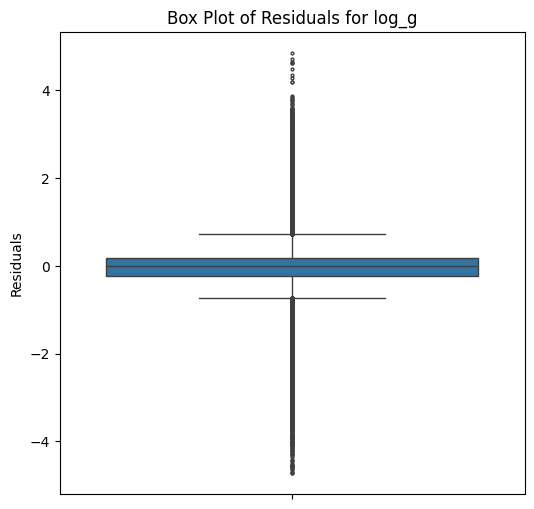

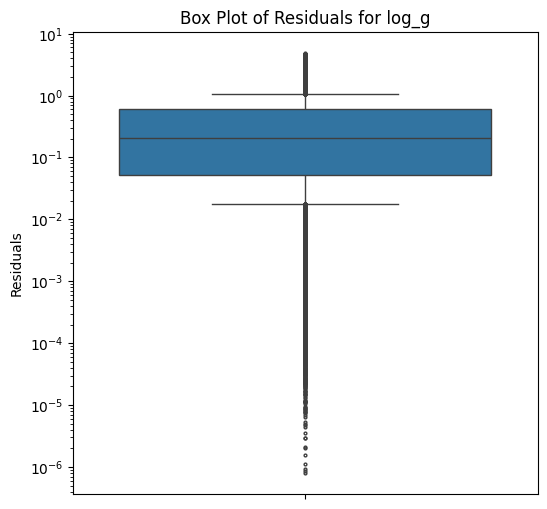

...

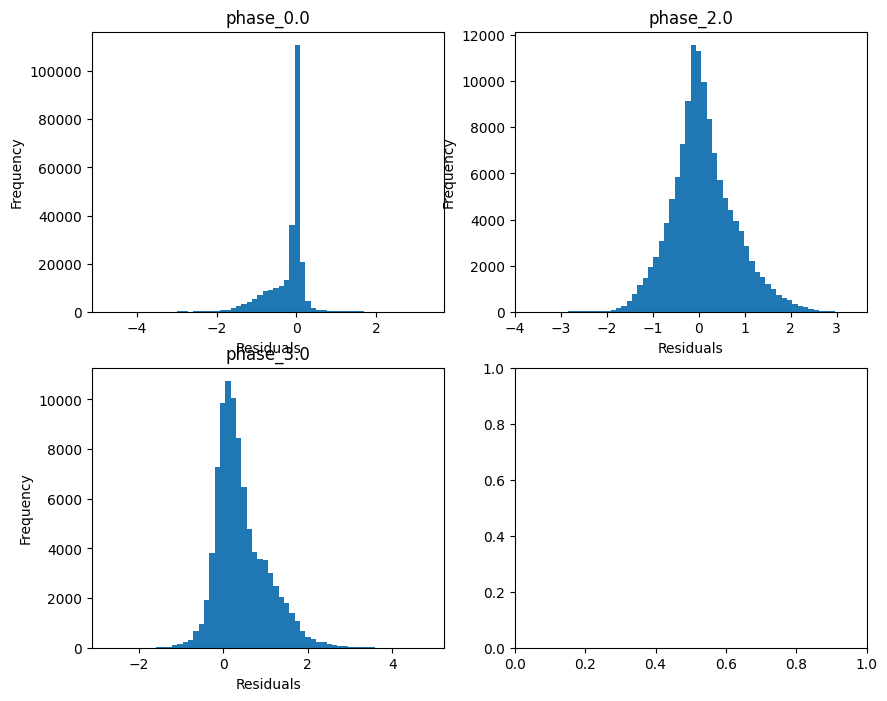

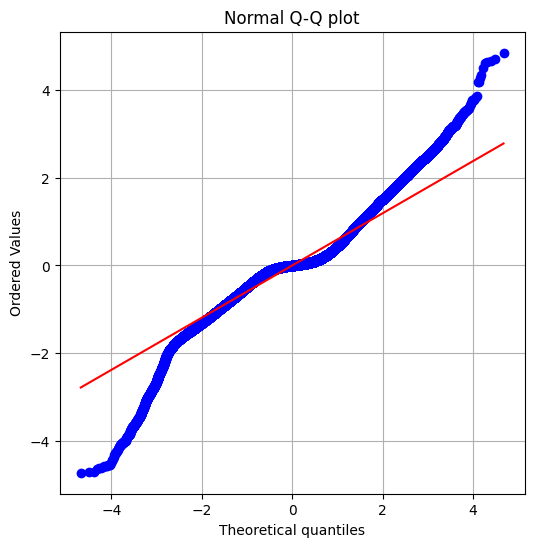

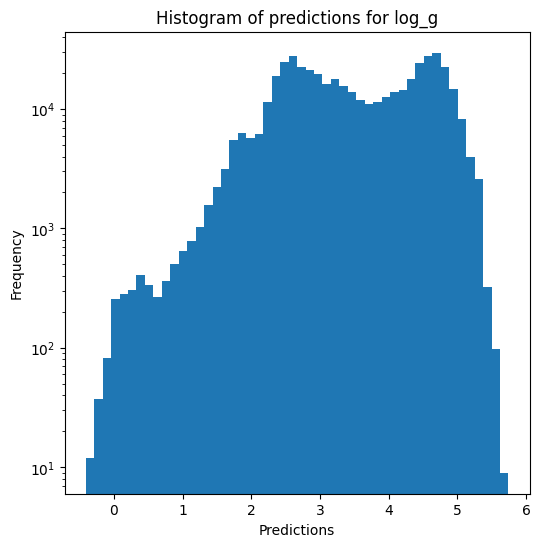

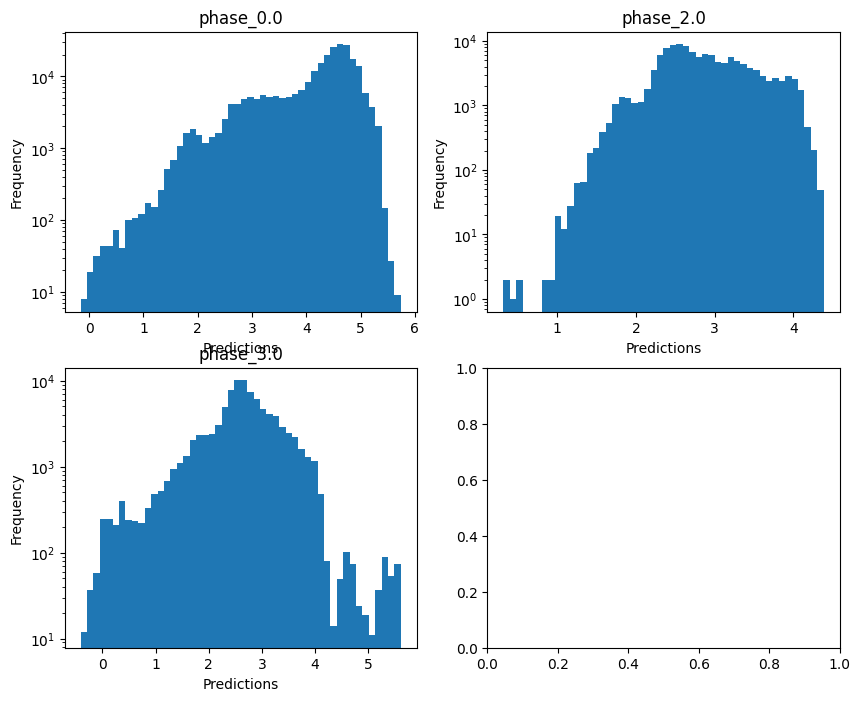

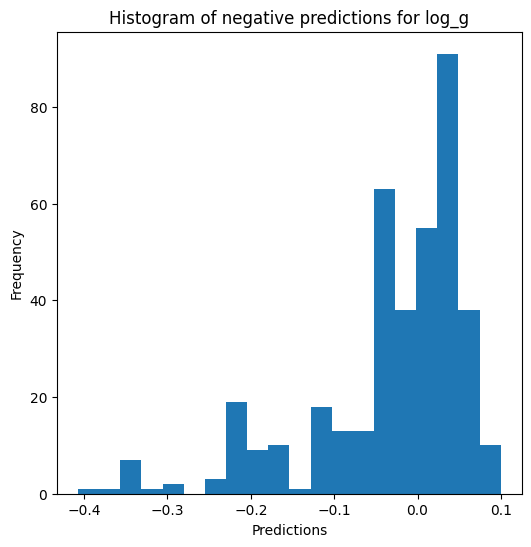


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.8322859950168372
  RMSE :  0.2549707550254593
  MAE :  0.14166910746357184
  MedAE :  0.03951757367808269
  CORR :  0.9316597340427875
  MAX_ER :  2.5184963124156097
  Percentiles : 
    75th percentile :  0.18680980051163582
    90th percentile :  0.44763565236621694
    95th percentile :  0.596873025047836
    99th percentile :  0.8589252473554412

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.891706235288321
  RVE :  0.4964120735229788
  RMSE :  0.35155446913351784
  MAE :  0.26419127344115295
  MedAE :  0.1980516345797647
  CORR :  0.7058451891876052
  MAX_ER :  1.8063822297466277
  Percentiles : 
    75th percentile :  0.3855892811167304
    90th percentile :  0.5895158002794558
    95th percentile :  0.725517101014043
    99th percentile :  1.0170107783316946

radius results for the phase category with 

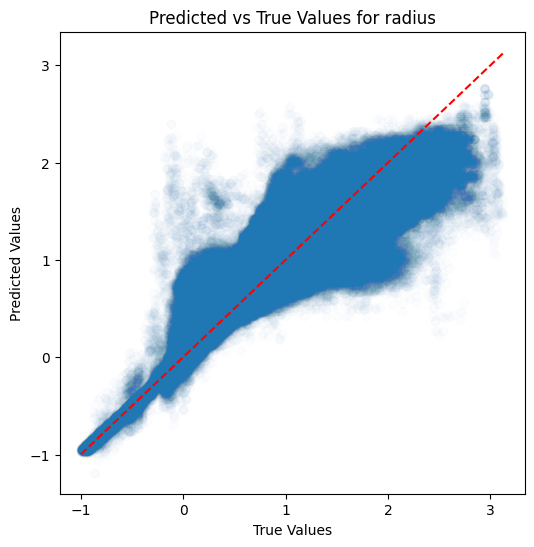

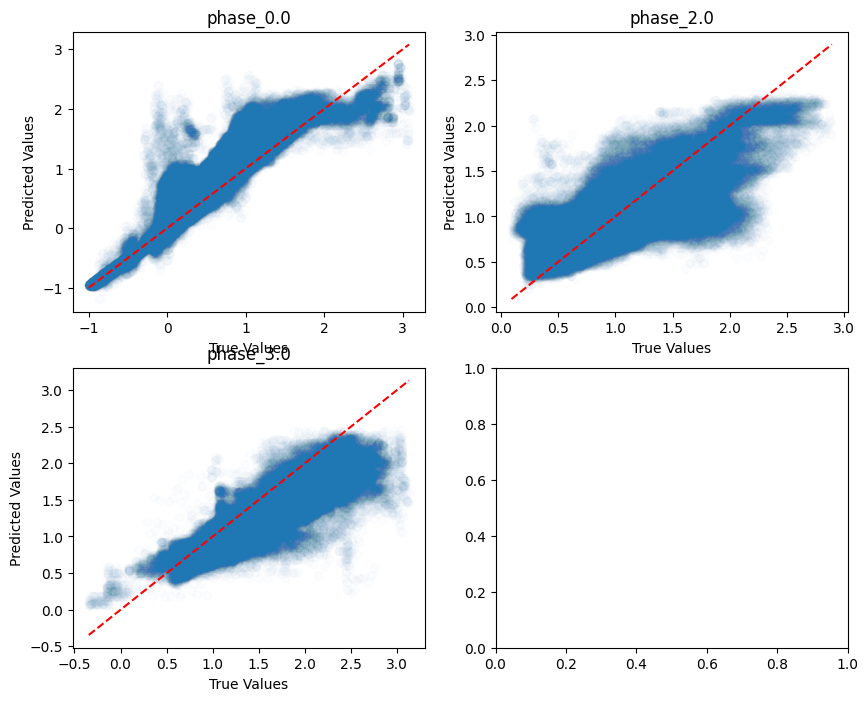

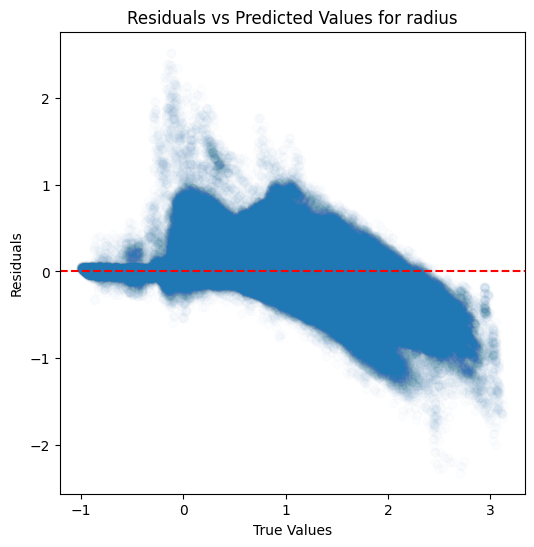

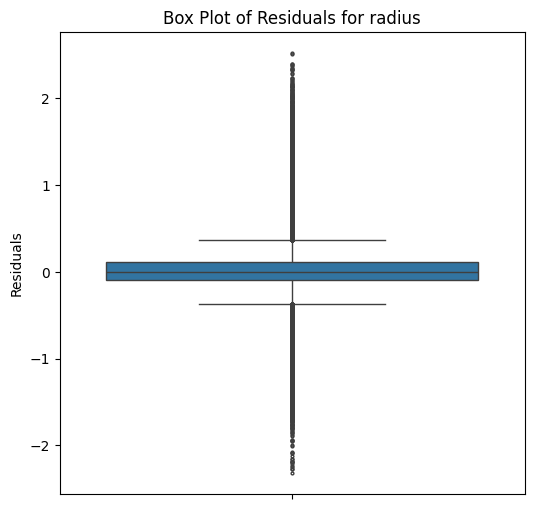

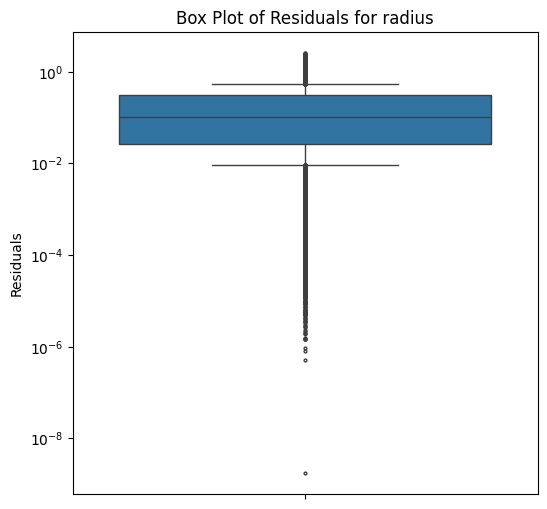

...

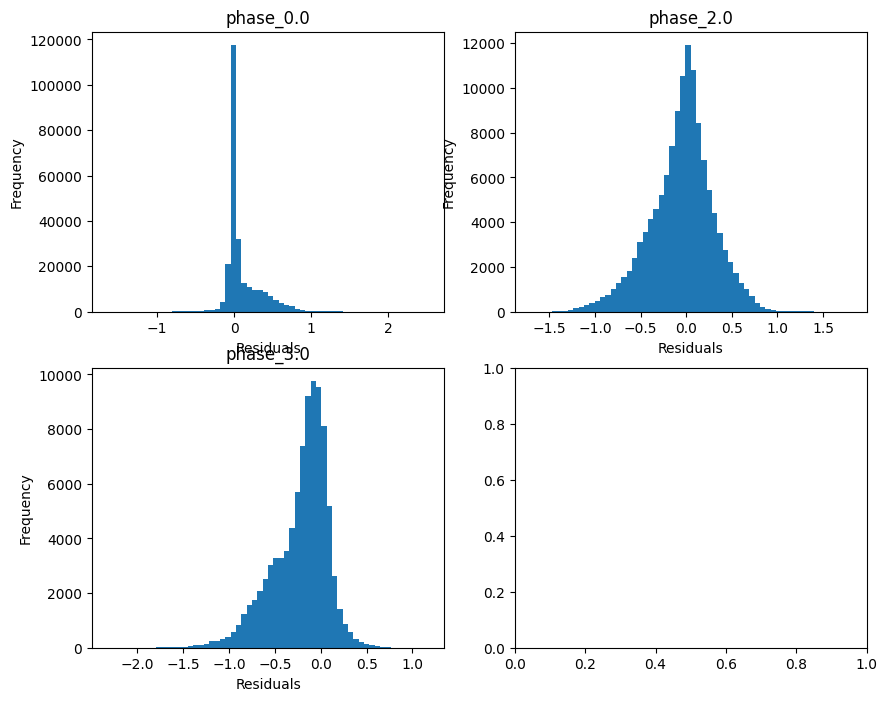

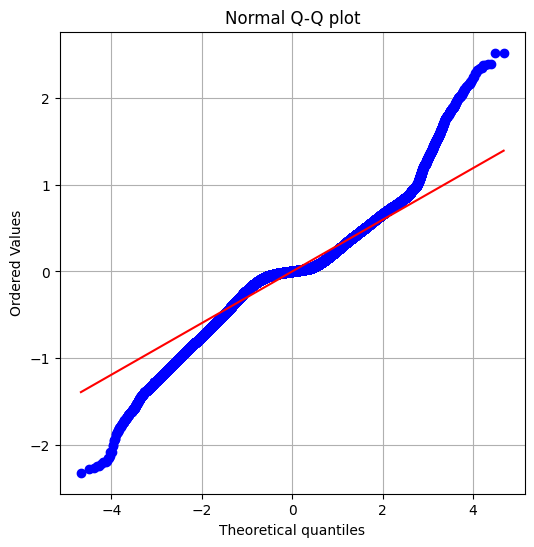

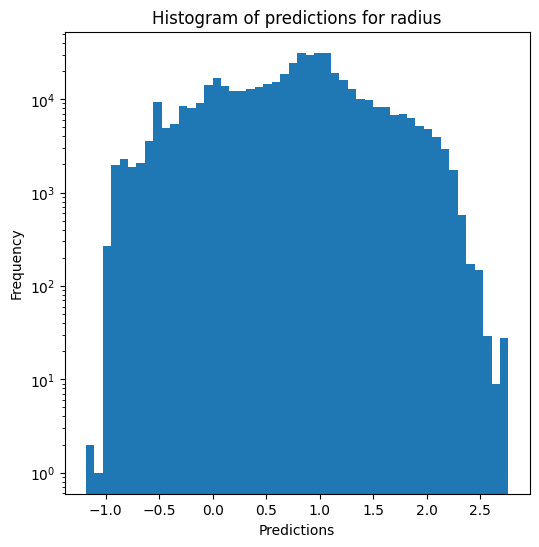

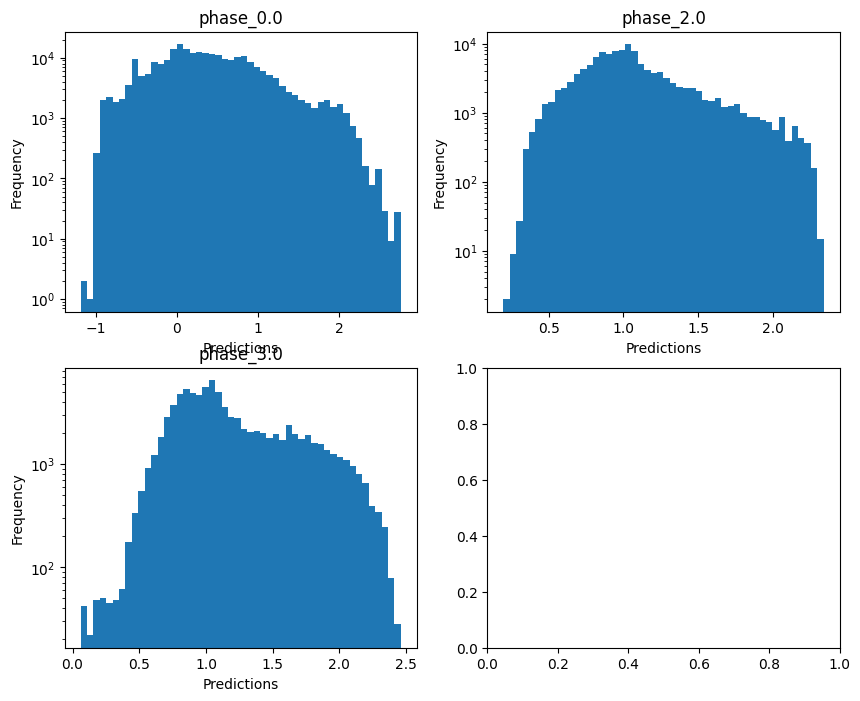

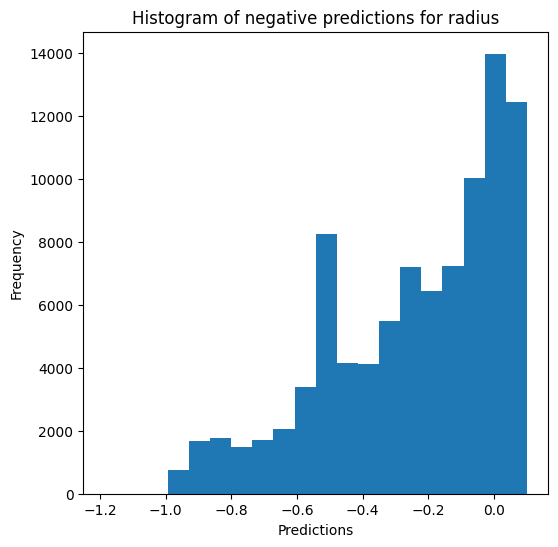

Saving predictions and results...


In [19]:
xgb_evaluator.evaluate_Kfold_results(XGBRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name, n_jobs=5)

### Multi-layer perceptron

In [20]:
mlp_evaluator = Model_evaluator("mlp", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_robust train data :
Performing K-fold...
Split 1 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.08321669820343758
2 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.08338650527323226
3 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.08202416464084682
4 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.08355453333184387
5 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.0841156998189357

Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.9270646642584757
  RMSE :  0.09631604720287448
  MAE :  0.05835209363168499
  MedAE :  0.033544135846385936
  CORR :  0.9640408595762875
  MAX_ER :  0.8291517412322422
  Percentiles : 
    75th percentile :  0.06242010724365943
    90th percentile :  0.1408757849958405
    95th percentile :  0.23354821645218182
    99th percentile :  0.38637352738242786

T_eff results for the phase category with a value of 2.0
  value range :  3.42785685311742 - 4.711472733477716
  RVE :  0.857706280437711
  RMSE :  0.12032494320091969
  MAE :  0.087937352639163
  MedAE :  0.06367576900270322
  CORR :  0.9264405781300954
  MAX_ER :  0.6670096452097773
  Percentiles : 
    75th percentile :  0.11965961050151663
    90th percentile :  0.19920982406168009
    95th percentile :  0.26083699249599346
    99th percentile :  

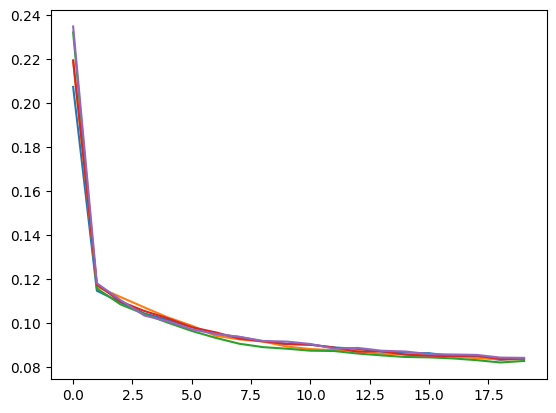

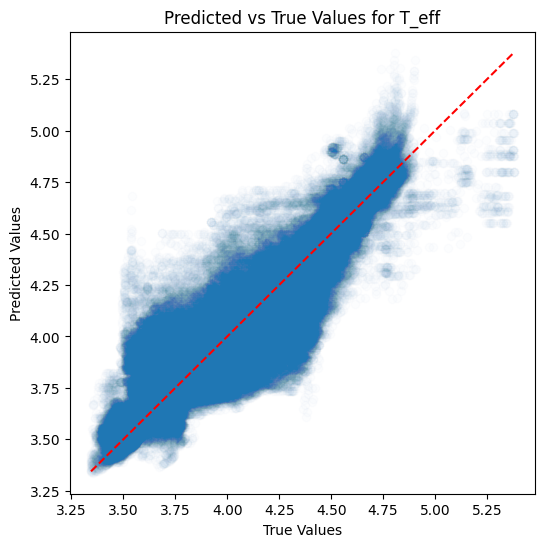

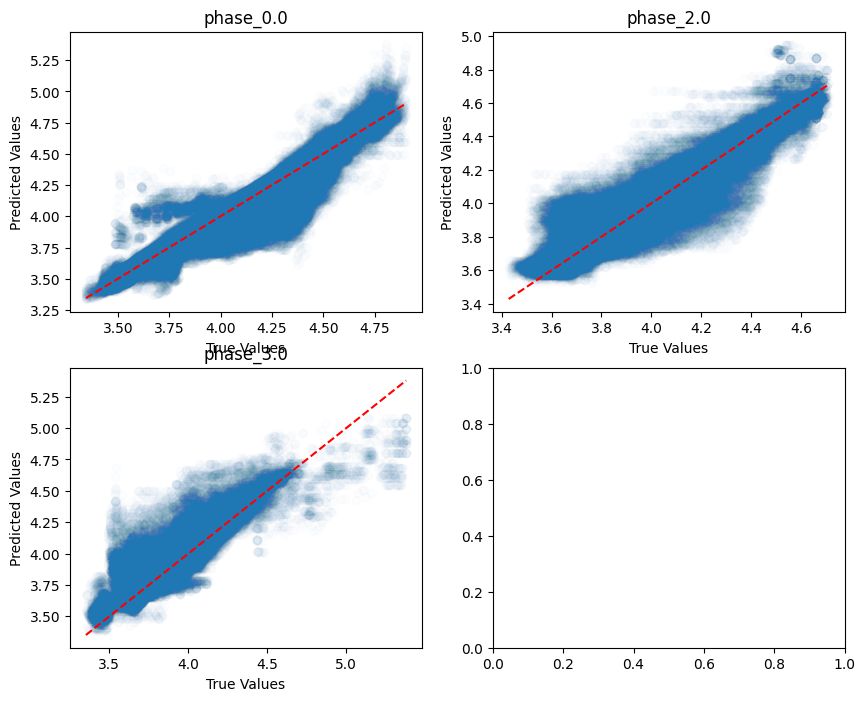

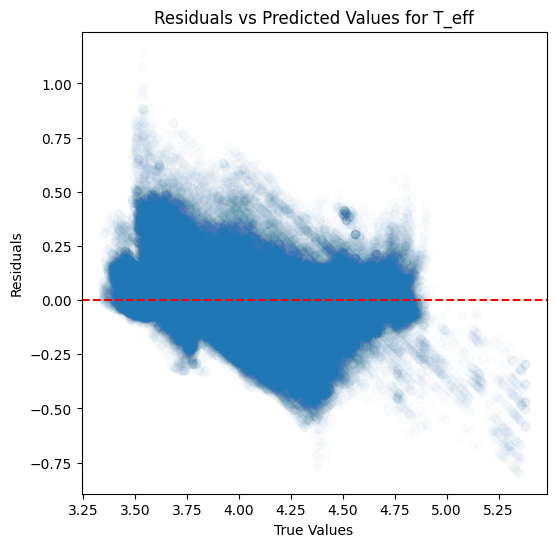

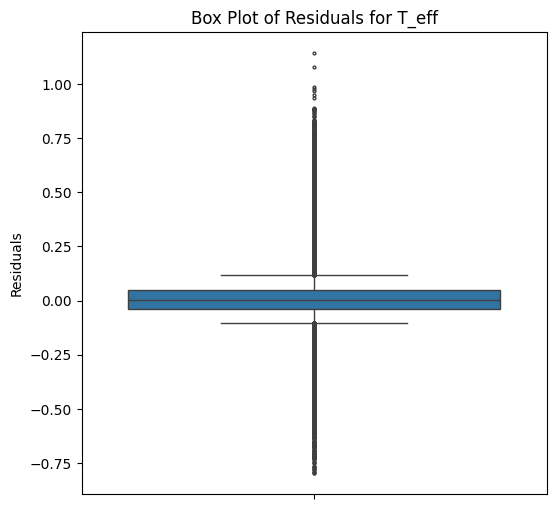

...

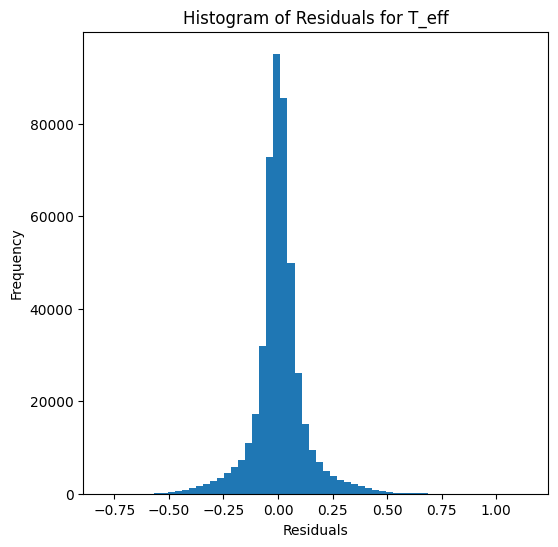

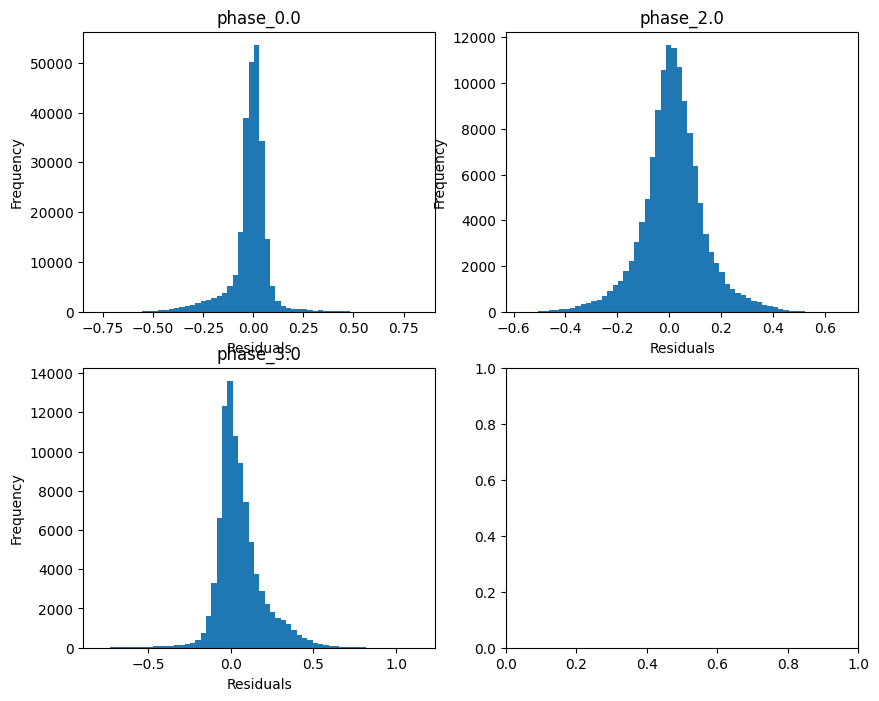

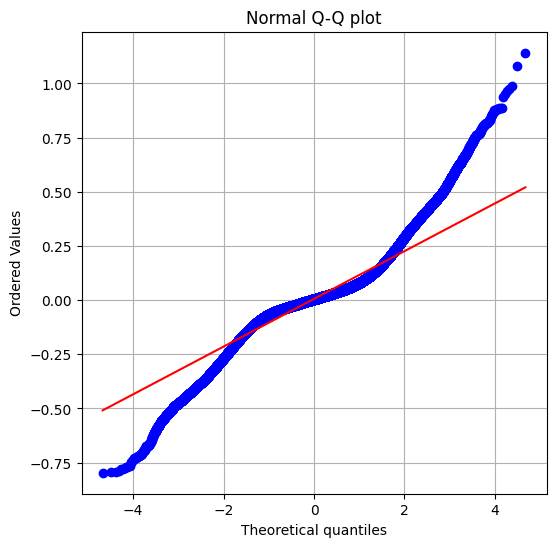

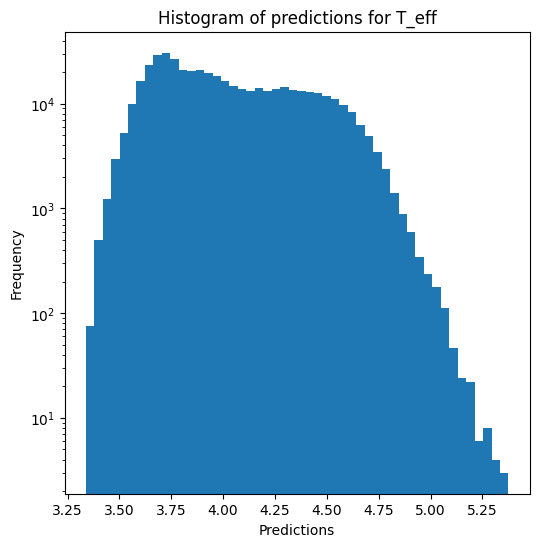

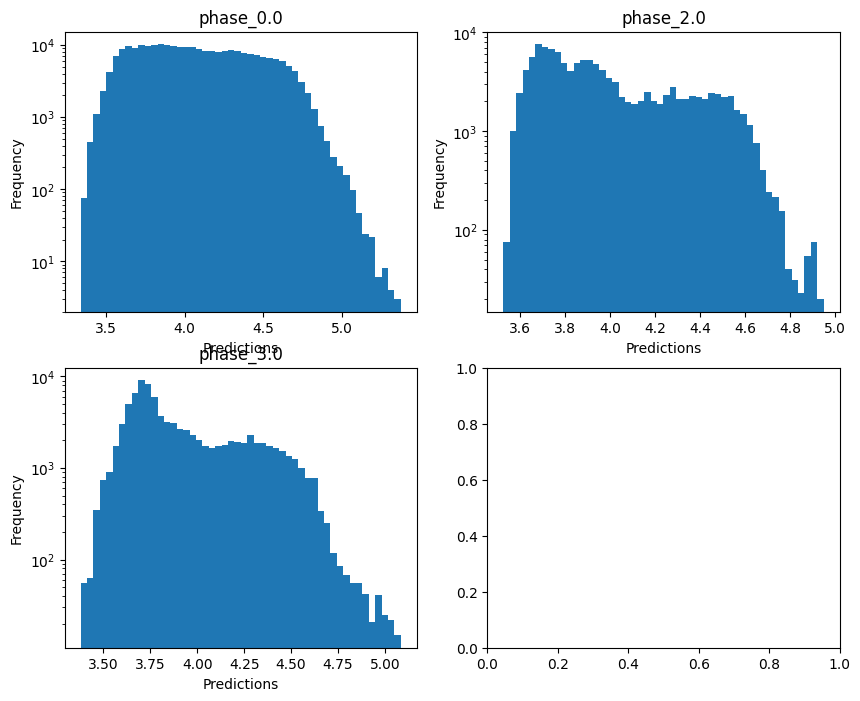


log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  0.404804456462337
  RMSE :  0.5007984339676844
  MAE :  0.22371454264063895
  MedAE :  0.05746533658204678
  CORR :  0.8055732769696478
  MAX_ER :  4.128841235169736
  Percentiles : 
    75th percentile :  0.12869879548975172
    90th percentile :  0.7561709383163708
    95th percentile :  1.3011390142631294
    99th percentile :  1.9941410408016014

log_g results for the phase category with a value of 2.0
  value range :  -0.2959230723262505 - 4.408311770676233
  RVE :  0.41031385054164404
  RMSE :  0.7018982325417633
  MAE :  0.528525783730087
  MedAE :  0.39411234702822595
  CORR :  0.6460291461396649
  MAX_ER :  3.090744340146765
  Percentiles : 
    75th percentile :  0.7690248389643596
    90th percentile :  1.2035887546982906
    95th percentile :  1.4698300482937023
    99th percentile :  1.9750970406851427

log_g results for the phase category with a valu

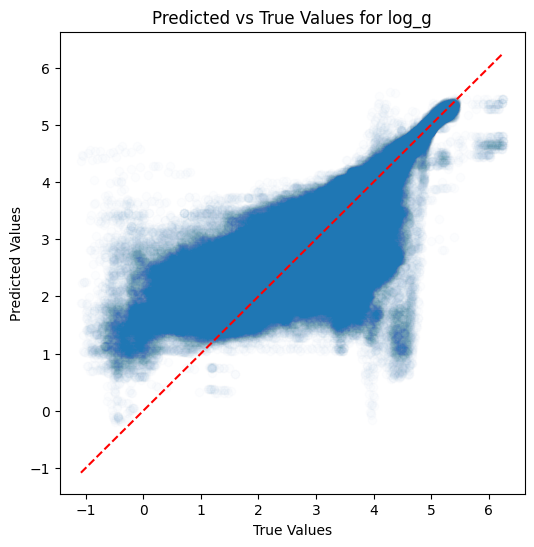

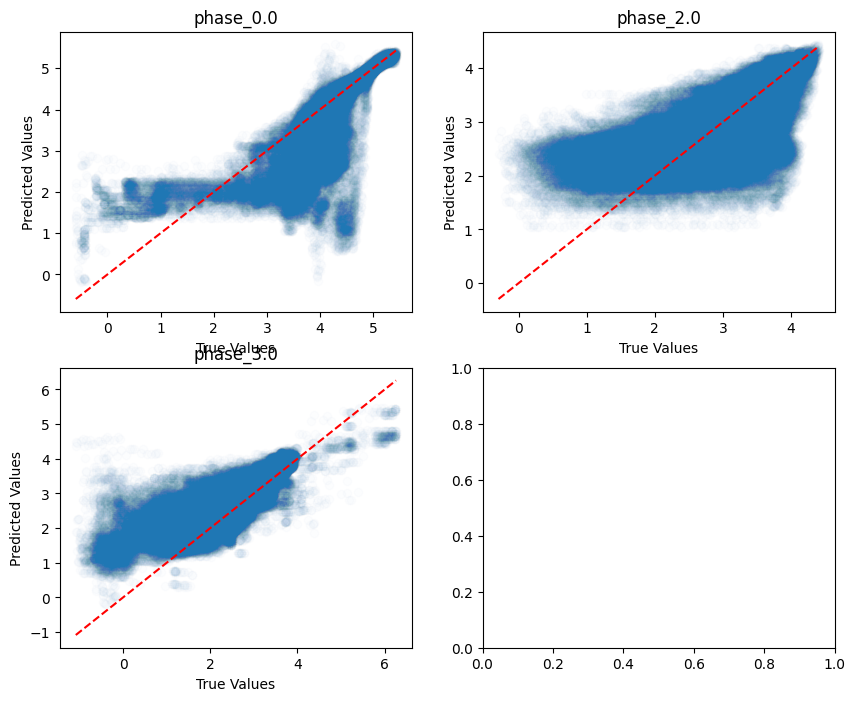

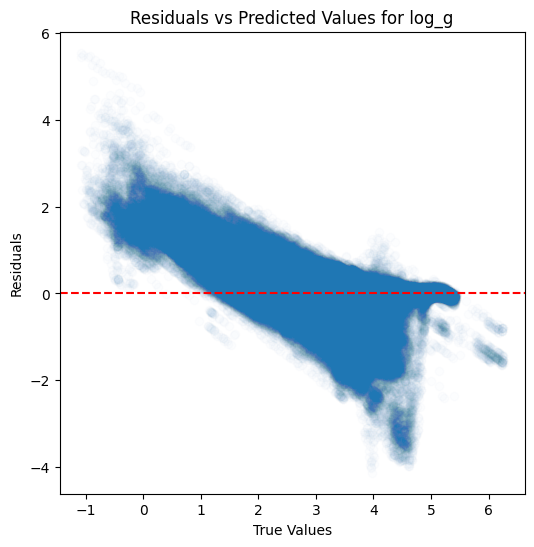

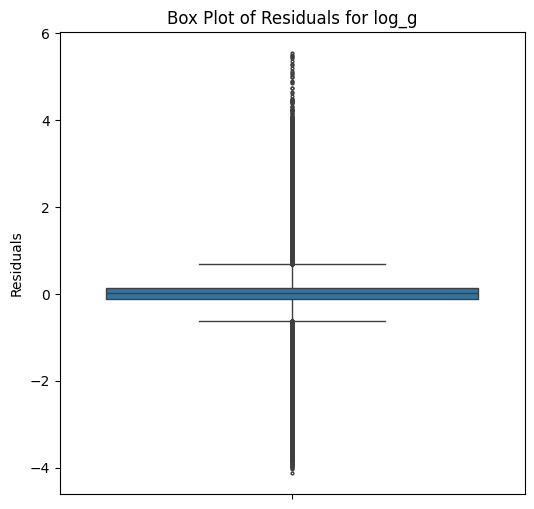

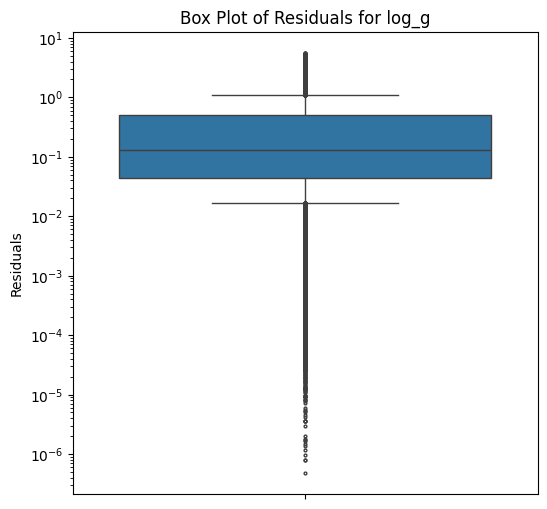

...

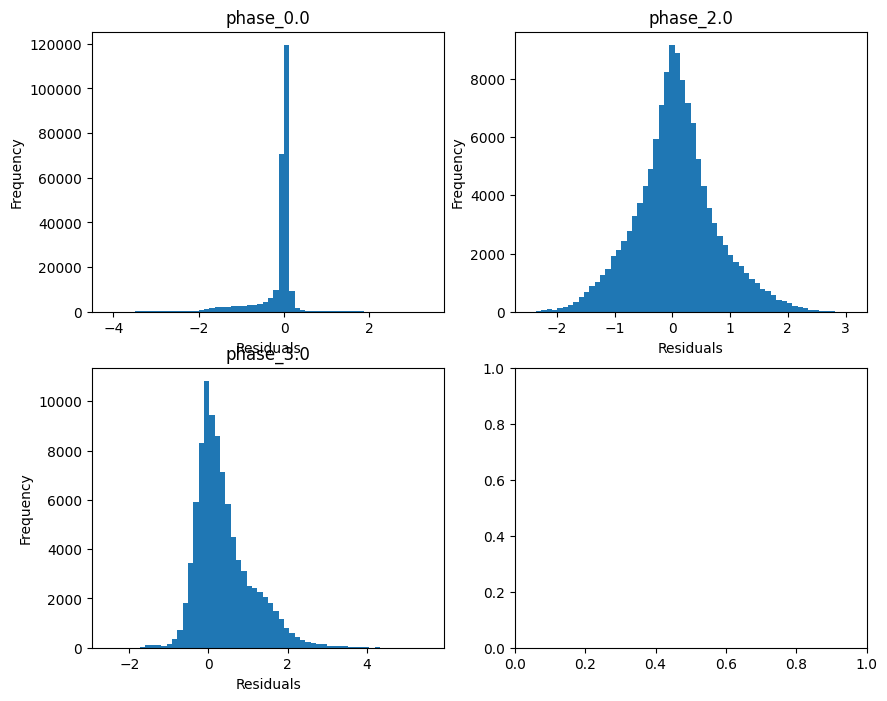

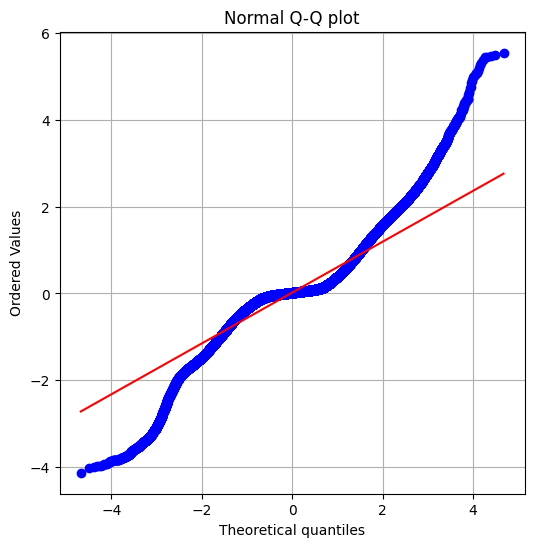

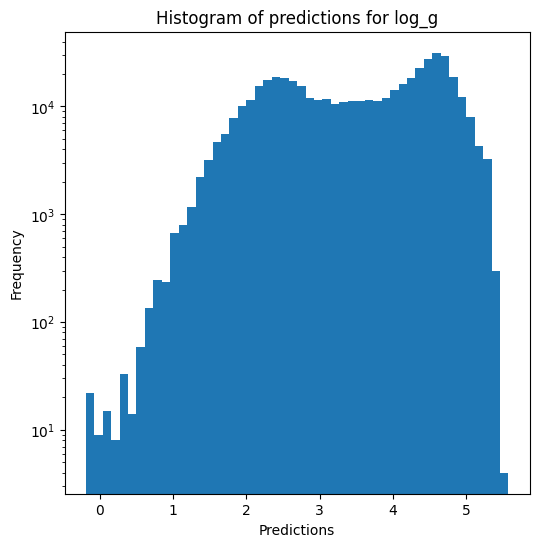

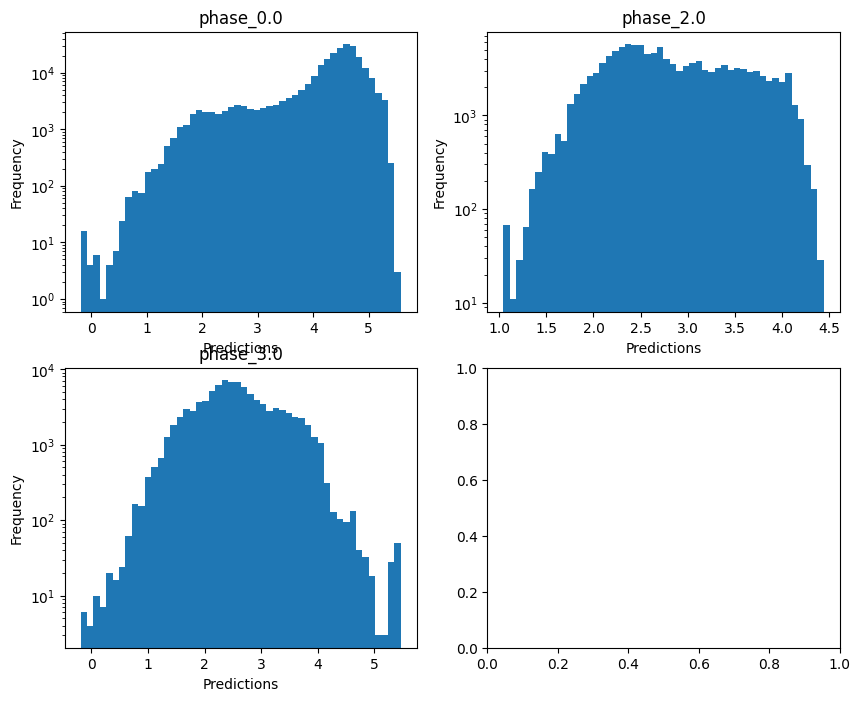

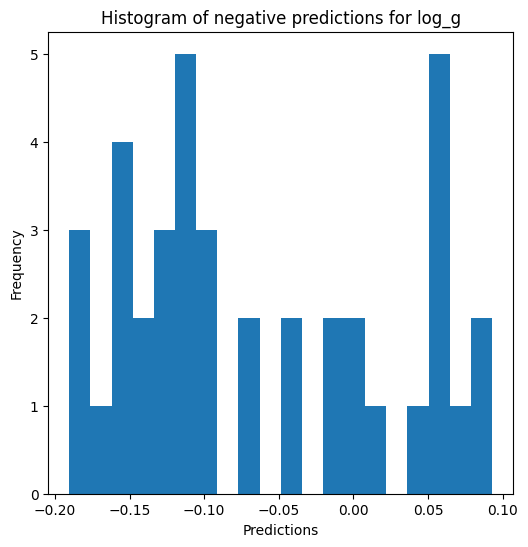


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.8161209159567955
  RMSE :  0.253205435501465
  MAE :  0.1225588441599943
  MedAE :  0.044297949268543156
  CORR :  0.9225180050411218
  MAX_ER :  2.1341705547227146
  Percentiles : 
    75th percentile :  0.09059786243581211
    90th percentile :  0.3783890839899896
    95th percentile :  0.6569590913123533
    99th percentile :  1.0041800542644674

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.891706235288321
  RVE :  0.4891862246144547
  RMSE :  0.3522193182704612
  MAE :  0.2651629766207856
  MedAE :  0.1980865375225338
  CORR :  0.7068320704446686
  MAX_ER :  1.5360451525821017
  Percentiles : 
    75th percentile :  0.3867906329166688
    90th percentile :  0.6032167439120001
    95th percentile :  0.7364739378730645
    99th percentile :  0.991829561378498

radius results for the phase category with a v

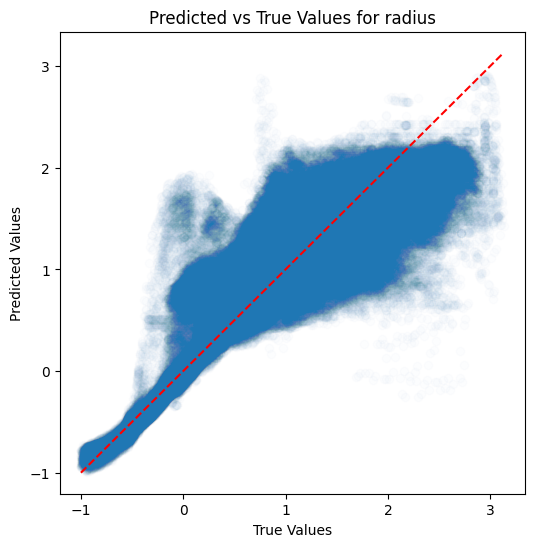

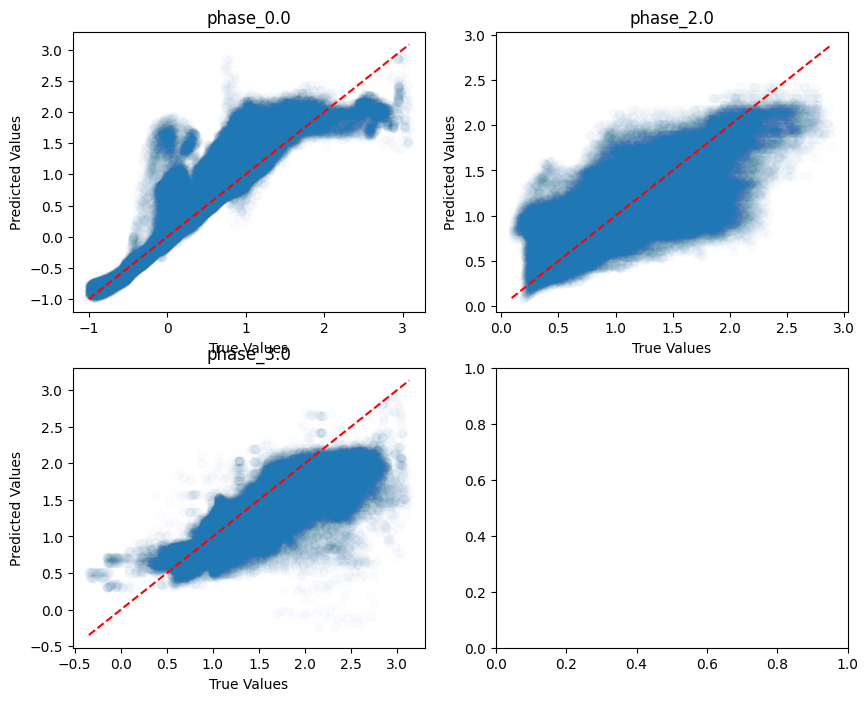

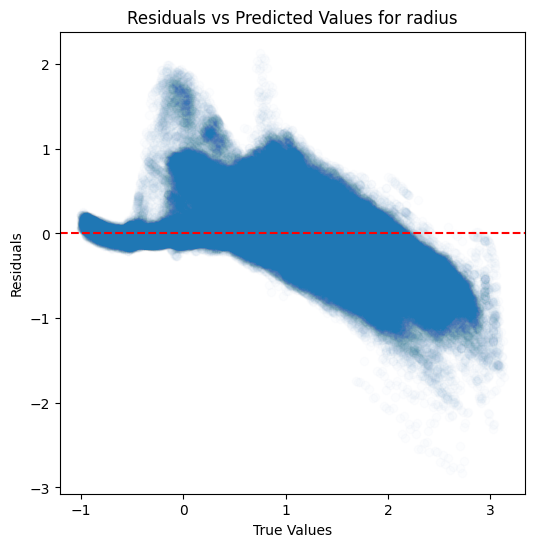

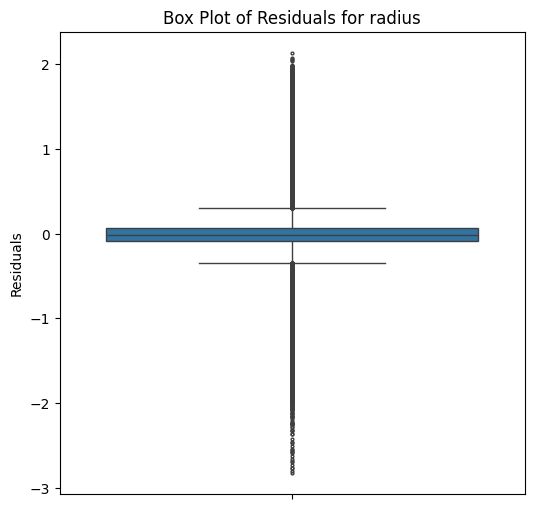

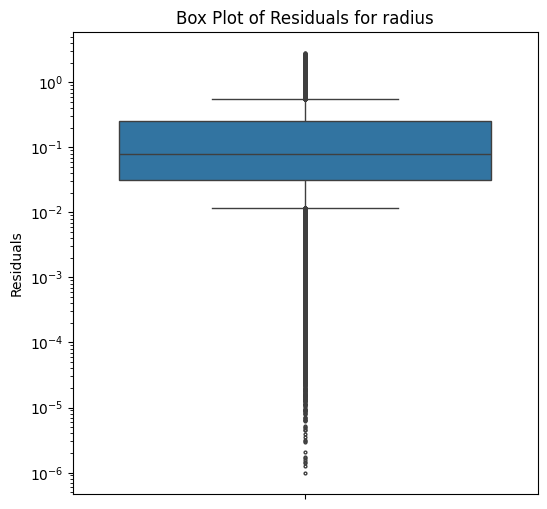

...

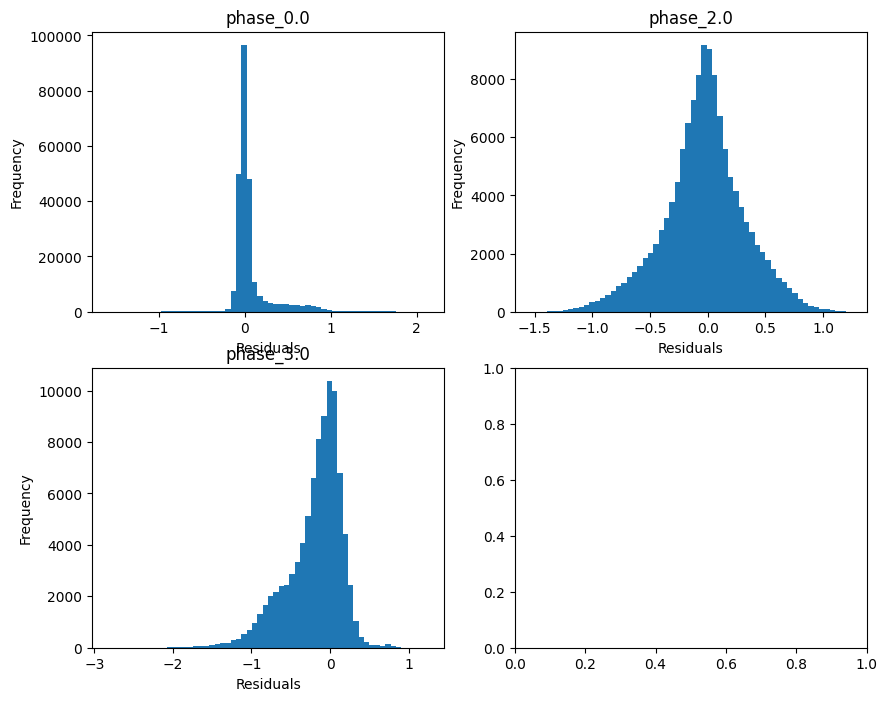

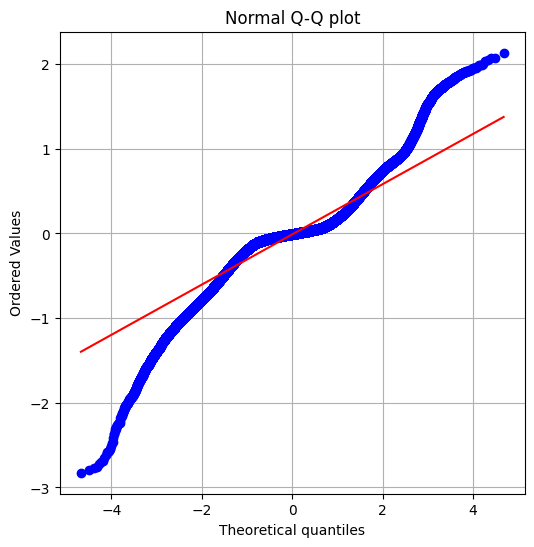

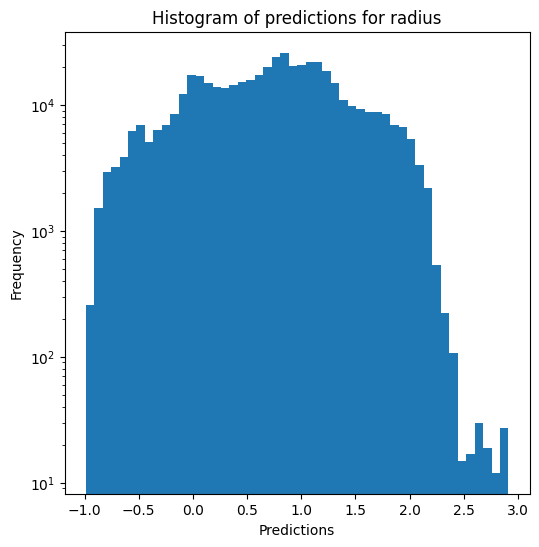

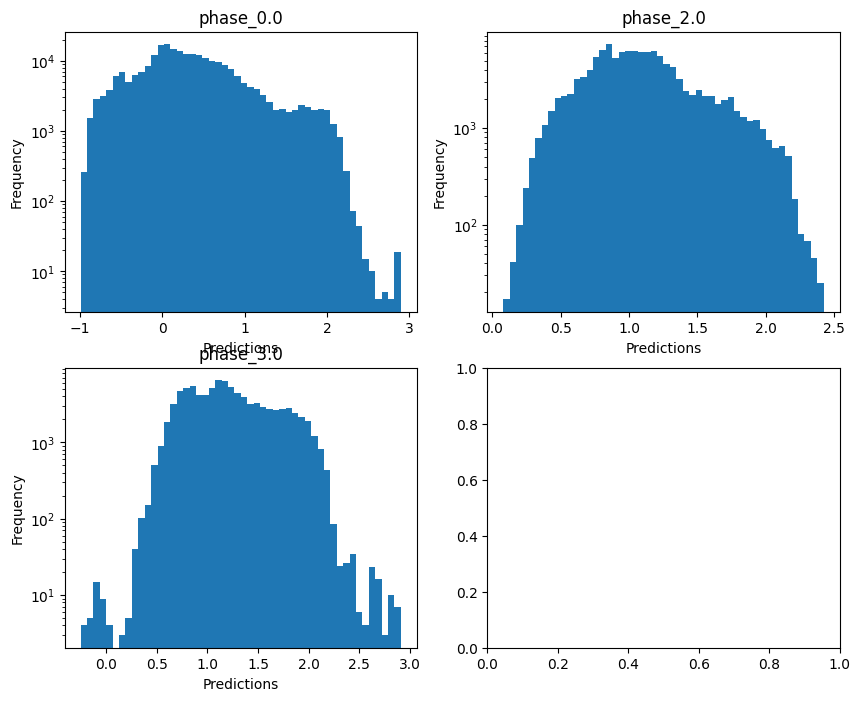

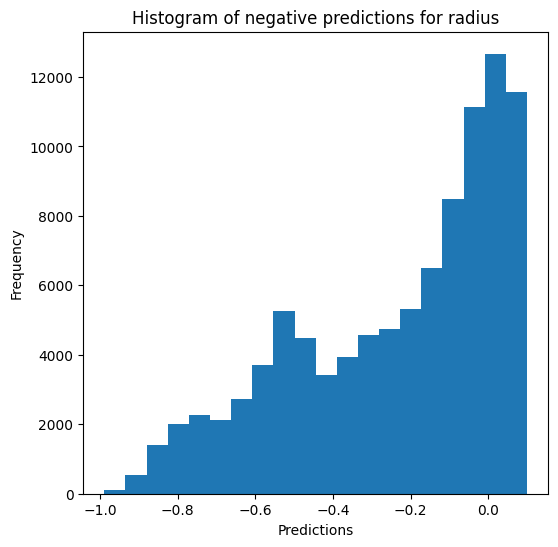

Saving predictions and results...


In [21]:
mlp_evaluator.evaluate_Kfold_results(MLPRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, n_splits=5, random_state=12, override=override, use_preds=use_preds, save=save, scaler_name=scaler_name, show=show,
                                      hidden_layer_sizes = (100, 100, 100, 100), max_iter=20, batch_size=400)

Avec batch_size=auto (200):

plus de 30 minutes pour entrainer un seul split de Kfold avec les paramètres par défaut (1 hidden layer de taille 100)

plus de 15 minutes pour entrainer un seul split de Kfold avec les 1 hidden layer de taille 10

- et max_iter=20, hidden_layer_sizes=(100, 50, 25): ~5 minutes par fold (plutôt bon résultats)
- et max_iter=20, hidden_layer_sizes=(100, 100, 100): ~5 minutes par fold

Avec batch_size=400:


Avec learning_rate= :


hidden_layer_sizes = (100, 100), max_iter=20, batch_size=200 => 17 min pour 2 splits et min_loss de 2.1
RMSE = RVE :  0.984867927459382
RMSE :  2.5335132759292107
MAE :  0.7276983504493552
MedAE :  0.3034009994265745
CORR :  0.9927285673947535
MAX_ER :  169.74348568157313
Percentiles : 75th percentile :  0.5113604728134682 90th percentile :  1.1025928446049704 95th percentile :  2.1347654852226015 99th percentile :  9.897101952249908)

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=400 => 7 min pour 2 splits et min_loss de 2.2
RVE :  0.9797171492755655
RMSE :  2.983208723004754
MAE :  0.9125599339275378
MedAE :  0.43124518658659683
CORR :  0.9920536596906272
MAX_ER :  170.53076478793002
Percentiles : 75th percentile :  0.675744507049632 90th percentile :  1.2421052024331438 95th percentile :  2.441733387262636 99th percentile :  11.925724226452427

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=800 => 3 min pour 2 splits et min_loss de 2.3 et 2.7

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=1600 => 3 min 30 pour 2 splits et min_loss de 7.8 et 3.8

=> batch_size plus grand == plus rapide mais moins bon